In [1]:
import os
import sys
import psutil

import pandas as pd
import numpy as np

import keras
import random

from keras.models import Sequential,Model
from keras.layers import Dense,LSTM,Activation,Dropout,BatchNormalization,Input,Embedding
from keras.layers import Flatten,Conv2D,MaxPooling2D,Bidirectional,concatenate

from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras import regularizers
from keras import optimizers
import keras_metrics as km

import matplotlib
import matplotlib.pyplot as plt
import math
from multiprocessing import cpu_count,Pool 
import multiprocessing


from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from keras.utils import np_utils
from sklearn.metrics import recall_score,precision_score,f1_score,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

from sklearn.metrics import make_scorer
from keras.wrappers.scikit_learn import KerasClassifier


from sklearn.metrics import roc_curve, auc

from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from keras_self_attention import SeqSelfAttention


/usr/local/anaconda5/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
from keras import backend as K
def weighted_categorical_crossentropy(weights):
    """
    A weighted version of keras.objectives.categorical_crossentropy
    
    Variables:
        weights: numpy array of shape (C,) where C is the number of classes
    
    Usage:
        weights = np.array([0.5,2,10]) # Class one at 0.5, class 2 twice the normal weights, class 3 10x.
        loss = weighted_categorical_crossentropy(weights)
        model.compile(loss=loss,optimizer='adam')
    """
    weights = K.variable(weights)      
    def loss(y_true, y_pred):
        # scale predictions so that the class probas of each sample sum to 1
        y_pred /= K.sum(y_pred, axis=-1, keepdims=True)
        # clip to prevent NaN's and Inf's
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # calc
        loss = y_true * K.log(y_pred) * weights
        loss = -K.sum(loss, -1)
        return loss
    
    return loss

In [3]:
SEQ=8
verbose = 2
dropout=0.3
ACT_POSTERIOR = 'relu'
weights = np.array([0.2,0.8])
patience = 10
weight_decay = 0.0001
lr=0.1
lr_decay=1e-6

LSTM_UNIT = 128
GEOHASH_UNIT = 32
EMBEDDING_UNIT = 128
NLP_UNIT = 128
SEQ_UNIT = 256
ACT_PRIOR = 'sigmoid'
DENSE_CONCAT = 256
VAL_SPLIT = 0.2
CONV_UNIT = 32
ADD_ON_LAYERS = True
Embedding_outdim = 100

In [4]:
def reshape_cat(array,category):
    l=[]
    b = array[:,0:-114]
    if category!='geohash' and  category!='NLP' :
        for i in range(SEQ):
            c = b[:,i*25:i*25+25]
            if category == 'traffic':
                #d = np.concatenate((c[:,0:9],c[:,-5:]),axis=1)
                d = np.concatenate([c[:,1:2],c[:,3:10]],axis=1)
            elif category=='weather':
                d = c[:,10:-5]
            elif category=='time':
                d = np.concatenate([c[:,0:1],c[:,2:3],c[:,-5:]],axis=1) 
            else:
                d = c
            l.append(d)        
        n = np.concatenate(l,axis=1)
        #if category!='no_geohash':
        #    return np.concatenate((n,array[:,-14:]),axis=1)
        return n
    elif category=='NLP':
        return array[:,-100:]
    else:
        return array[:,-114:-100]

In [5]:
# Compute ROC curve and ROC area for each class
def roc_auc_compute(y_test,y_score,n_classes=2):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i],pos_label=1)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel(),pos_label=1)
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Compute macro-average ROC curve and ROC area

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    return fpr,tpr,roc_auc
def plot_roc(fpr,tpr,roc_auc,n_classes=2):
    lw = 2
# Plot all ROC curves
    plt.figure(1)
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=4)
    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    #plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()
    
    plt.figure(2)
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    #plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right")
    plt.show()

In [6]:
class base_model(object):        
    def __init__(self,n_jobs=10,act=ACT_POSTERIOR,city='Atlanta'): 
        self.n_jobs=n_jobs
        self.CITY=city
        self.act=act
   
    def load_data(self,category=None,with_geocode=False):
        self.X_train = np.load('train_set/X_train_'+self.CITY+'.npy')
        self.y_train = np.load('train_set/y_train_'+self.CITY+'.npy')
        self.X_test = np.load('train_set/X_test_'+self.CITY+'.npy')
        self.y_test = np.load('train_set/y_test_'+self.CITY+'.npy')
        
        if not with_geocode:
            self.X_train = self.X_train[:,0:-1]    
            self.X_test = self.X_test[:,0:-1]     
        self.update_y()   
        
        if category!=None:
            if with_geocode:
                temp_train = self.X_train[:,0:-1]    
                temp_test = self.X_test[:,0:-1]   
            else:
                temp_train = self.X_train 
                temp_test = self.X_test  
            l_train=[]
            l_test=[]
            for cat in category:
                l_train.append(reshape_cat(temp_train,cat))
                l_test.append(reshape_cat(temp_test,cat))
            temp_train = np.concatenate(l_train,axis=1)
            temp_test = np.concatenate(l_test,axis=1)
            if with_geocode:
                #print (self.X_train[:,-1:])
                self.X_train = np.concatenate((temp_train,self.X_train[:,-1:]),axis=1)
                self.X_test = np.concatenate((temp_test,self.X_test[:,-1:]),axis=1)
            else:
                self.X_train = temp_train
                self.X_test = temp_test
                
        print ('load and test: shapes for train and test, X/Y')
        print (self.X_train.shape)
        print (self.y_train.shape)
        print (self.X_test.shape)
        print (self.y_test.shape)
    
    def update_y(self):
        self.y_train = to_categorical(self.y_train,2)
        self.y_test = to_categorical(self.y_test,2)
    def last_layers(self,model_in):
        model_in = Dense(DENSE_CONCAT,
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=self.act)(model_in)
        
        model_in = Dense(units=int(DENSE_CONCAT/2),
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=None)(model_in)
        if ADD_ON_LAYERS:
            model_in = BatchNormalization()(model_in)
        model_in = Activation(self.act)(model_in)
        model_in = Dropout(dropout)(model_in)
        
        model_in = Dense(units=int(DENSE_CONCAT/8),
                    kernel_regularizer=regularizers.l2(self.weight_decay),
                    activation=None)(model_in)
        if ADD_ON_LAYERS:
            model_in = BatchNormalization()(model_in)
        model_in = Activation(self.act)(model_in)
        #model_in = Dropout(dropout)(model_in)
        ######################################
        main_output = Dense(self.output_dim, activation=self.activation)(model_in)
        return main_output
        
class keras_model(base_model):
    def __init__(self,city='Atlanta',activation='softmax',batch_size=256,epoch = 60,n_jobs=1,act=ACT_POSTERIOR):
        super(keras_model,self).__init__(act=act,city=city)
        self.output_dim = 2
        self.activation=activation
        self.batch_size = batch_size
        self.epoch = epoch
        self.n_jobs=n_jobs
        self.weight_decay = weight_decay
        self.lr=lr
        self.lr_decay=lr_decay
        
    def reshape(self,x):
        x = x[:,0:-114]
        x = x.reshape((x.shape[0],SEQ,int(x.shape[1]/SEQ)))
        return x
    
    def compile_model(self,model=None):
        #precision = km.categorical_precision(label=1)
        #recall = km.categorical_recall(label=1)
        f1_score = km.categorical_f1_score(label=1)
        self.earlyStopping = EarlyStopping(monitor='val_f1_score', 
                                           #monitor = 'val_categorical_f1_score',
                                           restore_best_weights=True,
                                           patience=patience, verbose=0, mode='max'#,baseline=0.1
                                          )
        adam  = optimizers.Adam(lr=self.lr, decay=self.lr_decay)
        loss=weighted_categorical_crossentropy(weights)
        self.model.compile(optimizer=adam, loss=loss#'categorical_crossentropy'
                           ,metrics=[f1_score])
    def create_model(self):
        self.model = KerasClassifier(build_fn=self.build_model, epochs=self.epoch, batch_size=self.batch_size, verbose=1)
    def make_report(self,y_true,y_pred):
        data_frame = classification_report(y_true.argmax(axis=-1), y_pred.argmax(axis=-1),output_dict=True)
        df = pd.DataFrame(data_frame)
        df = df.reset_index()
        roc_dict = self.roc_auc(y_true,y_pred)
        df = df.append({'index':'auc','0': roc_dict[0], '1': roc_dict[1],
                   'micro avg': roc_dict['micro'],
                   'macro avg':roc_dict['macro']}, ignore_index=True)
        df = df.set_index('index')
        display(df)
        return df
        
    def roc_auc(self,y_test,y_score):
        fpr,tpr,roc_auc = roc_auc_compute(y_test,y_score)
        plot_roc(fpr,tpr,roc_auc)
        return roc_auc
         
        

In [7]:
class DNN(keras_model):
        
    def create_model(self):
        input1 = Input(shape=(self.X_train.shape[1],),dtype='float32',name='main_input')
        main_output = self.last_layers(input1)
        
        self.model = Model(inputs=[input1], outputs=main_output)
        
        
        #keras.layers.Dense(units, activation=None, use_bias=True, 
        #kernel_initializer='glorot_uniform', bias_initializer='zeros', 
        #kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, 
        #kernel_constraint=None, bias_constraint=None)
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit(self.X_train, self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict(self.X_test,verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [8]:
class model_LSTM_aug(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        self.X_train2 = reshape_cat(self.X_train,'geohash')
        self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        self.X_test2 = reshape_cat(self.X_test,'geohash')
        self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, geohash_vec,nlp_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input2,input3], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train3], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test3],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [9]:
class model_LSTM_aug_wo_geohash(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_geohash,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        #self.X_train2 = reshape_cat(self.X_train,'geohash')
        self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test,'geohash')
        self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, nlp_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input3], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train3], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test3],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [10]:
class model_LSTM_aug_wo_NLP(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_NLP,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        self.X_train2 = reshape_cat(self.X_train,'geohash')
        #self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        self.X_test2 = reshape_cat(self.X_test,'geohash')
        #self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        #print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = concatenate([lstm, geohash_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1,input2], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [11]:
class model_LSTM_aug_wo_geo(keras_model):       
    def load_data(self,category):
        super(model_LSTM_aug_wo_geo,self).load_data(category)
        
        self.X_train1 = self.reshape(self.X_train)
        self.X_test1 = self.reshape(self.X_test)
        
        #self.X_train2 = reshape_cat(self.X_train,'geohash')
        #self.X_train3 = reshape_cat(self.X_train,'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test,'geohash')
        #self.X_test3 = reshape_cat(self.X_test,'NLP')
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        #print (self.X_train3.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        level_2 = lstm#concatenate([lstm, geohash_vec])
        
        main_output = self.last_layers(level_2)
        
        self.model = Model(inputs=[input1], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1],verbose=verbose)
        return self.make_report(y_true, y_pred)
        

In [12]:
class model_LSTM_aug_embed(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,geohash_vec,nlp_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input2,input3,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train3,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test3,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [13]:
class model_LSTM_aug_embed_wo_geohash(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_geohash,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        #self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,nlp_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input3,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train3,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test3,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [14]:
class model_LSTM_aug_embed_wo_NLP(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_NLP,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        #self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        #self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        print (self.X_train2.shape)
        #print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,geohash_vec,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input2,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train2,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test2,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [15]:
class model_LSTM_aug_embed_wo_geo(keras_model):
    
    def load_data(self,category):
        super(model_LSTM_aug_embed_wo_geo,self).load_data(category,with_geocode=True)
        
        self.X_train1 = self.reshape(self.X_train[:,:-1])
        self.X_test1 = self.reshape(self.X_test[:,:-1])
        
        #self.X_train2 = reshape_cat(self.X_train[:,:-1],'geohash')
        #self.X_train3 = reshape_cat(self.X_train[:,:-1],'NLP')
        
        #self.X_test2 = reshape_cat(self.X_test[:,:-1],'geohash')
        #self.X_test3 = reshape_cat(self.X_test[:,:-1],'NLP')
        
        self.X_train4 = self.X_train[:,-1]
        self.X_test4 = self.X_test[:,-1]
        
        print (self.X_train1.shape)
        #print (self.X_train2.shape)
        #print (self.X_train3.shape)
        print (self.X_train4.shape)
        
    def create_model(self):
        
        input1 = Input(shape=(self.X_train1.shape[1], self.X_train1.shape[2]),dtype='float32', 
                           name='main_input')
        lstm = LSTM(units = LSTM_UNIT, return_sequences = True,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(input1)
        
        lstm = LSTM(units = LSTM_UNIT, return_sequences = False,
                     kernel_regularizer=regularizers.l2(self.weight_decay),
                     recurrent_regularizer = regularizers.l2(self.weight_decay),
                     dropout=dropout,
                     recurrent_dropout=dropout,
                     unroll = True)(lstm)
        ######################################
        #input2 = Input(shape=(self.X_train2.shape[1],), dtype='float32', name='geohash_input')
        #geohash_vec = Dense(GEOHASH_UNIT, activation=ACT_PRIOR)(input2)
        ######################################
        #input3 = Input(shape=(self.X_train3.shape[1],), dtype='float32', name='nlp_input')
        #nlp_vec = Dense(NLP_UNIT, activation=ACT_PRIOR)(input3)
        ######################################
        input4 = Input(shape=(1,),dtype='int32',name='geo_code')
        embeding = Embedding(input_dim=935, output_dim=Embedding_outdim, embeddings_initializer='uniform',input_length=1)(input4)
        embeding = Flatten()(embeding)
        embeding = Dense(EMBEDDING_UNIT, activation=ACT_PRIOR)(embeding)
        ######################################
        level_3 = concatenate([lstm,embeding])
        
        main_output = self.last_layers(level_3)
        
        self.model = Model(inputs=[input1,input4], outputs=main_output)
        
        print(self.model.summary())
        
    def train(self):
        history = self.model.fit([self.X_train1,self.X_train4], self.y_train, batch_size=self.batch_size, 
                                 epochs=self.epoch,verbose=verbose,validation_split=VAL_SPLIT, callbacks=[self.earlyStopping])        
    def evaluate(self):    
        y_true, y_pred =  self.y_test, self.model.predict([self.X_test1,self.X_test4],verbose=verbose)
        return self.make_report(y_true, y_pred)
        
        


In [16]:

    
def compare_models(city='Atlanta',vr=2,drop=0.2,val_split=0.2,p=15,w_d=0,LR=0.01,lr_dc=1e-6,
                   add_on_layer=True,
                   w=[1,1],
                   act_prior = 'sigmoid',act_posterior='relu',
                   lstm_unit=128,geohash_unit=128,embedding_unit=128,nlp_unit=128,seq_unit=256,
                   dense_concat=512,conv_unit=32,classname='DNN'
                  ):

    #global SEQ=8
    global verbose
    global dropout
    global ACT_POSTERIOR
    global ACT_PRIOR
    global weights
    global patience
    global weight_decay
    global lr
    global lr_decay
    
    global GEOHASH_UNIT
    global EMBEDDING_UNIT 
    global NLP_UNIT
    global SEQ_UNIT
    
    global LSTM_UNIT
    global DENSE_CONCAT
    global CONV_UNIT
    global ADD_ON_LAYER
    global VAL_SPLIT
    global Embedding_outdim
    verbose = vr
    dropout=drop
    weights = np.array(w)
    patience = p
    weight_decay = w_d
    lr=LR
    lr_decay=lr_dc
    
    ACT_PRIOR = act_prior
    ACT_POSTERIOR = act_posterior
    
    LSTM_UNIT = lstm_unit
    GEOHASH_UNIT = geohash_unit
    EMBEDDING_UNIT = embedding_unit
    NLP_UNIT = nlp_unit
    SEQ_UNIT = seq_unit
    DENSE_CONCAT = dense_concat
    CONV_UNIT = conv_unit
    Embedding_outdim = embedding_unit
    
    ADD_ON_LAYER = add_on_layer
    VAL_SPLIT = val_split
    def initialte_class(classname):
        if classname=='DNN':
            mypred = DNN(city=city)
            return mypred
        if classname=='RNN':
            mypred = model_LSTM_aug(city=city)
            return mypred
        if classname=='RNN_wo_geohash':
            mypred = model_LSTM_aug_wo_geohash(city=city)
            return mypred
        if classname=='RNN_wo_NLP':
            mypred = model_LSTM_aug_wo_NLP(city=city)
            return mypred
        
        if classname=='RNN_wo_geo':
            mypred = model_LSTM_aug_wo_geo(city=city)
            return mypred
        
        
        if classname=='RNN_embed':
            mypred = model_LSTM_aug_embed(city=city)
            return mypred
        
        if classname=='RNN_embed_wo_geohash':
            mypred = model_LSTM_aug_embed_wo_geohash(city=city)
            return mypred
        
        if classname=='RNN_embed_wo_NLP':
            mypred = model_LSTM_aug_embed_wo_NLP(city=city)
            return mypred
        if classname=='RNN_embed_wo_geo':
            mypred = model_LSTM_aug_embed_wo_geo(city=city)
            return mypred
        
        print ('error in name')
        raise
        return None        
    def do_rest(pred,category):
        pred.load_data(category)
        pred.create_model()
        pred.compile_model()
        pred.train()
        return pred
    
    def process_frame(df,i):
        new_df = df[['0','1','weighted avg','micro avg','macro avg']].drop('support',axis=0)
        new_df=new_df.stack().swaplevel()
        new_df.index=new_df.index.map('{0[0]}_{0[1]}'.format) 
        new_df = new_df.to_frame().T
        new_df['run'] = i
        new_df = new_df.set_index('run')
        return new_df
    def rerun(classname,category,name):
        df_list=[]
        for i in range(3):
            print ("*"*20,classname,"*"*20)
            print ('*'*10,' round ', i)
            mypred = initialte_class(classname)
            mypred = do_rest(mypred,category)
            res  = mypred.evaluate()
            df_list.append(process_frame(res,i))
        df = pd.concat(df_list)
        return pd.DataFrame(df.mean(),columns=[classname+' '+name])
    def post_process(df):
        df.columns=['NL','geohash','traffic','weather','time','geo']
        return df
    if classname=='DNN': 
        list_res=[]
        list_res.append(rerun('DNN',['traffic','weather','time','geohash'],'wo NLP'))
        list_res.append(rerun('DNN',['traffic','weather','time','NLP'],'wo geohash'))
        list_res.append(rerun('DNN',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('DNN',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('DNN',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('DNN',['weather','time'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    if classname=='RNN':
        list_res=[]
        list_res.append(rerun('RNN_wo_NLP',None,'wo NLP'))
        list_res.append(rerun('RNN_wo_geohash',None,'wo geohash'))
        list_res.append(rerun('RNN',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('RNN',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('RNN',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('RNN_wo_geo',['weather','time','geohash','NLP'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    if classname=='RNN_embed':
        list_res=[]
        list_res.append(rerun('RNN_embed_wo_NLP',None,'wo NLP'))
        list_res.append(rerun('RNN_embed_wo_geohash',None,'wo geohash'))
        list_res.append(rerun('RNN_embed',['weather','time','geohash','NLP'],'wo traffic'))
        list_res.append(rerun('RNN_embed',['traffic','time','geohash','NLP'],'wo weather'))
        list_res.append(rerun('RNN_embed',['traffic','weather','geohash','NLP'],'wo time'))
        list_res.append(rerun('RNN_embed_wo_geo',['weather','time','geohash','NLP'],'wo geo'))
        return post_process(pd.concat(list_res,axis=1))
    #list_res.append(rerun('RNN'))
    #list_res.append(rerun('RNN_embed'))
   
        
    

# Houston

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 214)
(41184, 2)
(8437, 214)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)         

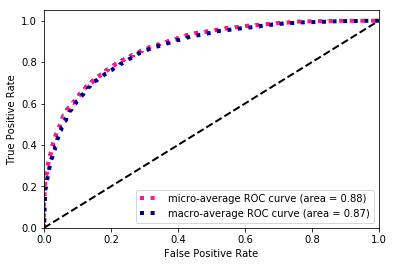

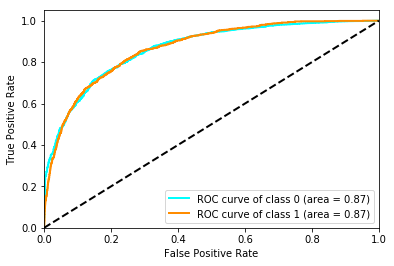

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.866223,0.489003,0.677613,0.787958,0.816550
precision,0.957830,0.358159,0.657995,0.787958,0.878864
recall,0.790609,0.770477,0.780543,0.787958,0.787958
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.866750,0.866750,0.866941,0.877388,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 214)
(41184, 2)
(8437, 214)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
_________________________________________________________________
activation_3 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)         

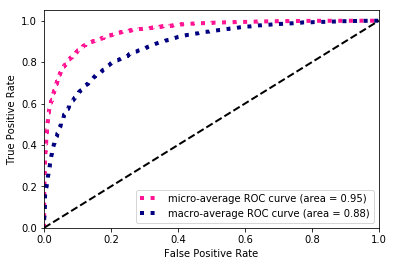

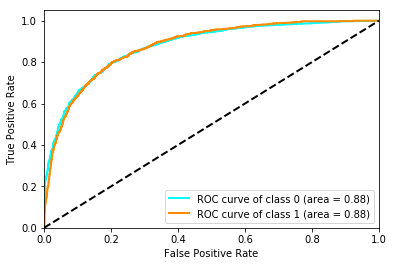

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.930424,0.559130,0.744777,0.879815,0.881531
precision,0.935430,0.540791,0.738111,0.879815,0.883464
recall,0.925471,0.578758,0.752114,0.879815,0.879815
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.877119,0.877119,0.877308,0.949385,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 214)
(41184, 2)
(8437, 214)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               110080    
_________________________________________________________________
dense_10 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_5 (Batch (None, 256)               1024      
_________________________________________________________________
activation_5 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)         

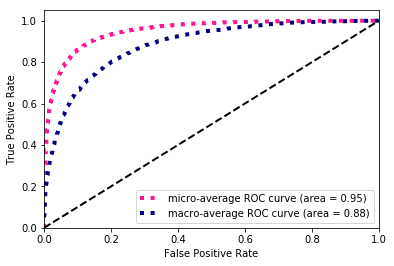

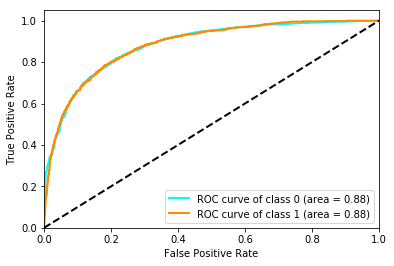

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.930473,0.575758,0.753115,0.880526,0.883764
precision,0.940463,0.540711,0.740587,0.880526,0.887823
recall,0.920693,0.615662,0.768177,0.880526,0.880526
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.882024,0.882024,0.882202,0.950382,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 300)
(41184, 2)
(8437, 300)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_14 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
activation_7 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)         

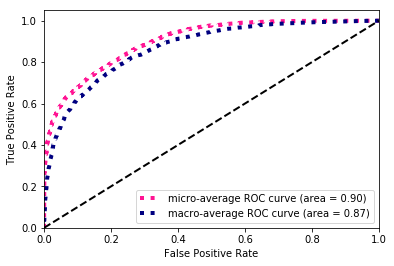

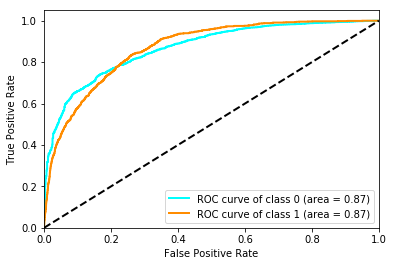

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.873937,0.490893,0.682415,0.797914,0.823497
precision,0.953380,0.367292,0.660336,0.797914,0.876202
recall,0.806716,0.739874,0.773295,0.797914,0.797914
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.868479,0.868479,0.868665,0.900236,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 300)
(41184, 2)
(8437, 300)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_18 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_9 (Batch (None, 256)               1024      
_________________________________________________________________
activation_9 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)         

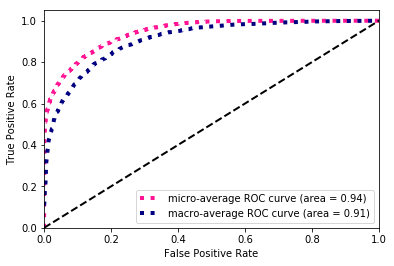

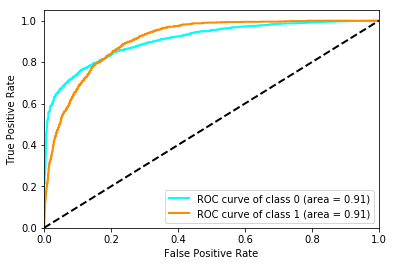

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.910808,0.568960,0.739884,0.852199,0.865792
precision,0.956724,0.461841,0.709282,0.852199,0.891557
recall,0.869096,0.740774,0.804935,0.852199,0.852199
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.906849,0.906849,0.907005,0.943350,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 300)
(41184, 2)
(8437, 300)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               154112    
_________________________________________________________________
dense_22 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_11 (Batc (None, 256)               1024      
_________________________________________________________________
activation_11 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)         

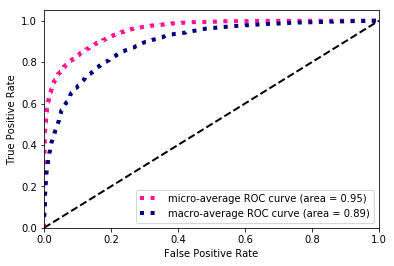

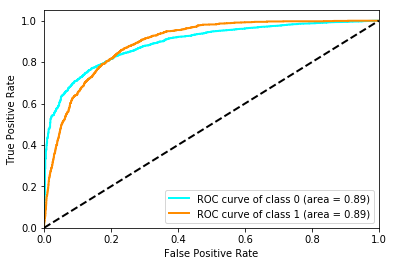

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921593,0.562402,0.741998,0.867014,0.874294
precision,0.944158,0.496215,0.720186,0.867014,0.885172
recall,0.900082,0.648965,0.774523,0.867014,0.867014
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.893475,0.893475,0.893639,0.952686,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_26 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 256)               1024      
_________________________________________________________________
activation_13 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)         

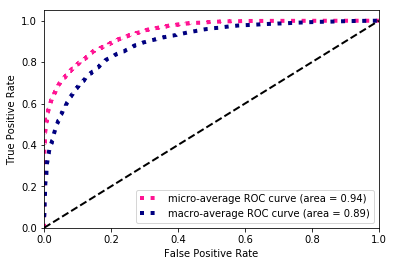

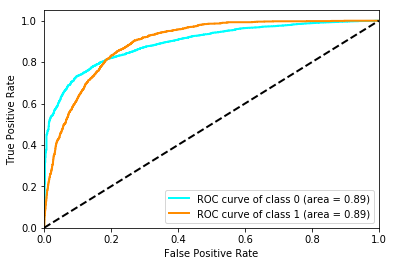

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.911644,0.550505,0.731074,0.852317,0.864088
precision,0.948642,0.459362,0.704002,0.852317,0.884213
recall,0.877423,0.686769,0.782096,0.852317,0.852317
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.893420,0.893420,0.893593,0.940235,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_30 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_15 (Batc (None, 256)               1024      
_________________________________________________________________
activation_15 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)         

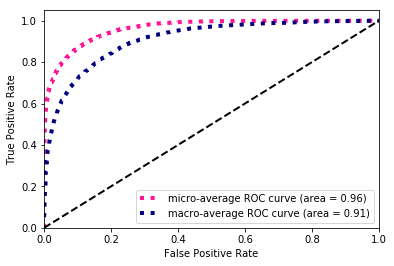

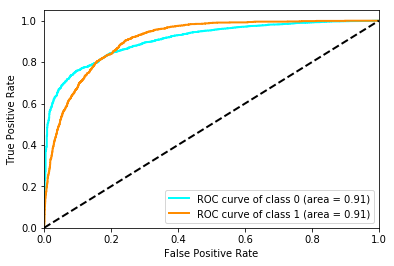

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932718,0.584785,0.758752,0.884201,0.886902
precision,0.941209,0.553945,0.747577,0.884201,0.890214
recall,0.924379,0.619262,0.771820,0.884201,0.884201
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.908079,0.908078,0.908240,0.961212,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 512)               128512    
_________________________________________________________________
dense_34 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_17 (Batc (None, 256)               1024      
_________________________________________________________________
activation_17 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)         

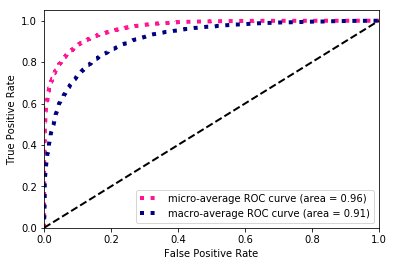

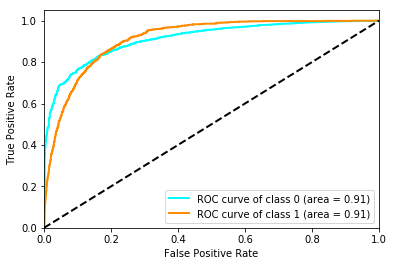

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937107,0.590383,0.763745,0.890957,0.891450
precision,0.938647,0.584141,0.761394,0.890957,0.891965
recall,0.935572,0.596760,0.766166,0.890957,0.890957
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.912422,0.912422,0.912577,0.963578,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_38 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_19 (Batc (None, 256)               1024      
_________________________________________________________________
activation_19 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 256)         

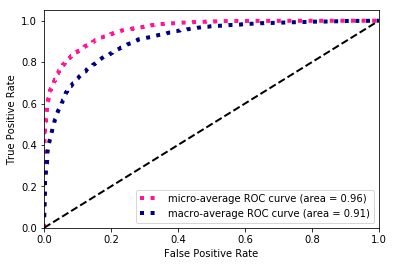

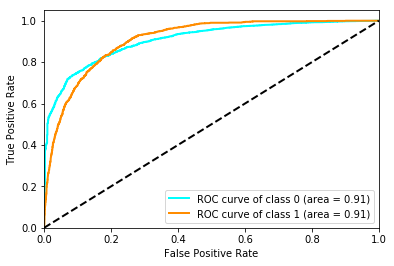

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.927755,0.591160,0.759457,0.877208,0.883431
precision,0.948389,0.526353,0.737371,0.877208,0.892814
recall,0.907999,0.674167,0.791083,0.877208,0.877208
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.907877,0.907877,0.907964,0.956563,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_41 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_42 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_21 (Batc (None, 256)               1024      
_________________________________________________________________
activation_21 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)         

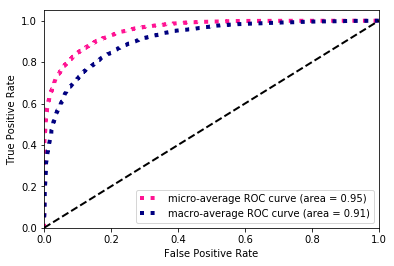

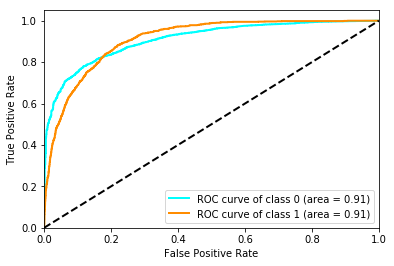

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925241,0.587326,0.756284,0.873415,0.880744
precision,0.949569,0.514557,0.732063,0.873415,0.892286
recall,0.902129,0.684068,0.793099,0.873415,0.873415
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.909254,0.909254,0.909339,0.954191,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               120320    
_________________________________________________________________
dense_46 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_23 (Batc (None, 256)               1024      
_________________________________________________________________
activation_23 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)         

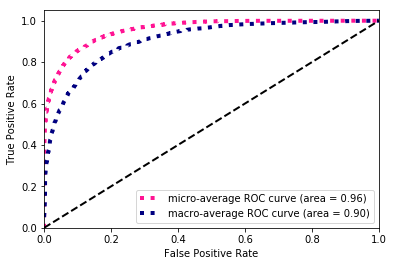

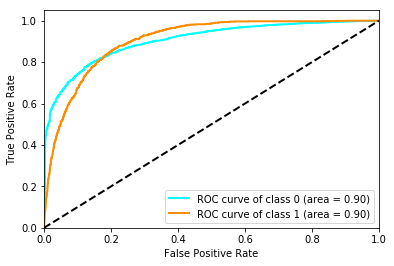

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.928191,0.573777,0.750984,0.877089,0.881521
precision,0.941954,0.527988,0.734971,0.877089,0.887442
recall,0.914824,0.628263,0.771543,0.877089,0.877089
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.904841,0.904841,0.904925,0.956025,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_49 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_50 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_25 (Batc (None, 256)               1024      
_________________________________________________________________
activation_25 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 256)         

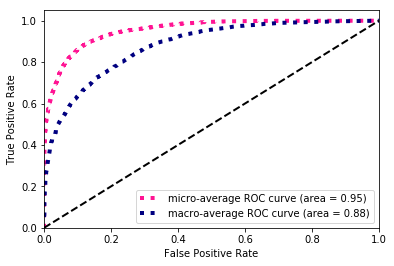

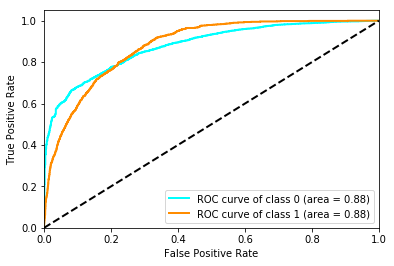

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932767,0.508374,0.720571,0.881712,0.876883
precision,0.920857,0.561480,0.741168,0.881712,0.873533
recall,0.944990,0.464446,0.704718,0.881712,0.881712
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.878938,0.878938,0.879106,0.953750,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_54 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_27 (Batc (None, 256)               1024      
_________________________________________________________________
activation_27 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)         

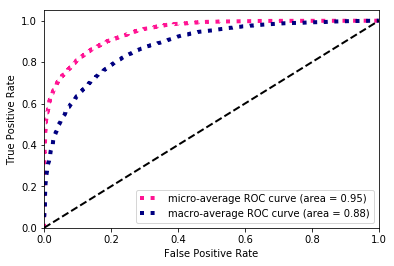

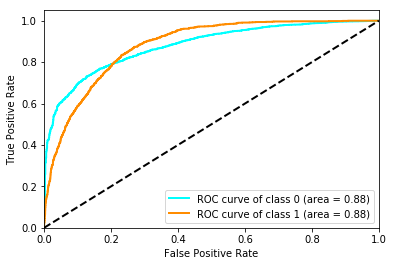

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.917518,0.521949,0.719734,0.859310,0.865429
precision,0.934466,0.472303,0.703384,0.859310,0.873607
recall,0.901174,0.583258,0.742216,0.859310,0.859310
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.879388,0.879389,0.879558,0.945309,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_57 (Dense)             (None, 512)               132608    
_________________________________________________________________
dense_58 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_29 (Batc (None, 256)               1024      
_________________________________________________________________
activation_29 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 256)         

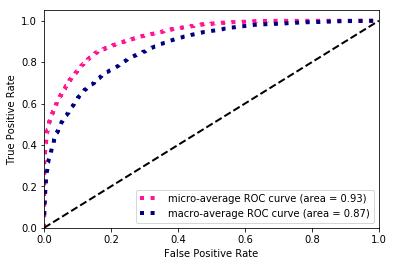

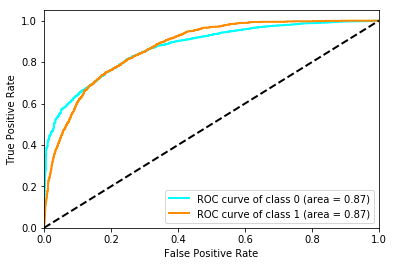

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.906752,0.532097,0.719424,0.844494,0.857417
precision,0.945878,0.440638,0.693258,0.844494,0.879347
recall,0.870734,0.671467,0.771101,0.844494,0.844494
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.872692,0.872693,0.872874,0.926491,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 136)
(41184, 2)
(8437, 136)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_62 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Batc (None, 256)               1024      
_________________________________________________________________
activation_31 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 256)         

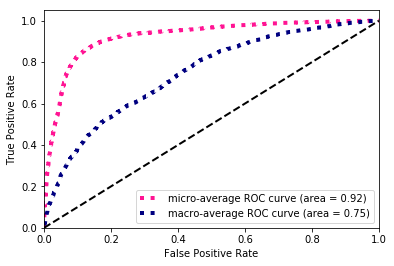

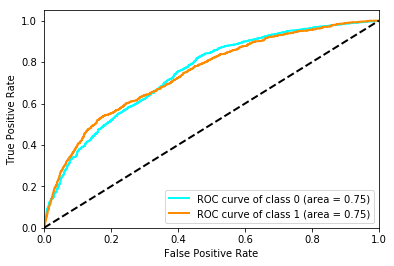

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.927698,0.216140,0.571919,0.867607,0.833998
precision,0.882186,0.490446,0.686316,0.867607,0.830601
recall,0.978160,0.138614,0.558387,0.867607,0.867607
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.745267,0.745267,0.745387,0.924168,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 136)
(41184, 2)
(8437, 136)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_65 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_66 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Batc (None, 256)               1024      
_________________________________________________________________
activation_33 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)         

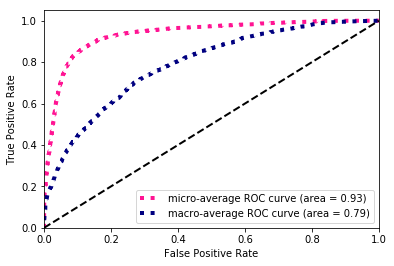

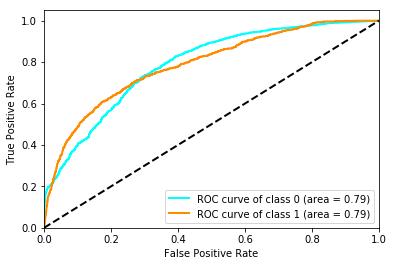

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.930260,0.354800,0.642530,0.874126,0.854482
precision,0.896355,0.545794,0.721075,0.874126,0.850193
recall,0.966830,0.262826,0.614828,0.874126,0.874126
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.788119,0.788119,0.788225,0.934471,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 136)
(41184, 2)
(8437, 136)
(8437, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_69 (Dense)             (None, 512)               70144     
_________________________________________________________________
dense_70 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Batc (None, 256)               1024      
_________________________________________________________________
activation_35 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 256)         

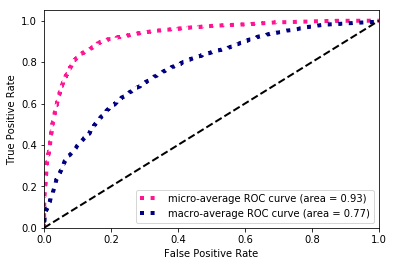

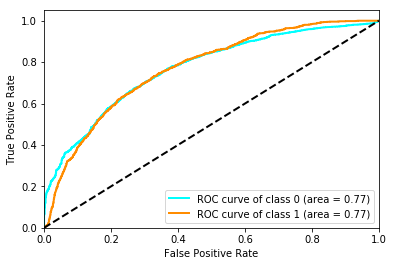

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.926683,0.020426,0.473554,0.863577,0.807346
precision,0.868745,0.187500,0.528122,0.863577,0.779037
recall,0.992902,0.010801,0.501852,0.863577,0.863577
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.768819,0.768819,0.768944,0.929704,NaN


In [17]:
Houston = compare_models(city='Houston',classname='DNN')

In [18]:
Houston.to_hdf('Houston.h5',key='DNN')
Houston

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.909040,0.902113,0.927156,0.927062,0.919012,0.928214
1_f1-score,0.541297,0.540752,0.575224,0.584088,0.520807,0.197122
weighted avg_f1-score,0.860615,0.854528,0.880813,0.881899,0.866576,0.831942
micro avg_f1-score,0.849433,0.839042,0.875825,0.875904,0.861839,0.868437
macro avg_f1-score,0.725169,0.721432,0.751190,0.755575,0.719910,0.562668
0_precision,0.944575,0.951421,0.942833,0.946637,0.933733,0.882429
1_precision,0.479887,0.441783,0.532483,0.522966,0.491474,0.407913
weighted avg_precision,0.883384,0.884311,0.888797,0.890847,0.875496,0.819944
micro avg_precision,0.849433,0.839042,0.875825,0.875904,0.861839,0.868437
macro avg_precision,0.712231,0.696602,0.737658,0.734801,0.712604,0.645171


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)  

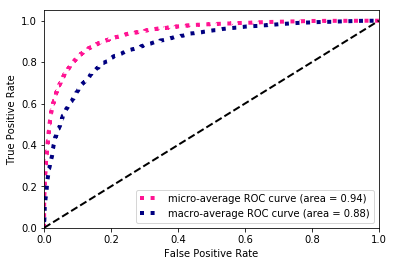

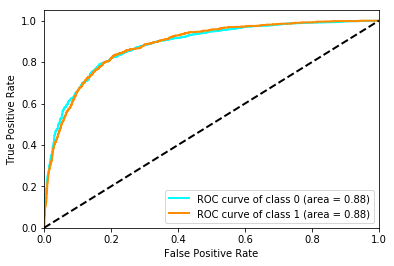

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921049,0.568913,0.744981,0.866540,0.874679
precision,0.946943,0.495003,0.720973,0.866540,0.887431
recall,0.896533,0.668767,0.782650,0.866540,0.866540
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.883222,0.883222,0.883411,0.938006,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)  

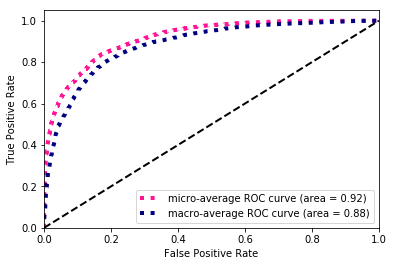

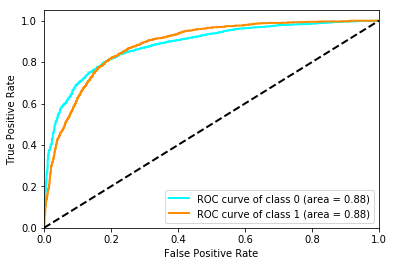

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.897663,0.544574,0.721118,0.832879,0.851167
precision,0.958462,0.424685,0.691574,0.832879,0.888174
recall,0.844117,0.758776,0.801446,0.832879,0.832879
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.883332,0.883332,0.883505,0.915739,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)  

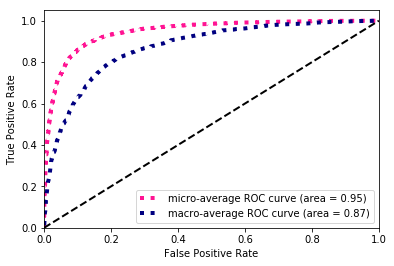

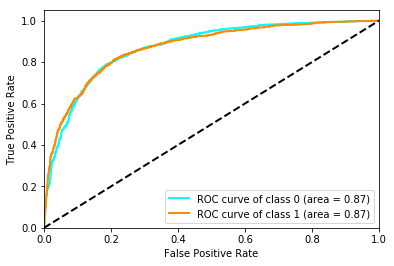

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.931228,0.552093,0.741660,0.880763,0.881303
precision,0.932758,0.546256,0.739507,0.880763,0.881863
recall,0.929702,0.558056,0.743879,0.880763,0.880763
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.871127,0.871127,0.871328,0.945987,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_8 (LS

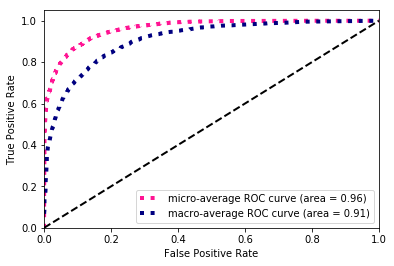

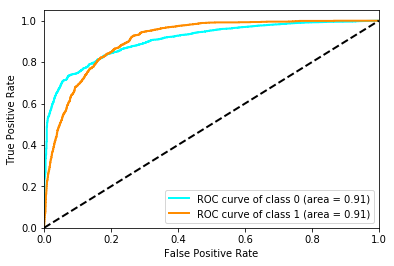

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.934969,0.567151,0.751060,0.886927,0.886534
precision,0.933824,0.571821,0.752822,0.886927,0.886154
recall,0.936118,0.562556,0.749337,0.886927,0.886927
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.908382,0.908382,0.908540,0.962409,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_9 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_10 (L

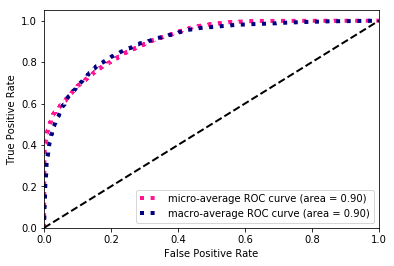

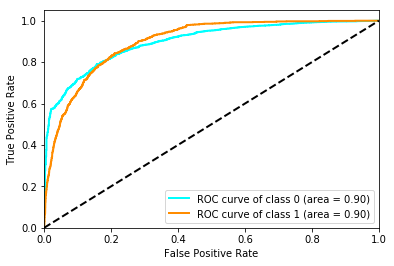

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.874860,0.525419,0.700139,0.801944,0.828845
precision,0.969139,0.383817,0.676478,0.801944,0.892063
recall,0.797297,0.832583,0.814940,0.801944,0.801944
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.898230,0.898230,0.898404,0.904737,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 314)
(41184, 2)
(8437, 314)
(8437, 2)
(41184, 8, 25)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_12 (L

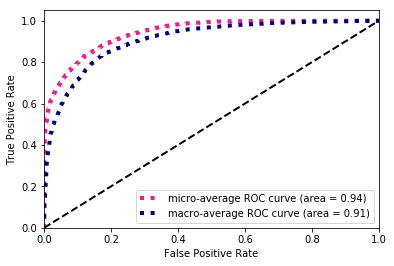

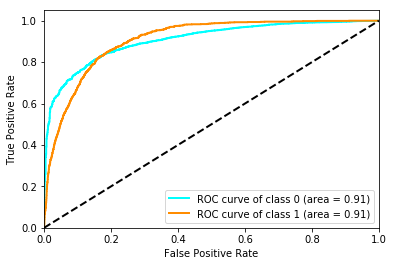

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.911412,0.578929,0.745171,0.853621,0.867630
precision,0.960393,0.465971,0.713182,0.853621,0.895287
recall,0.867185,0.764176,0.815681,0.853621,0.853621
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.906916,0.906916,0.907069,0.941601,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_13 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

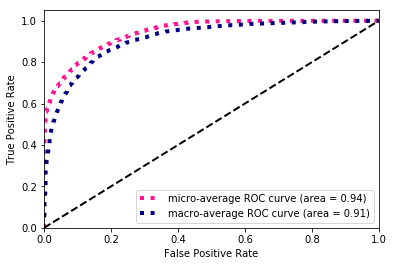

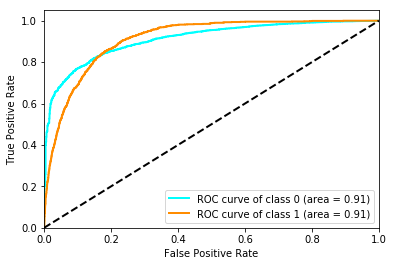

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.909091,0.580087,0.744589,0.850539,0.865767
precision,0.963331,0.460359,0.711845,0.850539,0.897099
recall,0.860633,0.783978,0.822306,0.850539,0.850539
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.911588,0.911588,0.911749,0.941881,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_15 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

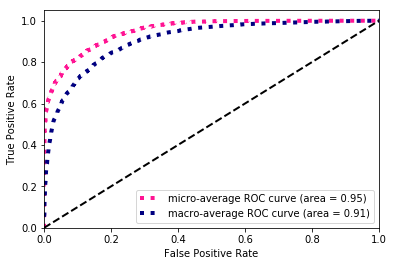

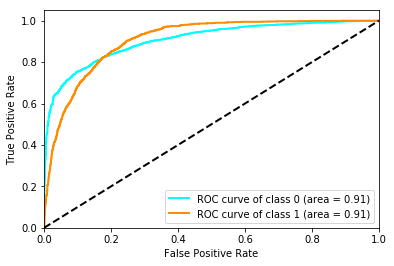

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.917434,0.576308,0.746871,0.861799,0.872514
precision,0.953208,0.483242,0.718225,0.861799,0.891322
recall,0.884248,0.713771,0.799010,0.861799,0.861799
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.906637,0.906637,0.906801,0.950356,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

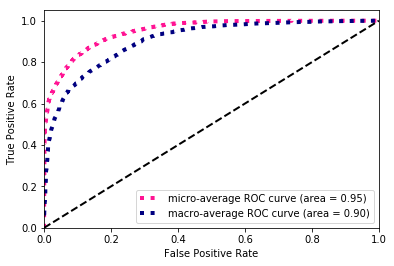

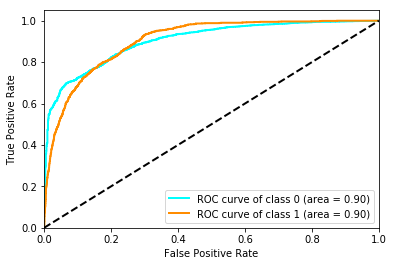

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921223,0.583147,0.752185,0.867488,0.876705
precision,0.952083,0.497772,0.724927,0.867488,0.892258
recall,0.892301,0.703870,0.798086,0.867488,0.867488
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.903812,0.903812,0.903979,0.949580,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

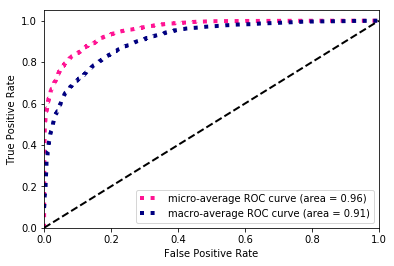

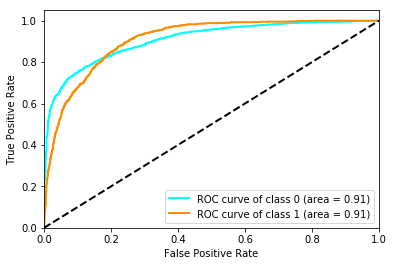

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.926435,0.583498,0.754966,0.874956,0.881276
precision,0.946971,0.519691,0.733331,0.874956,0.890706
recall,0.906770,0.665167,0.785968,0.874956,0.874956
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.907717,0.907717,0.907802,0.955347,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_21 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

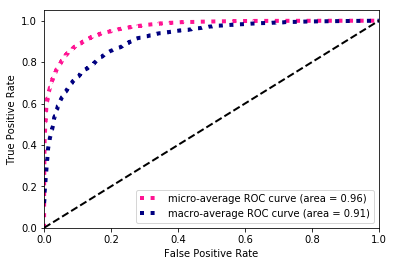

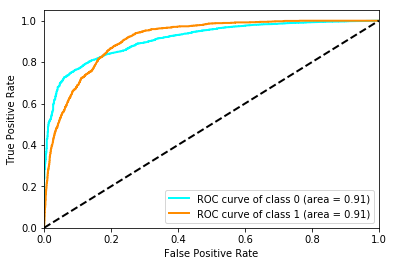

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937309,0.578104,0.757706,0.890838,0.890008
precision,0.934827,0.588619,0.761723,0.890838,0.889238
recall,0.939803,0.567957,0.753880,0.890838,0.890838
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.911435,0.911435,0.911512,0.963122,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 234)
(41184, 2)
(8437, 234)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_23 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

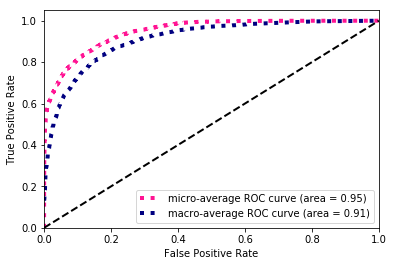

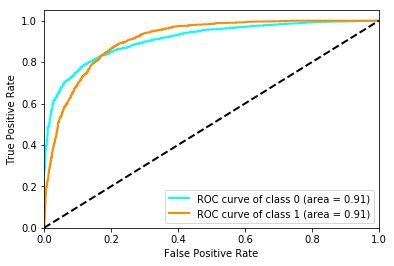

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.914420,0.579243,0.746831,0.857769,0.870283
precision,0.957437,0.474440,0.715939,0.857769,0.893835
recall,0.875102,0.743474,0.809288,0.857769,0.857769
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.909838,0.909838,0.909917,0.946604,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_25 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

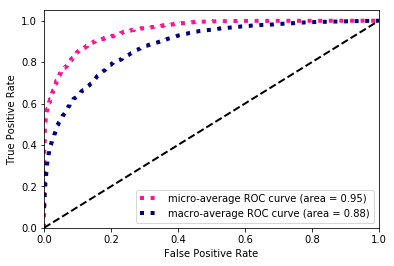

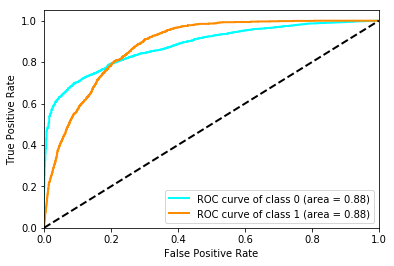

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.928817,0.486118,0.707468,0.874956,0.870522
precision,0.918346,0.529724,0.724035,0.874956,0.867171
recall,0.939530,0.449145,0.694338,0.874956,0.874956
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.881273,0.881273,0.881440,0.952337,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_27 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

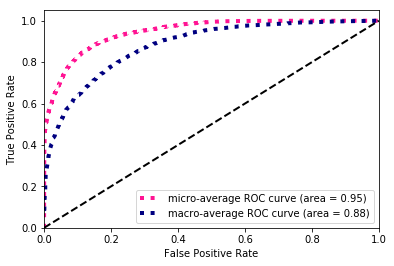

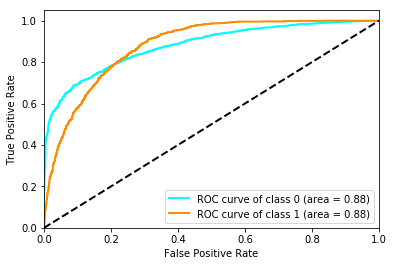

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.922273,0.513130,0.717701,0.865948,0.868397
precision,0.928720,0.491749,0.710234,0.865948,0.871179
recall,0.915916,0.536454,0.726185,0.865948,0.865948
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.879725,0.879725,0.879896,0.945435,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 258)
(41184, 2)
(8437, 258)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_29 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

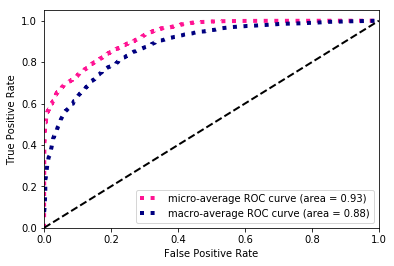

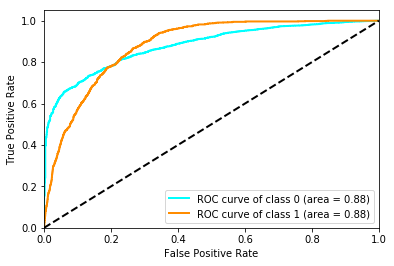

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.892782,0.516171,0.704477,0.824464,0.843189
precision,0.950516,0.405128,0.677822,0.824464,0.878699
recall,0.841660,0.711071,0.776365,0.824464,0.824464
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.879484,0.879484,0.879649,0.928045,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_32 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_157 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_158 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_67 (Bat

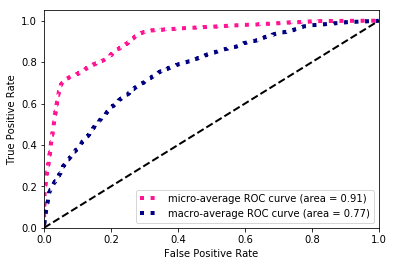

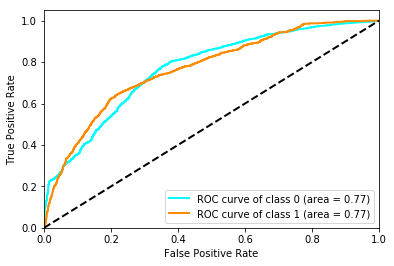

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.890746,0.408815,0.649780,0.815574,0.827284
precision,0.917149,0.353715,0.635432,0.815574,0.842955
recall,0.865820,0.484248,0.675034,0.815574,0.815574
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.767662,0.767662,0.767779,0.914003,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_34 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_161 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_162 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_69 (Bat

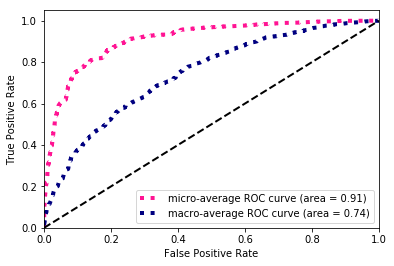

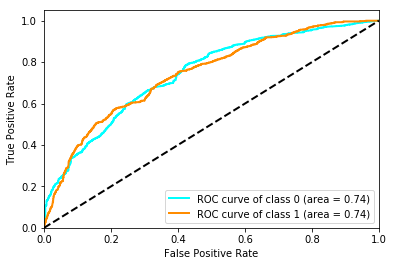

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.896437,0.389706,0.643071,0.822923,0.829710
precision,0.910704,0.356769,0.633737,0.822923,0.837761
recall,0.882610,0.429343,0.655976,0.822923,0.822923
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.742414,0.742414,0.742532,0.909723,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 250)
(41184, 2)
(8437, 250)
(8437, 2)
(41184, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_36 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_165 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_166 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_71 (Bat

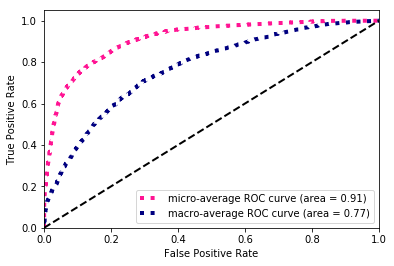

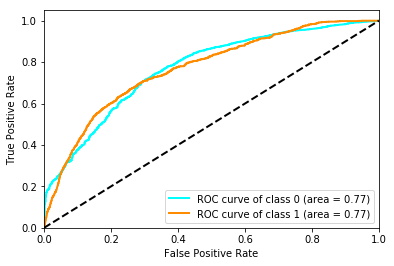

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.896629,0.410643,0.653636,0.824108,0.832633
precision,0.915505,0.367448,0.641477,0.824108,0.843336
recall,0.878515,0.465347,0.671931,0.824108,0.824108
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.768457,0.768457,0.768570,0.911094,NaN


In [19]:
Houston = compare_models(city='Houston',classname='RNN')

In [ ]:
Houston.to_hdf('Houston.h5',key='RNN')
Houston

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.916647,0.907080,0.915916,0.926054,0.914624,0.894604
1_f1-score,0.555193,0.557166,0.579847,0.580281,0.505140,0.403055
weighted avg_f1-score,0.869050,0.861003,0.871662,0.880522,0.860703,0.829876
micro avg_f1-score,0.860061,0.847497,0.859942,0.874521,0.855122,0.820868
macro avg_f1-score,0.735920,0.732123,0.747882,0.753168,0.709882,0.648829
0_precision,0.946055,0.954452,0.956207,0.946412,0.932527,0.914453
1_precision,0.488648,0.473870,0.480458,0.527583,0.475534,0.359311
weighted avg_precision,0.885823,0.891168,0.893560,0.891260,0.872349,0.841350
micro avg_precision,0.860061,0.847497,0.859942,0.874521,0.855122,0.820868
macro avg_precision,0.717351,0.714161,0.718332,0.736997,0.704031,0.636882


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 14)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


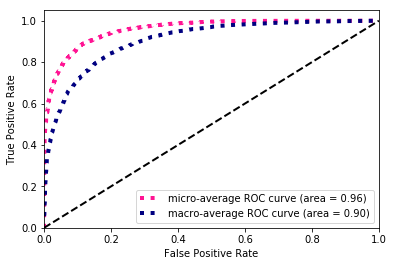

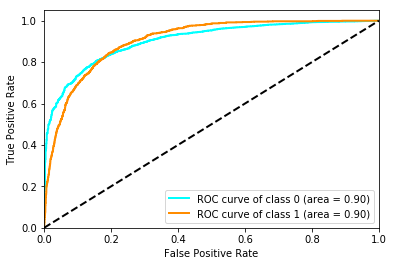

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933490,0.594958,0.764224,0.885741,0.888911
precision,0.943778,0.557920,0.750849,0.885741,0.892967
recall,0.923423,0.637264,0.780344,0.885741,0.885741
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.904681,0.904681,0.904847,0.957300,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 14)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


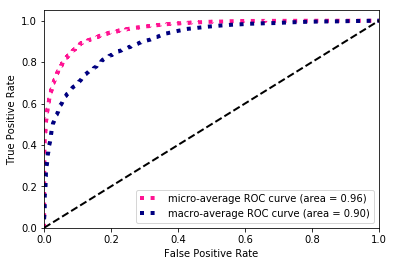

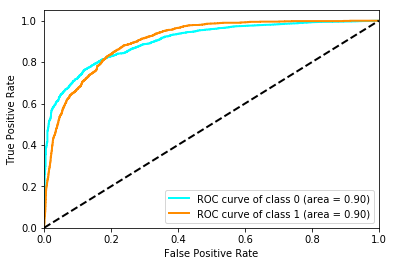

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.936243,0.596613,0.766428,0.889890,0.891520
precision,0.941477,0.576342,0.758910,0.889890,0.893395
recall,0.931067,0.618362,0.774715,0.889890,0.889890
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.903520,0.903520,0.903687,0.958446,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 14)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


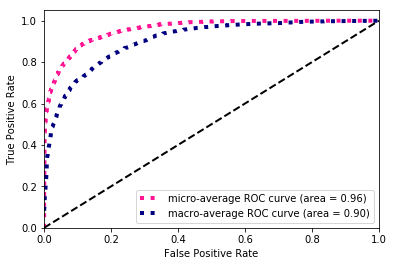

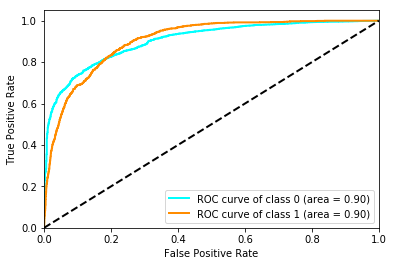

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933674,0.597065,0.765369,0.886097,0.889349
precision,0.944297,0.558870,0.751583,0.886097,0.893543
recall,0.923287,0.640864,0.782076,0.886097,0.886097
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.904299,0.904299,0.904464,0.957366,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

 - 6s - loss: 0.2273 - f1_score: 0.5143 - val_loss: 0.1549 - val_f1_score: 0.0000e+00


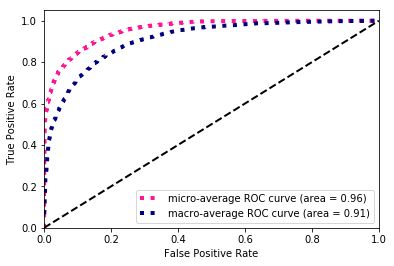

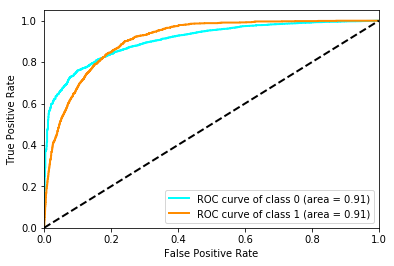

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924851,0.581549,0.753200,0.872585,0.879645
precision,0.947844,0.512346,0.730095,0.872585,0.890496
recall,0.902948,0.672367,0.787658,0.872585,0.872585
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.907367,0.907367,0.907528,0.955473,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

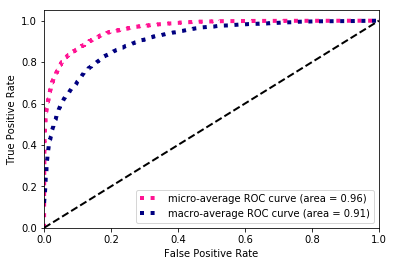

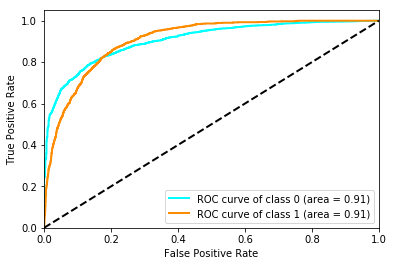

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.931039,0.572526,0.751782,0.881237,0.883829
precision,0.938923,0.544201,0.741562,0.881237,0.886945
recall,0.923287,0.603960,0.763624,0.881237,0.881237
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.905953,0.905953,0.906117,0.960023,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 315)
(41184, 2)
(8437, 315)
(8437, 2)
(41184, 8, 25)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

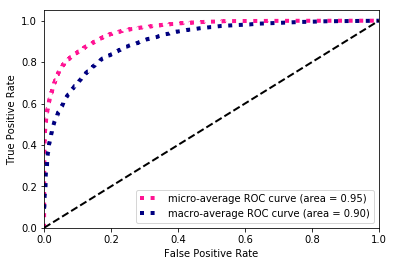

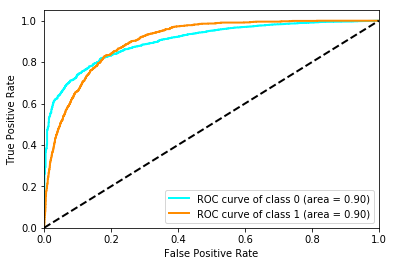

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.926785,0.574657,0.750721,0.875074,0.880416
precision,0.943564,0.520849,0.732206,0.875074,0.887900
recall,0.910592,0.640864,0.775728,0.875074,0.875074
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.903391,0.903391,0.903568,0.954822,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

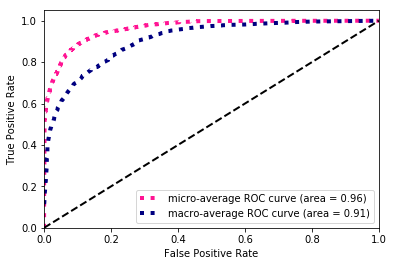

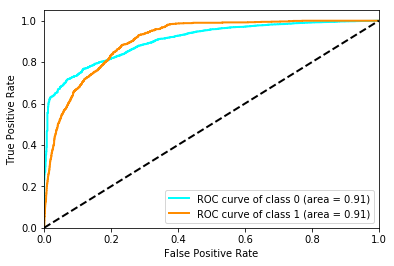

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937755,0.575533,0.756644,0.891431,0.890057
precision,0.933694,0.593123,0.763409,0.891431,0.888847
recall,0.941851,0.558956,0.750403,0.891431,0.891431
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.906119,0.906118,0.906283,0.962745,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

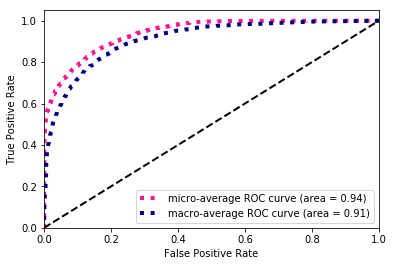

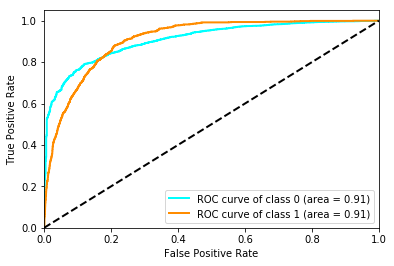

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.909052,0.573356,0.741204,0.850065,0.864847
precision,0.960352,0.458468,0.709410,0.850065,0.894263
recall,0.862954,0.765077,0.814015,0.850065,0.850065
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.908754,0.908754,0.908923,0.939873,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

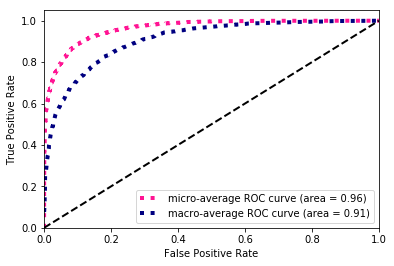

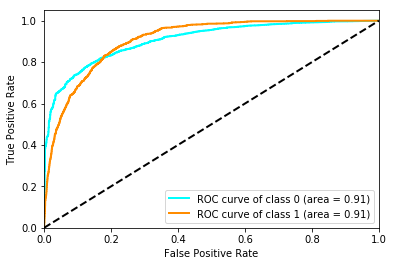

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938382,0.575304,0.756843,0.892379,0.890571
precision,0.933063,0.598832,0.765947,0.892379,0.889051
recall,0.943762,0.553555,0.748659,0.892379,0.892379
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.907081,0.907081,0.907245,0.962581,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 235)
(41184, 2)
(8437, 235)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

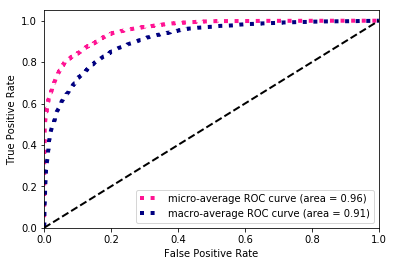

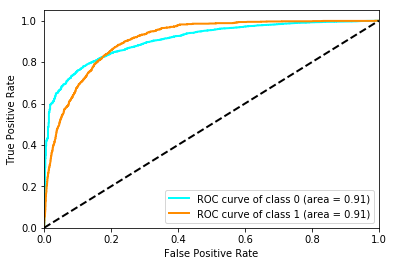

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925377,0.583138,0.754258,0.873415,0.880311
precision,0.947896,0.514817,0.731357,0.873415,0.890867
recall,0.903904,0.672367,0.788136,0.873415,0.873415
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.907980,0.907980,0.908064,0.955244,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 235)
(41184, 2)
(8437, 235)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 6s - loss: 0.2273 - f1_score: 0.5147 - val_loss: 0.1448 - val_f1_score: 0.0500
Epoch 34/60
 - 6s - loss: 0.2266 - f1_score: 0.5199 - val_loss: 0.1556 - val_f1_score: 0.1327
Epoch 35/60
 - 6s - loss: 0.2261 - f1_score: 0.5235 - val_loss: 0.1882 - val_f1_score: 0.2263
Epoch 36/60
 - 6s - loss: 0.2268 - f1_score: 0.5200 - val_loss: 0.1551 - val_f1_score: 0.1679


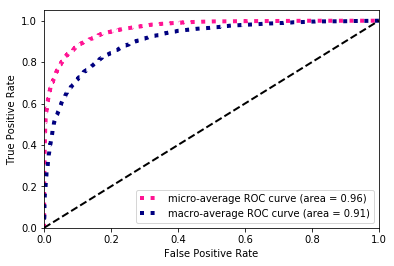

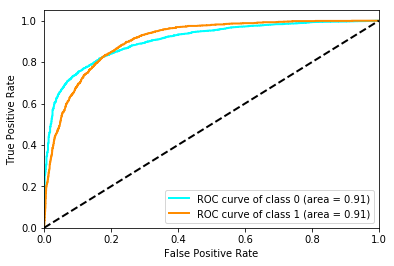

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.936150,0.584150,0.760150,0.889297,0.889798
precision,0.937688,0.577974,0.757831,0.889297,0.890320
recall,0.934616,0.590459,0.762538,0.889297,0.889297
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.905608,0.905608,0.905696,0.960991,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 235)
(41184, 2)
(8437, 235)
(8437, 2)
(41184, 8, 15)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

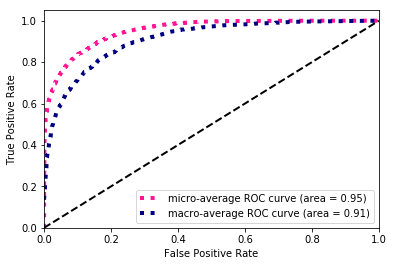

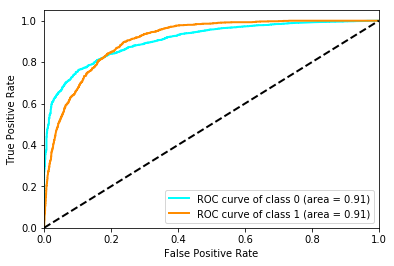

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921227,0.578313,0.749770,0.867251,0.876071
precision,0.950232,0.497087,0.723660,0.867251,0.890561
recall,0.893939,0.691269,0.792604,0.867251,0.867251
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.908068,0.908068,0.908147,0.951769,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 259)
(41184, 2)
(8437, 259)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

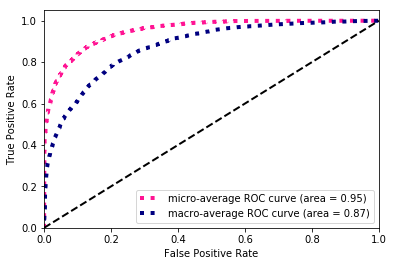

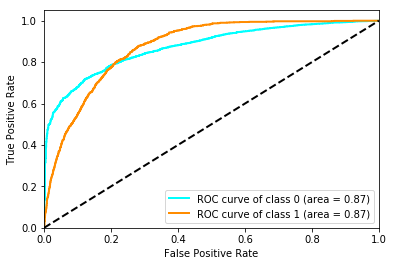

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.927219,0.485167,0.706193,0.872467,0.869008
precision,0.919013,0.517875,0.718444,0.872467,0.866191
recall,0.935572,0.456346,0.695959,0.872467,0.872467
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.874314,0.874314,0.874493,0.950330,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 259)
(41184, 2)
(8437, 259)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

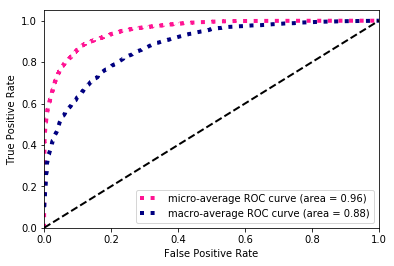

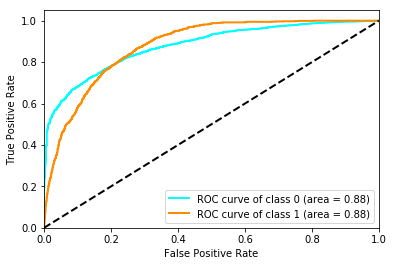

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.934217,0.490937,0.712577,0.883489,0.875845
precision,0.916371,0.578049,0.747210,0.883489,0.871820
recall,0.952771,0.426643,0.689707,0.883489,0.883489
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.879269,0.879269,0.879439,0.955196,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 259)
(41184, 2)
(8437, 259)
(8437, 2)
(41184, 8, 18)
(41184, 14)
(41184, 100)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_15 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 6s - loss: 0.2570 - f1_score: 0.4181 - val_loss: 0.1596 - val_f1_score: 0.0448
Epoch 34/60
 - 6s - loss: 0.2568 - f1_score: 0.4079 - val_loss: 0.1734 - val_f1_score: 0.0339
Epoch 35/60
 - 6s - loss: 0.2577 - f1_score: 0.4150 - val_loss: 0.1512 - val_f1_score: 0.0058
Epoch 36/60
 - 6s - loss: 0.2573 - f1_score: 0.4154 - val_loss: 0.1562 - val_f1_score: 0.0500
Epoch 37/60
 - 6s - loss: 0.2574 - f1_score: 0.4147 - val_loss: 0.1574 - val_f1_score: 0.0395


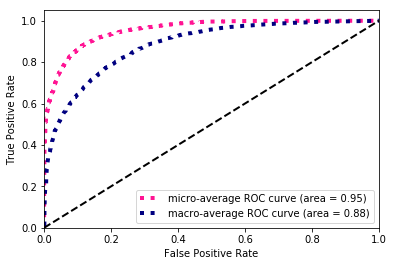

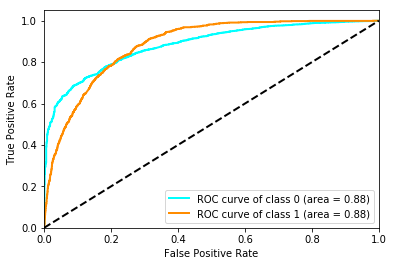

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933289,0.492088,0.712688,0.882067,0.875190
precision,0.917117,0.568396,0.742757,0.882067,0.871197
recall,0.950041,0.433843,0.691942,0.882067,0.882067
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.882411,0.882411,0.882594,0.954974,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_31 (LST

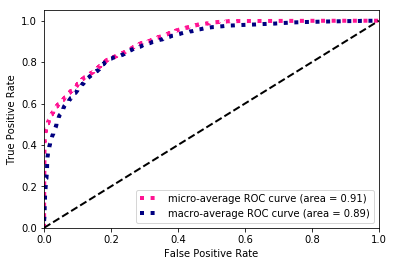

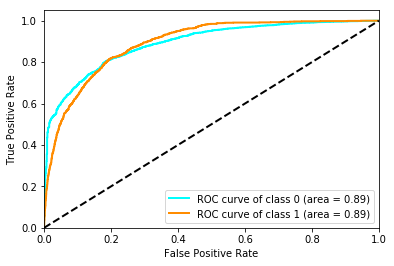

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881891,0.528123,0.705007,0.811070,0.835306
precision,0.964506,0.393472,0.678989,0.811070,0.889311
recall,0.812312,0.802880,0.807596,0.811070,0.811070
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.891441,0.891441,0.891612,0.910369,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_17 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_33 (LST

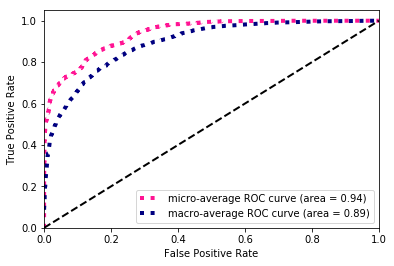

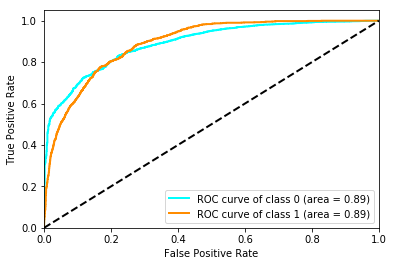

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.905614,0.547079,0.726347,0.843783,0.858402
precision,0.952546,0.442468,0.697507,0.843783,0.885378
recall,0.863090,0.716472,0.789781,0.843783,0.843783
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.891403,0.891404,0.891583,0.937327,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(41184, 251)
(41184, 2)
(8437, 251)
(8437, 2)
(41184, 8, 17)
(41184,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_35 (LST

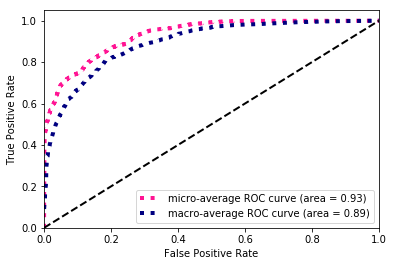

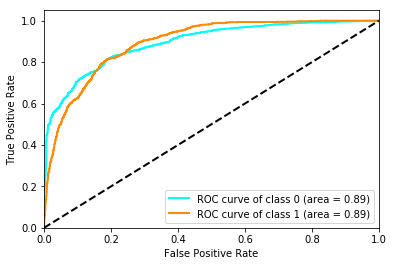

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.898775,0.545395,0.722085,0.834420,0.852242
precision,0.957838,0.427115,0.692477,0.834420,0.887951
recall,0.846574,0.754275,0.800425,0.834420,0.834420
support,7326.000000,1111.000000,8437.000000,8437.000000,8437.000000
auc,0.893084,0.893084,0.893256,0.930236,NaN


In [17]:
Houston = compare_models(city = 'Houston',classname='RNN_embed')

In [18]:
Houston.to_hdf('Houston.h5',key='RNN_embed')
Houston

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.934469,0.927559,0.928396,0.927585,0.931575,0.895427
1_f1-score,0.596212,0.576244,0.574731,0.581867,0.489398,0.540199
weighted avg_f1-score,0.889927,0.881297,0.881825,0.882060,0.873348,0.848650
micro avg_f1-score,0.887243,0.876299,0.877958,0.876654,0.879341,0.829758
macro avg_f1-score,0.765340,0.751901,0.751564,0.754726,0.710486,0.717813
0_precision,0.943184,0.943444,0.942370,0.945272,0.917500,0.958296
1_precision,0.564377,0.525798,0.550141,0.529959,0.554773,0.421018
weighted avg_precision,0.893302,0.888447,0.890721,0.890583,0.869736,0.887547
micro avg_precision,0.887243,0.876299,0.877958,0.876654,0.879341,0.829758
macro avg_precision,0.753781,0.734621,0.746255,0.737616,0.736137,0.689657


# Charlotte

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 214)
(21102, 2)
(4385, 214)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_115 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_116 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_37 (Batc (None, 256)               1024      
_________________________________________________________________
activation_37 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 256)         

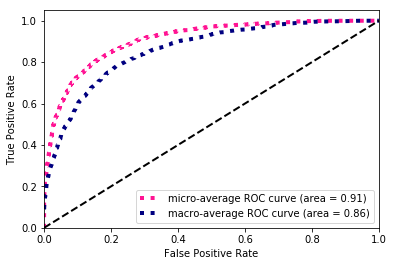

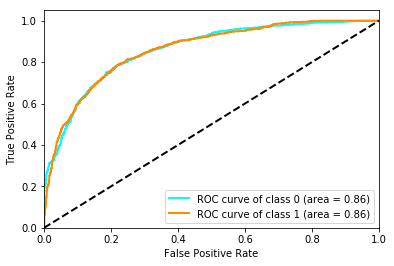

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.887026,0.610548,0.748787,0.824857,0.827821
precision,0.899463,0.582769,0.741116,0.824857,0.831646
recall,0.874927,0.641108,0.758018,0.824857,0.824857
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.859059,0.859059,0.859336,0.908548,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 214)
(21102, 2)
(4385, 214)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_119 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_120 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_39 (Batc (None, 256)               1024      
_________________________________________________________________
activation_39 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 256)         

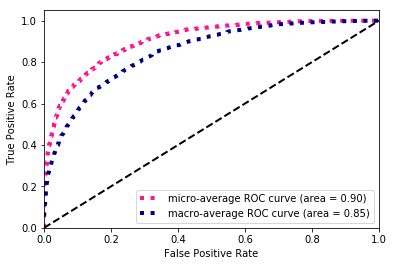

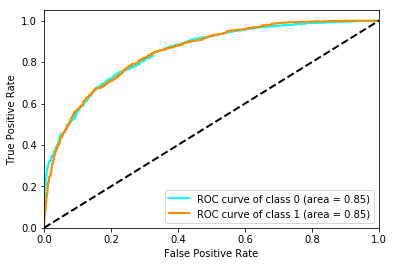

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.879538,0.597724,0.738631,0.814595,0.819190
precision,0.898577,0.558226,0.728401,0.814595,0.825694
recall,0.861288,0.643237,0.752263,0.814595,0.814595
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.848414,0.848414,0.848690,0.903772,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 214)
(21102, 2)
(4385, 214)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_123 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_124 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_41 (Batc (None, 256)               1024      
_________________________________________________________________
activation_41 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 256)         

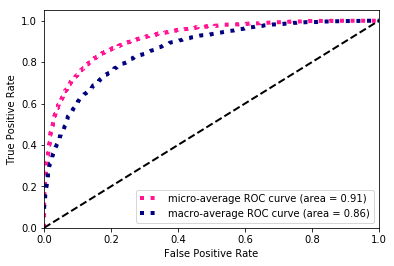

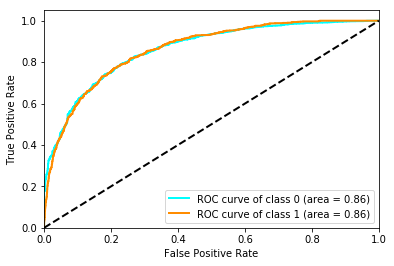

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.894111,0.610874,0.752493,0.833523,0.833459
precision,0.893852,0.611526,0.752689,0.833523,0.833395
recall,0.894370,0.610224,0.752297,0.833523,0.833523
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.862092,0.862092,0.862358,0.914671,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 300)
(21102, 2)
(4385, 300)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_127 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_128 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_43 (Batc (None, 256)               1024      
_________________________________________________________________
activation_43 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 256)         

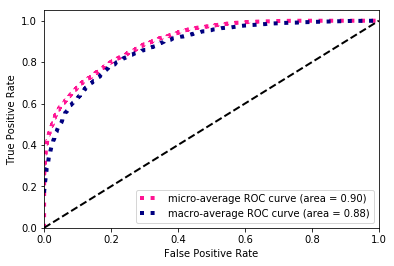

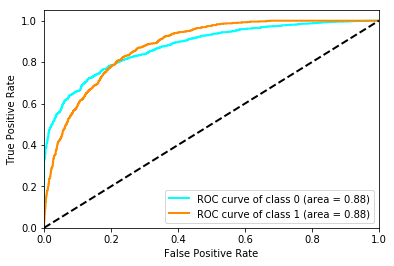

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.864178,0.620839,0.742509,0.800000,0.812070
precision,0.926602,0.522562,0.724582,0.800000,0.840082
recall,0.809634,0.764643,0.787139,0.800000,0.800000
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.878003,0.878003,0.878252,0.900415,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 300)
(21102, 2)
(4385, 300)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_131 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_132 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_45 (Batc (None, 256)               1024      
_________________________________________________________________
activation_45 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_23 (Dropout)         (None, 256)         

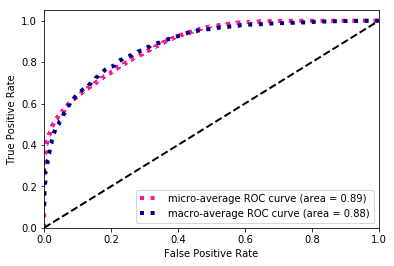

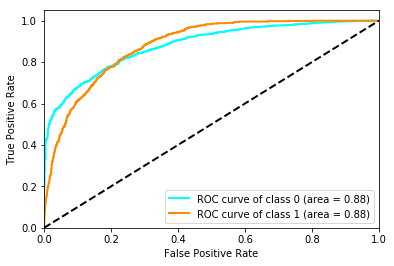

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.843015,0.610869,0.726942,0.776283,0.793303
precision,0.939707,0.486726,0.713217,0.776283,0.842706
recall,0.764364,0.820021,0.792193,0.776283,0.776283
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.881874,0.881874,0.882137,0.885053,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 300)
(21102, 2)
(4385, 300)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_135 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_136 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_47 (Batc (None, 256)               1024      
_________________________________________________________________
activation_47 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 256)         

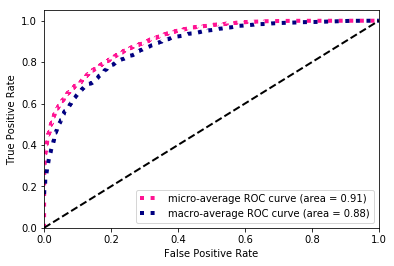

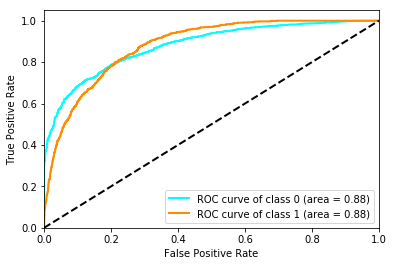

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.871607,0.619349,0.745478,0.807982,0.817589
precision,0.918380,0.538099,0.728240,0.807982,0.836947
recall,0.829367,0.729499,0.779433,0.807982,0.807982
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.880107,0.880107,0.880349,0.907122,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_139 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_140 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_49 (Batc (None, 256)               1024      
_________________________________________________________________
activation_49 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 256)         

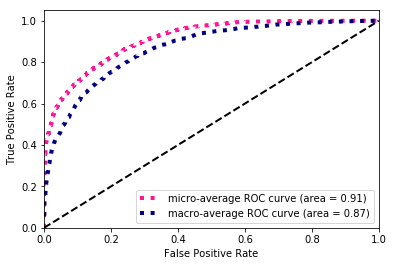

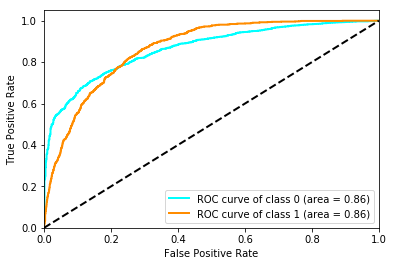

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.876696,0.599127,0.737912,0.811403,0.817258
precision,0.901564,0.549822,0.725693,0.811403,0.826242
recall,0.853163,0.658147,0.755655,0.811403,0.811403
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.864843,0.864843,0.865103,0.910129,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_143 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_144 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_51 (Batc (None, 256)               1024      
_________________________________________________________________
activation_51 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_26 (Dropout)         (None, 256)         

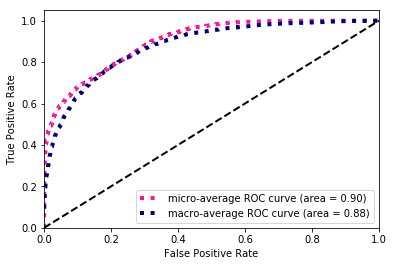

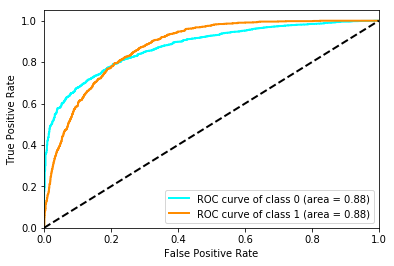

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.855796,0.618136,0.736966,0.790650,0.804904
precision,0.932877,0.507167,0.720022,0.790650,0.841716
recall,0.790482,0.791267,0.790875,0.790650,0.790650
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.876745,0.876745,0.876994,0.898961,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_147 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_148 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_53 (Batc (None, 256)               1024      
_________________________________________________________________
activation_53 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 256)         

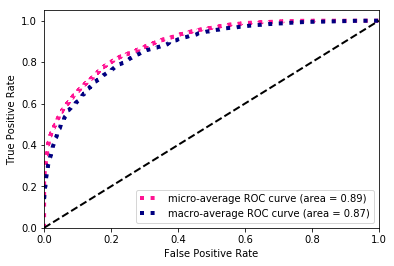

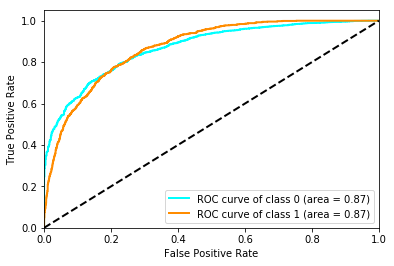

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.865015,0.614166,0.739590,0.800000,0.811298
precision,0.921010,0.523238,0.722124,0.800000,0.835831
recall,0.815438,0.743344,0.779391,0.800000,0.800000
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.870861,0.870861,0.871110,0.892639,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_151 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_152 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_55 (Batc (None, 256)               1024      
_________________________________________________________________
activation_55 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 256)         

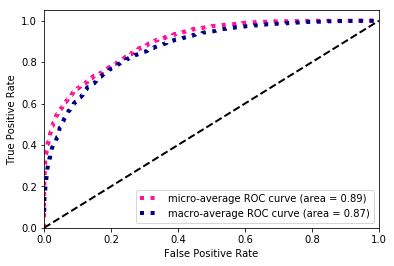

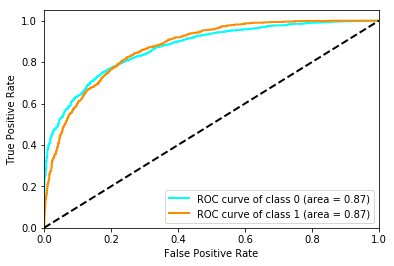

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.855983,0.610642,0.733312,0.789738,0.803445
precision,0.926928,0.505948,0.716438,0.789738,0.836780
recall,0.795125,0.769968,0.782546,0.789738,0.789738
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.871335,0.871335,0.871486,0.894819,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_155 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_156 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_57 (Batc (None, 256)               1024      
_________________________________________________________________
activation_57 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 256)         

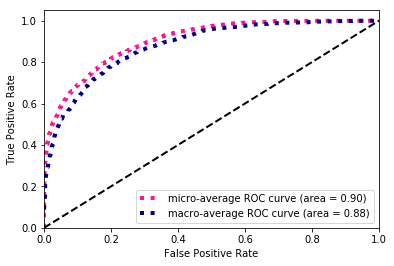

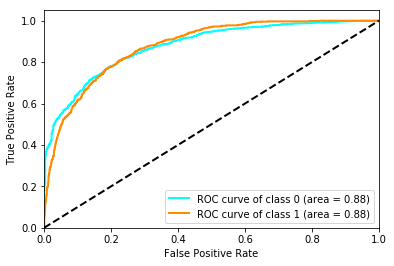

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.869672,0.621886,0.745779,0.806157,0.816611
precision,0.921977,0.533995,0.727986,0.806157,0.838895
recall,0.822983,0.744409,0.783696,0.806157,0.806157
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.877780,0.877780,0.877930,0.902541,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_159 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_160 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_59 (Batc (None, 256)               1024      
_________________________________________________________________
activation_59 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_30 (Dropout)         (None, 256)         

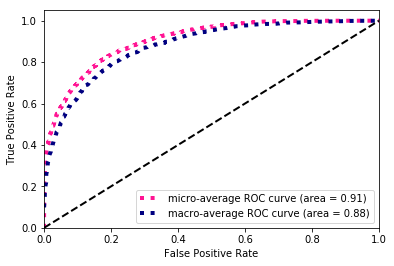

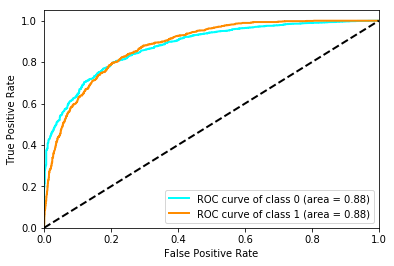

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.878705,0.628360,0.753532,0.817104,0.825097
precision,0.917562,0.556194,0.736878,0.817104,0.840179
recall,0.843006,0.722045,0.782526,0.817104,0.817104
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.878965,0.878965,0.879102,0.905924,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_163 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_164 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_61 (Batc (None, 256)               1024      
_________________________________________________________________
activation_61 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 256)         

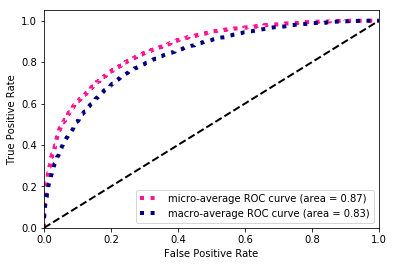

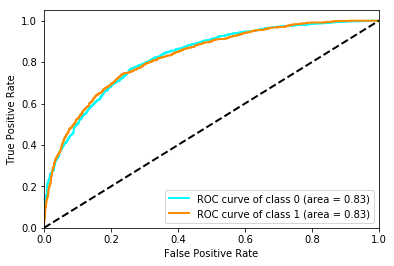

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.849661,0.571554,0.710608,0.777423,0.790108
precision,0.905450,0.486184,0.695817,0.777423,0.815669
recall,0.800348,0.693291,0.746819,0.777423,0.777423
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.827332,0.827332,0.827615,0.865520,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_167 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_168 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_63 (Batc (None, 256)               1024      
_________________________________________________________________
activation_63 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_32 (Dropout)         (None, 256)         

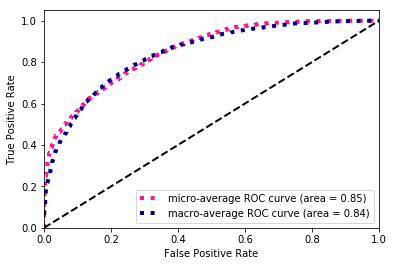

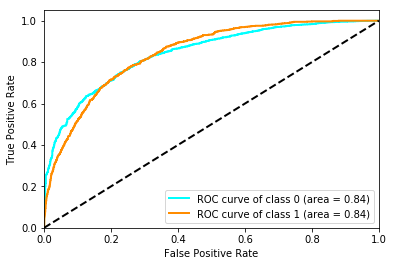

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.824683,0.571653,0.698168,0.751197,0.770499
precision,0.924019,0.452736,0.688378,0.751197,0.823099
recall,0.744631,0.775293,0.759962,0.751197,0.751197
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.843327,0.843327,0.843592,0.852296,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_171 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_172 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_65 (Batc (None, 256)               1024      
_________________________________________________________________
activation_65 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 256)         

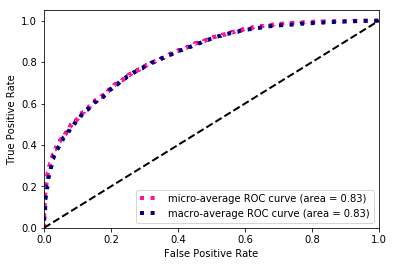

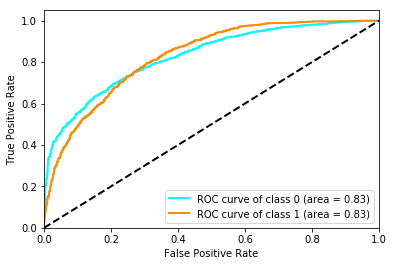

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.819112,0.549363,0.684237,0.741847,0.761348
precision,0.911451,0.438652,0.675052,0.741847,0.810206
recall,0.743761,0.734824,0.739293,0.741847,0.741847
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.828058,0.828058,0.828335,0.833910,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 136)
(21102, 2)
(4385, 136)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_175 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_176 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_67 (Batc (None, 256)               1024      
_________________________________________________________________
activation_67 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_34 (Dropout)         (None, 256)         

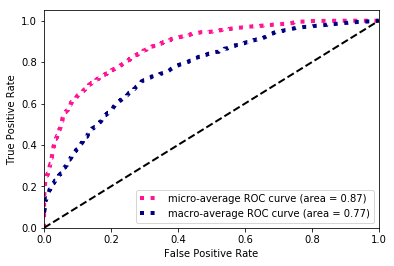

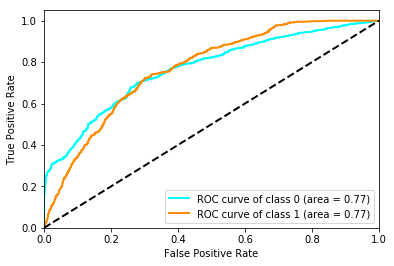

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.862220,0.418106,0.640163,0.777195,0.767118
precision,0.838683,0.474324,0.656504,0.777195,0.760660
recall,0.887115,0.373802,0.630459,0.777195,0.777195
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.767418,0.767418,0.767581,0.873100,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 136)
(21102, 2)
(4385, 136)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_179 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_180 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_69 (Batc (None, 256)               1024      
_________________________________________________________________
activation_69 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_35 (Dropout)         (None, 256)         

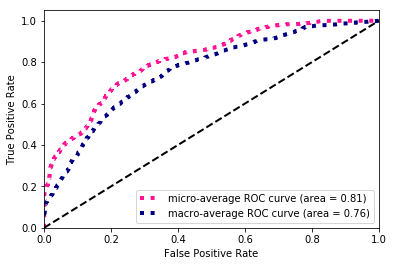

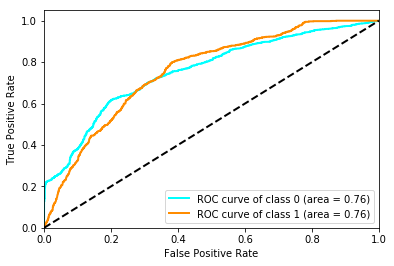

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.825502,0.463040,0.644271,0.736602,0.747885
precision,0.861015,0.410891,0.635953,0.736602,0.764626
recall,0.792803,0.530351,0.661577,0.736602,0.736602
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.756299,0.756299,0.756470,0.813314,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 136)
(21102, 2)
(4385, 136)
(4385, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_183 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_184 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_71 (Batc (None, 256)               1024      
_________________________________________________________________
activation_71 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_36 (Dropout)         (None, 256)         

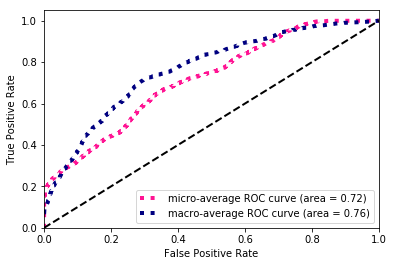

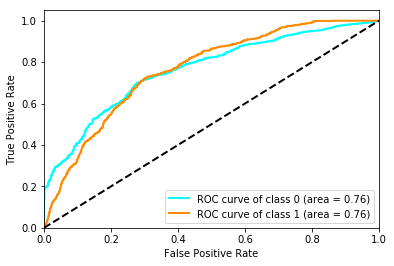

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.740703,0.484497,0.612600,0.654960,0.685839
precision,0.904563,0.356212,0.630388,0.654960,0.787139
recall,0.627104,0.757188,0.692146,0.654960,0.654960
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.763550,0.763550,0.763722,0.717011,NaN


In [19]:
Charlotte = compare_models(city='Charlotte',classname='DNN')

In [20]:
Charlotte.to_hdf('Charlotte.h5',key='DNN')
Charlotte

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.886891,0.859600,0.865836,0.868120,0.831152,0.809475
1_f1-score,0.606382,0.617019,0.610477,0.620296,0.564190,0.455215
weighted avg_f1-score,0.826823,0.807654,0.811153,0.815051,0.773985,0.733614
micro avg_f1-score,0.824325,0.794755,0.800684,0.804333,0.756823,0.722919
macro avg_f1-score,0.746637,0.738309,0.738156,0.744208,0.697671,0.632345
0_precision,0.897297,0.928230,0.918483,0.922155,0.913640,0.868087
1_precision,0.584173,0.515796,0.526743,0.532046,0.459191,0.413809
weighted avg_precision,0.830245,0.839912,0.834596,0.838618,0.816324,0.770808
micro avg_precision,0.824325,0.794755,0.800684,0.804333,0.756823,0.722919
macro avg_precision,0.740735,0.722013,0.722613,0.727101,0.686415,0.640948


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_37 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_38 (LSTM) 

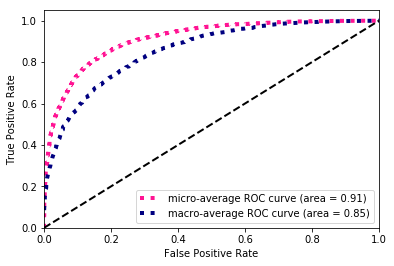

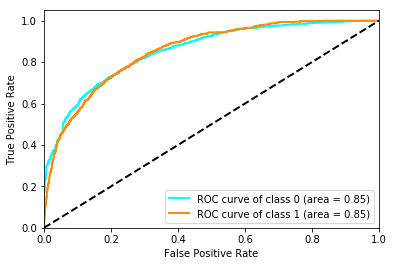

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.892228,0.577678,0.734953,0.828278,0.824871
precision,0.880260,0.610190,0.745225,0.828278,0.822427
recall,0.904527,0.548456,0.726491,0.828278,0.828278
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.854682,0.854682,0.854944,0.911462,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_39 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_40 (LSTM) 

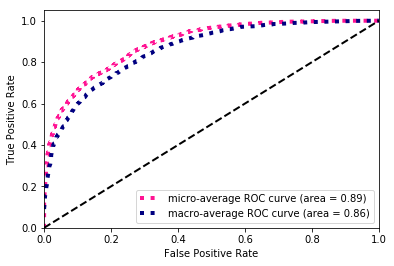

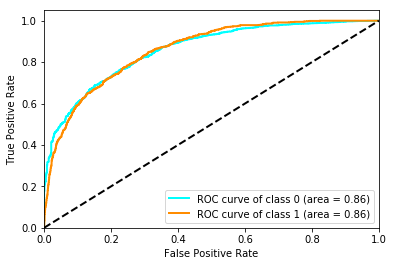

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.857979,0.595259,0.726619,0.789738,0.801720
precision,0.914314,0.506348,0.710331,0.789738,0.826952
recall,0.808183,0.722045,0.765114,0.789738,0.789738
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.859443,0.859443,0.859709,0.889172,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_41 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_42 (LSTM) 

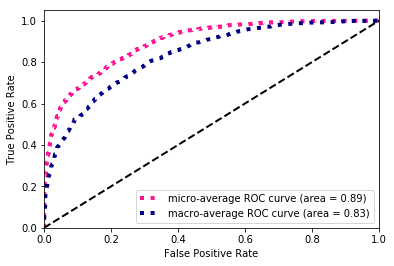

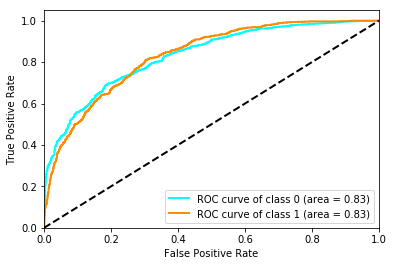

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.865485,0.561011,0.713248,0.794071,0.800285
precision,0.889195,0.516100,0.702648,0.794071,0.809301
recall,0.843006,0.614483,0.728745,0.794071,0.794071
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.832127,0.832127,0.832394,0.892665,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_43 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_44 (L

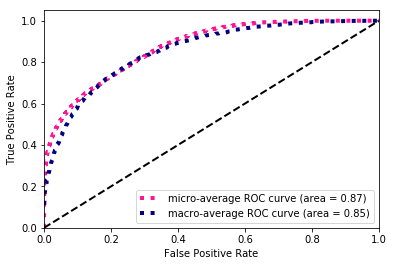

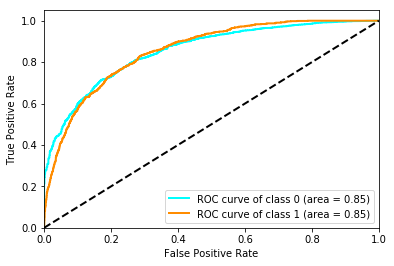

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.836566,0.585484,0.711025,0.765564,0.782799
precision,0.925105,0.471123,0.698114,0.765564,0.827890
recall,0.763494,0.773163,0.768328,0.765564,0.765564
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.854574,0.854574,0.854836,0.872353,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_45 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_46 (L

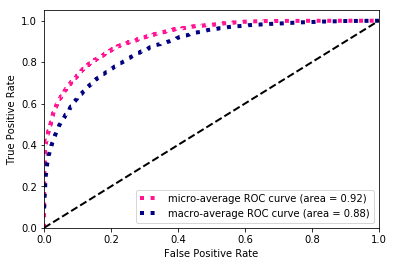

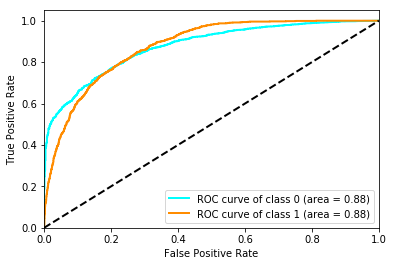

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.889118,0.617259,0.753188,0.828050,0.830902
precision,0.901312,0.589719,0.745515,0.828050,0.834588
recall,0.877249,0.647497,0.762373,0.828050,0.828050
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.876049,0.876049,0.876295,0.919981,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 314)
(21102, 2)
(4385, 314)
(4385, 2)
(21102, 8, 25)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_47 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_48 (L

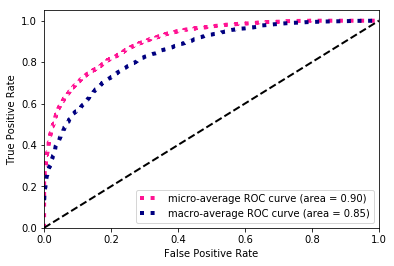

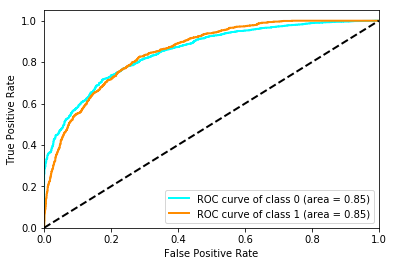

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.875893,0.593171,0.734532,0.809806,0.815351
precision,0.898900,0.547255,0.723078,0.809806,0.823599
recall,0.854034,0.647497,0.750765,0.809806,0.809806
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.852884,0.852884,0.853148,0.904215,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_49 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

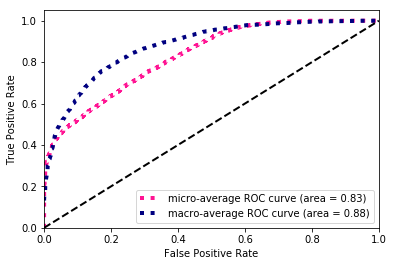

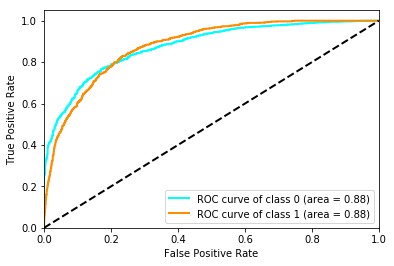

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.790721,0.577915,0.684318,0.720182,0.745151
precision,0.959040,0.426829,0.692935,0.720182,0.845073
recall,0.672664,0.894569,0.783616,0.720182,0.720182
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.877600,0.877600,0.877849,0.830042,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_51 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 3s - loss: 0.3260 - f1_score: 0.6374 - val_loss: 0.3234 - val_f1_score: 0.3679
Epoch 44/60
 - 3s - loss: 0.3231 - f1_score: 0.6316 - val_loss: 0.3315 - val_f1_score: 0.3891
Epoch 45/60
 - 3s - loss: 0.3245 - f1_score: 0.6354 - val_loss: 0.3939 - val_f1_score: 0.4197
Epoch 46/60
 - 3s - loss: 0.3238 - f1_score: 0.6396 - val_loss: 0.4470 - val_f1_score: 0.1948


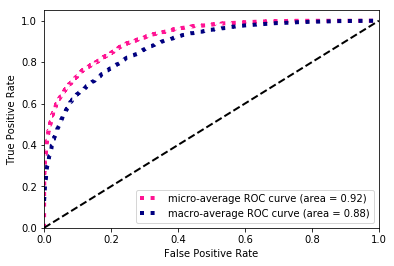

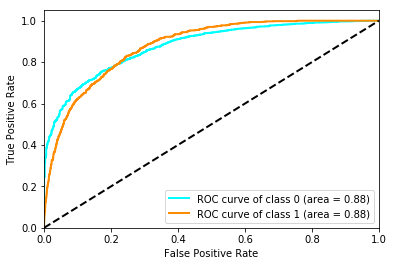

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.884317,0.623666,0.753992,0.823033,0.828502
precision,0.909258,0.572573,0.740916,0.823033,0.837161
recall,0.860708,0.684771,0.772740,0.823033,0.823033
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.878975,0.878975,0.879224,0.918379,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_53 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 3s - loss: 0.3240 - f1_score: 0.6407 - val_loss: 0.3307 - val_f1_score: 0.4326
Epoch 44/60
 - 3s - loss: 0.3242 - f1_score: 0.6354 - val_loss: 0.3655 - val_f1_score: 0.4391
Epoch 45/60
 - 4s - loss: 0.3251 - f1_score: 0.6372 - val_loss: 0.3292 - val_f1_score: 0.4133
Epoch 46/60
 - 3s - loss: 0.3246 - f1_score: 0.6346 - val_loss: 0.3589 - val_f1_score: 0.4382


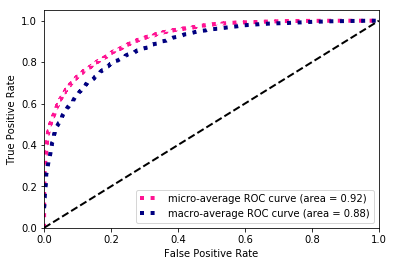

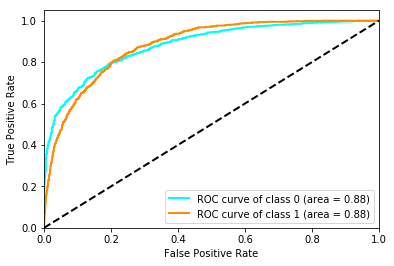

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.882256,0.626724,0.754490,0.820981,0.827536
precision,0.913070,0.566151,0.739611,0.820981,0.838781
recall,0.853453,0.701810,0.777632,0.820981,0.820981
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.882167,0.882167,0.882415,0.915651,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_55 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

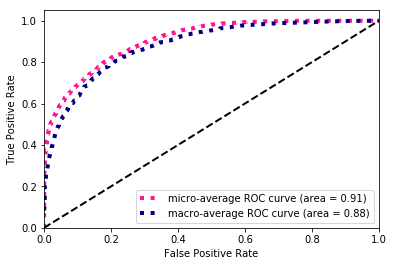

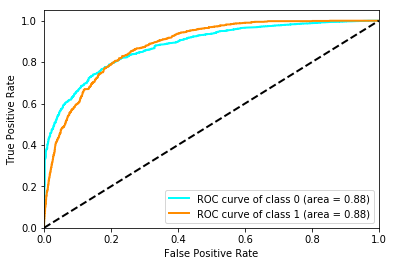

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.870878,0.632456,0.751667,0.808894,0.819823
precision,0.928384,0.537658,0.733021,0.808894,0.844714
recall,0.820081,0.767838,0.793960,0.808894,0.808894
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.880197,0.880197,0.880336,0.905685,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_57 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

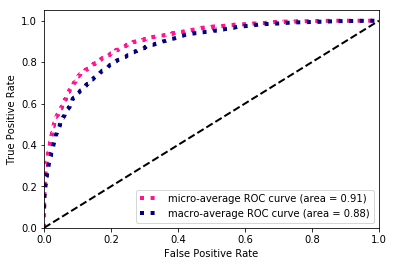

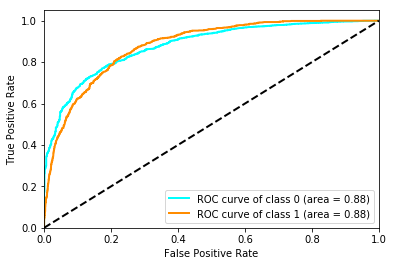

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.882794,0.627264,0.755029,0.821665,0.828075
precision,0.912895,0.567731,0.740313,0.821665,0.838982
recall,0.854614,0.700745,0.777680,0.821665,0.821665
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.879247,0.879247,0.879394,0.906574,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 234)
(21102, 2)
(4385, 234)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_59 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

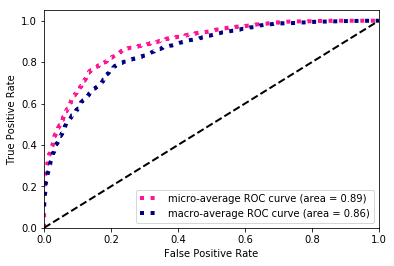

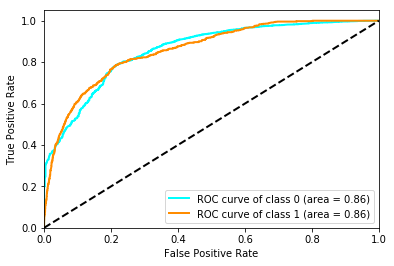

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.872920,0.611111,0.742015,0.808438,0.816856
precision,0.911820,0.540541,0.726181,0.808438,0.832315
recall,0.837203,0.702875,0.770039,0.808438,0.808438
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.858206,0.858206,0.858354,0.888990,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_61 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 3s - loss: 0.3692 - f1_score: 0.5336 - val_loss: 0.3471 - val_f1_score: 0.3698
Epoch 44/60
 - 3s - loss: 0.3678 - f1_score: 0.5384 - val_loss: 0.3340 - val_f1_score: 0.1966
Epoch 45/60
 - 3s - loss: 0.3699 - f1_score: 0.5387 - val_loss: 0.3986 - val_f1_score: 0.3617
Epoch 46/60
 - 3s - loss: 0.3697 - f1_score: 0.5220 - val_loss: 0.3260 - val_f1_score: 0.1873
Epoch 47/60
 - 3s - loss: 0.3683 - f1_score: 0.5283 - val_loss: 0.3405 - val_f1_score: 0.1620
Epoch 48/60
 - 3s - loss: 0.3695 - f1_score: 0.5304 - val_loss: 0.3249 - val_f1_score: 0.1894
Epoch 49/60
 - 3s - loss: 0.3678 - f1_score: 0.5442 - val_loss: 0.3749 - val_f1_score: 0.0615
Epoch 50/60
 - 3s - loss: 0.3679 - f1_score: 0.5247 - val_loss: 0.3185 - val_f1_score: 0.3155
Epoch 51/60
 - 3s - loss: 0.3681 - f1_score: 0.5399 - val_loss: 0.3090 - val_f1_score: 0.1871


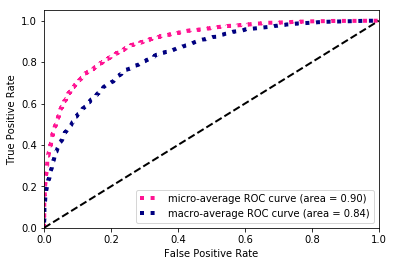

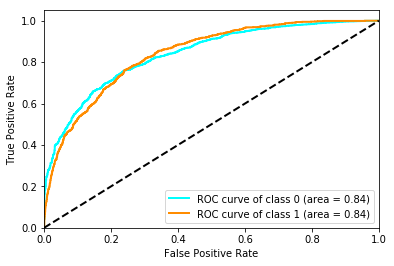

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881860,0.556880,0.719370,0.813455,0.812269
precision,0.877803,0.566703,0.722253,0.813455,0.811185
recall,0.885955,0.547391,0.716673,0.813455,0.813455
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.839262,0.839262,0.839529,0.900269,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_63 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 43/60
 - 3s - loss: 0.3690 - f1_score: 0.5479 - val_loss: 0.3027 - val_f1_score: 0.3091
Epoch 44/60
 - 4s - loss: 0.3694 - f1_score: 0.5327 - val_loss: 0.3437 - val_f1_score: 0.3630
Epoch 45/60
 - 3s - loss: 0.3699 - f1_score: 0.5204 - val_loss: 0.3664 - val_f1_score: 0.3685
Epoch 46/60
 - 3s - loss: 0.3697 - f1_score: 0.5413 - val_loss: 0.3273 - val_f1_score: 0.0372
Epoch 47/60
 - 3s - loss: 0.3691 - f1_score: 0.5358 - val_loss: 0.3449 - val_f1_score: 0.4066


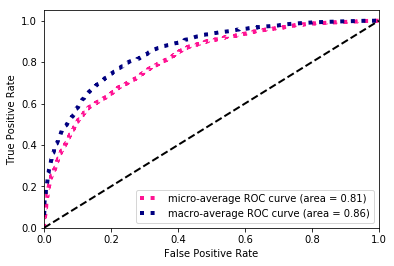

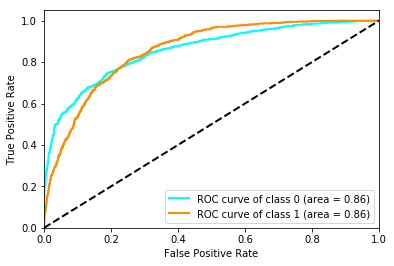

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.796781,0.568068,0.682425,0.723603,0.747804
precision,0.943606,0.426888,0.685247,0.723603,0.832957
recall,0.689495,0.848775,0.769135,0.723603,0.723603
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.857339,0.857339,0.857600,0.814982,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 258)
(21102, 2)
(4385, 258)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_65 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

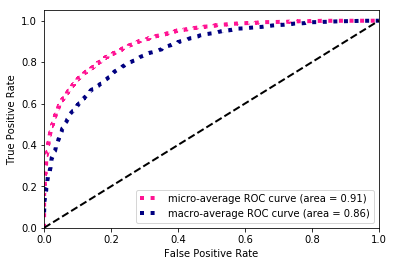

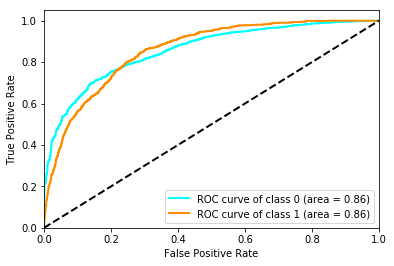

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.884020,0.587318,0.735669,0.818928,0.820484
precision,0.890000,0.573604,0.731802,0.818928,0.822247
recall,0.878120,0.601704,0.739912,0.818928,0.818928
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.857269,0.857269,0.857544,0.908664,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_67 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_68 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_271 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_272 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_103 (Ba

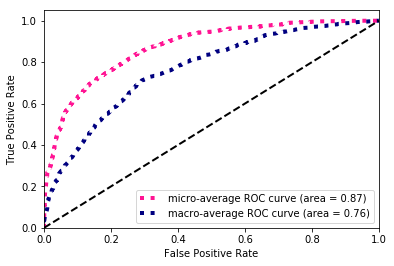

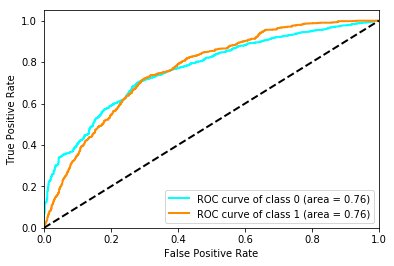

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.863694,0.435191,0.649442,0.780388,0.771935
precision,0.843051,0.484334,0.663692,0.780388,0.766235
recall,0.885374,0.395101,0.640238,0.780388,0.780388
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.764747,0.764747,0.764918,0.871912,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_69 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_70 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_275 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_276 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_105 (Ba

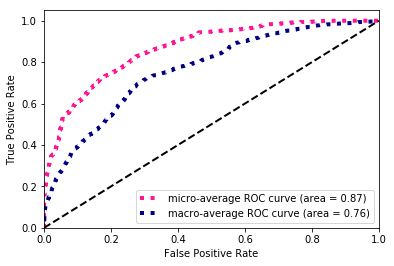

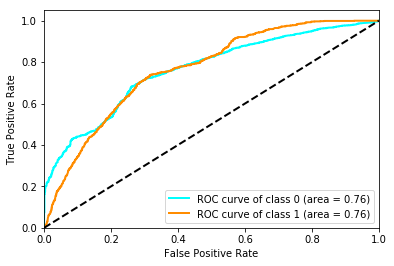

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.856526,0.452499,0.654512,0.772634,0.770008
precision,0.849558,0.467120,0.658339,0.772634,0.767663
recall,0.863610,0.438765,0.651187,0.772634,0.772634
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.762999,0.762999,0.763162,0.865135,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 250)
(21102, 2)
(4385, 250)
(4385, 2)
(21102, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_71 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_72 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_279 (Dense)            (None, 512)               66048     
_________________________________________________________________
dense_280 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_107 (Ba

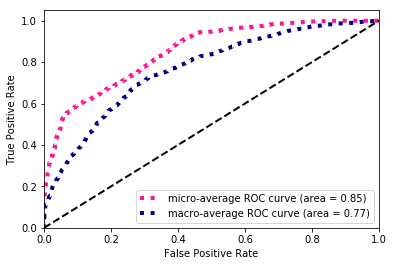

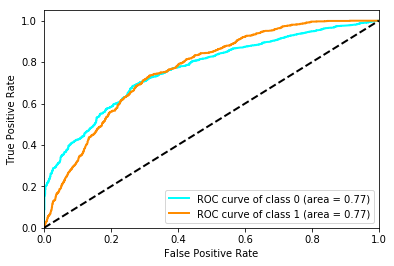

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.822150,0.495846,0.658998,0.737058,0.752276
precision,0.877511,0.420623,0.649067,0.737058,0.779673
recall,0.773360,0.603834,0.688597,0.737058,0.737058
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.765536,0.765536,0.765696,0.849714,NaN


In [21]:
Charlotte = compare_models(city='Charlotte',classname='RNN')

In [22]:
Charlotte.to_hdf('Charlotte.h5',key='RNN')
Charlotte

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.871897,0.867192,0.852432,0.875531,0.854220,0.847457
1_f1-score,0.577983,0.598638,0.609435,0.623610,0.570755,0.461178
weighted avg_f1-score,0.808959,0.809684,0.800397,0.821585,0.793519,0.764740
micro avg_f1-score,0.804029,0.801140,0.788065,0.812999,0.785329,0.763360
macro avg_f1-score,0.724940,0.732915,0.730933,0.749571,0.712488,0.654318
0_precision,0.894590,0.908439,0.927123,0.917700,0.903803,0.856706
1_precision,0.544213,0.536032,0.521851,0.548643,0.522399,0.457359
weighted avg_precision,0.819560,0.828692,0.840338,0.838670,0.822129,0.771190
micro avg_precision,0.804029,0.801140,0.788065,0.812999,0.785329,0.763360
macro avg_precision,0.719401,0.722236,0.724487,0.733172,0.713101,0.657033


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 14)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_19 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


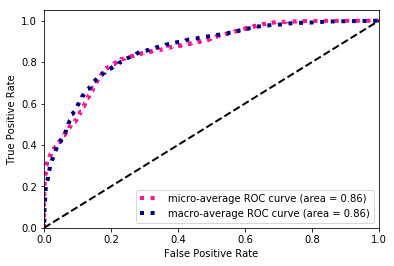

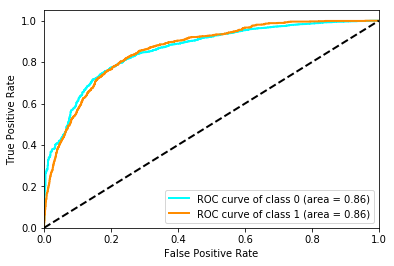

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.856920,0.611605,0.734263,0.790878,0.804388
precision,0.926763,0.507736,0.717249,0.790878,0.837033
recall,0.796866,0.768903,0.782885,0.790878,0.790878
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.860644,0.860644,0.860911,0.858441,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 14)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_20 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


 - 3s - loss: 0.3281 - f1_score: 0.6312 - val_loss: 0.3582 - val_f1_score: 0.4143
Epoch 39/60
 - 3s - loss: 0.3269 - f1_score: 0.6294 - val_loss: 0.3233 - val_f1_score: 0.3628


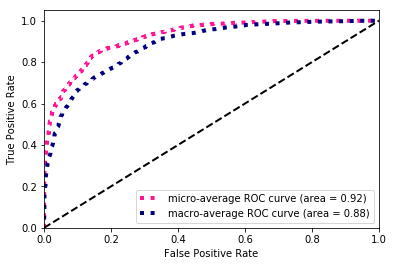

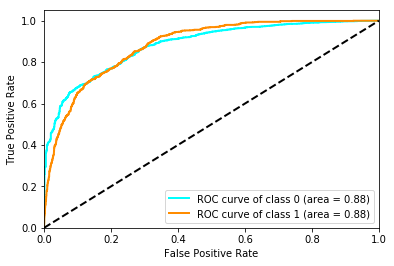

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.899343,0.642078,0.770710,0.842873,0.844252
precision,0.905560,0.626775,0.766168,0.842873,0.845862
recall,0.893210,0.658147,0.775678,0.842873,0.842873
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.882337,0.882337,0.882598,0.922244,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 14)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_21 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


Epoch 39/60
 - 3s - loss: 0.3282 - f1_score: 0.6338 - val_loss: 0.3297 - val_f1_score: 0.2298
Epoch 40/60
 - 3s - loss: 0.3265 - f1_score: 0.6366 - val_loss: 0.3367 - val_f1_score: 0.3807
Epoch 41/60
 - 3s - loss: 0.3247 - f1_score: 0.6266 - val_loss: 0.3198 - val_f1_score: 0.2784
Epoch 42/60
 - 3s - loss: 0.3273 - f1_score: 0.6376 - val_loss: 0.3462 - val_f1_score: 0.3466
Epoch 43/60
 - 3s - loss: 0.3260 - f1_score: 0.6272 - val_loss: 0.3314 - val_f1_score: 0.2700
Epoch 44/60
 - 3s - loss: 0.3248 - f1_score: 0.6308 - val_loss: 0.3410 - val_f1_score: 0.3515
Epoch 45/60
 - 3s - loss: 0.3241 - f1_score: 0.6342 - val_loss: 0.3477 - val_f1_score: 0.3803
Epoch 46/60
 - 3s - loss: 0.3250 - f1_score: 0.6371 - val_loss: 0.3488 - val_f1_score: 0.3578
Epoch 47/60
 - 3s - loss: 0.3243 - f1_score: 0.6351 - val_loss: 0.3300 - val_f1_score: 0.3036


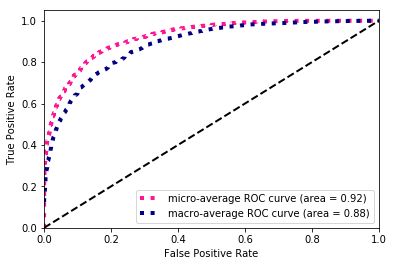

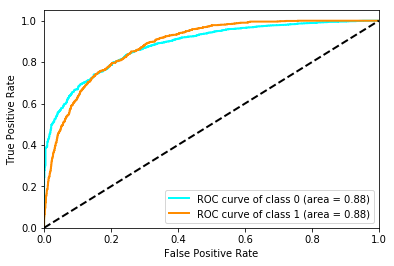

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.898293,0.636411,0.767352,0.841049,0.842214
precision,0.903434,0.623722,0.763578,0.841049,0.843537
recall,0.893210,0.649627,0.771418,0.841049,0.841049
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.884339,0.884339,0.884578,0.921884,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_22 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

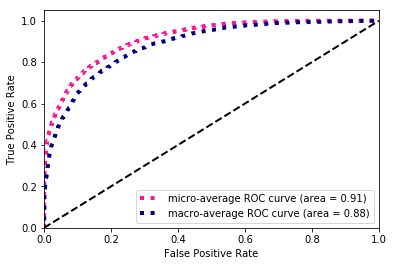

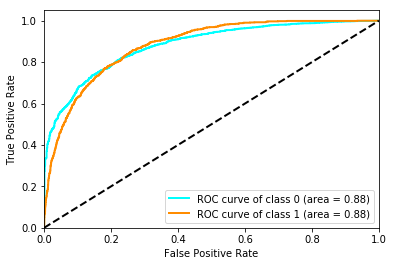

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881750,0.633645,0.757697,0.821209,0.828621
precision,0.918028,0.564530,0.741279,0.821209,0.842330
recall,0.848230,0.722045,0.785137,0.821209,0.821209
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.881055,0.881055,0.881323,0.912783,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_23 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

Epoch 39/60
 - 3s - loss: 0.3245 - f1_score: 0.6437 - val_loss: 0.3152 - val_f1_score: 0.1254
Epoch 40/60
 - 3s - loss: 0.3280 - f1_score: 0.6141 - val_loss: 0.3485 - val_f1_score: 0.3596
Epoch 41/60
 - 3s - loss: 0.3290 - f1_score: 0.6313 - val_loss: 0.3229 - val_f1_score: 0.2820


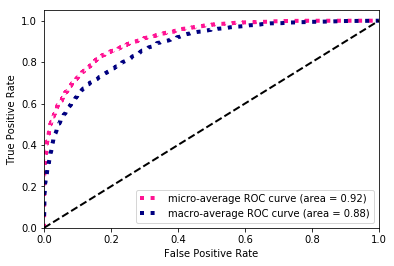

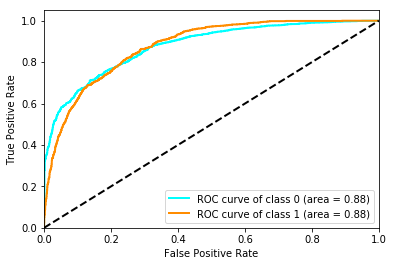

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.888658,0.633382,0.761020,0.829190,0.833993
precision,0.911003,0.586051,0.748527,0.829190,0.841418
recall,0.867382,0.689031,0.778207,0.829190,0.829190
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.877160,0.877160,0.877438,0.915339,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 315)
(21102, 2)
(4385, 315)
(4385, 2)
(21102, 8, 25)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_24 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

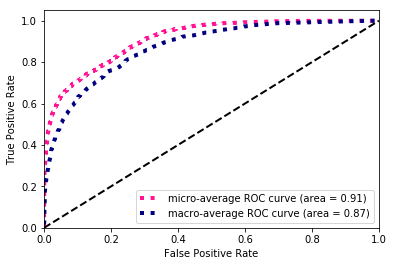

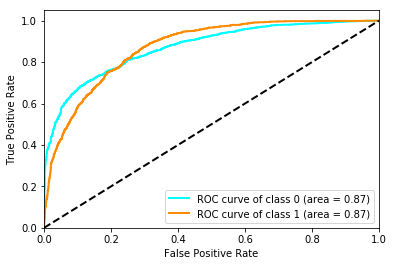

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.868521,0.605203,0.736862,0.802737,0.812134
precision,0.911906,0.529553,0.720729,0.802737,0.830029
recall,0.829077,0.706070,0.767574,0.802737,0.802737
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.871260,0.871269,0.871522,0.911072,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_25 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 3s - loss: 0.3278 - f1_score: 0.6262 - val_loss: 0.3725 - val_f1_score: 0.4532
Epoch 34/60
 - 3s - loss: 0.3262 - f1_score: 0.6288 - val_loss: 0.3255 - val_f1_score: 0.4553
Epoch 35/60
 - 3s - loss: 0.3274 - f1_score: 0.6323 - val_loss: 0.3457 - val_f1_score: 0.4604
Epoch 36/60
 - 3s - loss: 0.3282 - f1_score: 0.6347 - val_loss: 0.2956 - val_f1_score: 0.3267
Epoch 37/60
 - 3s - loss: 0.3262 - f1_score: 0.6308 - val_loss: 0.2936 - val_f1_score: 0.3303


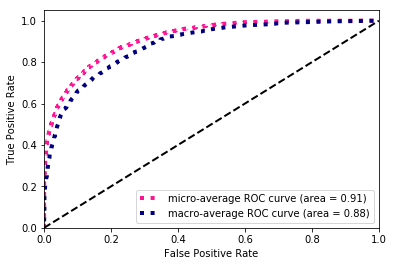

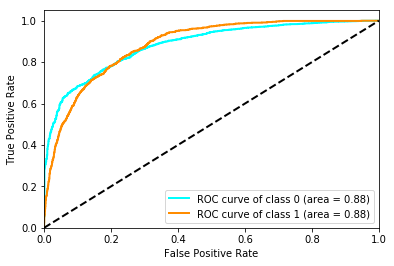

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.882592,0.635129,0.758861,0.822349,0.829601
precision,0.918156,0.566890,0.742523,0.822349,0.842936
recall,0.849681,0.722045,0.785863,0.822349,0.822349
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.883132,0.883132,0.883397,0.913574,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_26 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

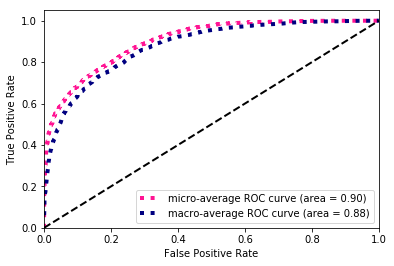

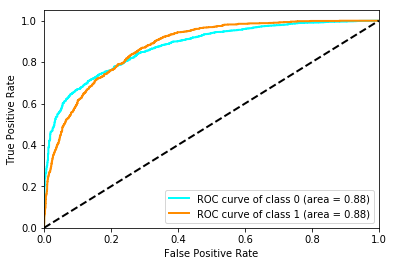

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.864140,0.612818,0.738479,0.798860,0.810323
precision,0.920880,0.521285,0.721082,0.798860,0.835311
recall,0.813987,0.743344,0.778666,0.798860,0.798860
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.876517,0.876517,0.876779,0.902264,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_27 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

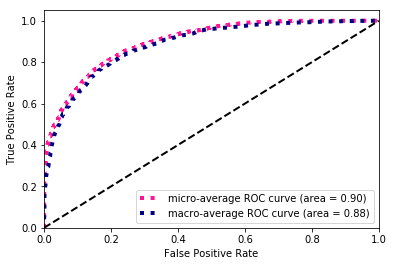

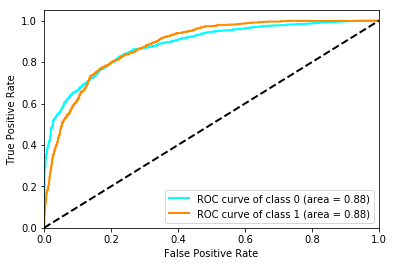

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.869579,0.636128,0.752853,0.807982,0.819588
precision,0.932558,0.535273,0.733915,0.807982,0.847484
recall,0.814568,0.783813,0.799190,0.807982,0.807982
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.883437,0.883437,0.883689,0.898297,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 235)
(21102, 2)
(4385, 235)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_28 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

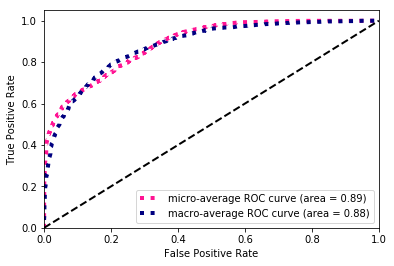

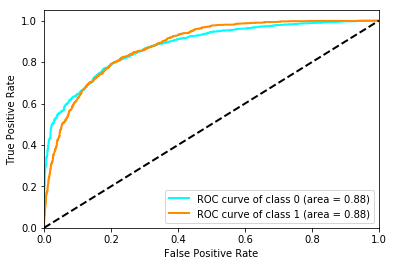

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.845601,0.614280,0.729941,0.779475,0.796066
precision,0.940007,0.491071,0.715539,0.779475,0.843872
recall,0.768427,0.820021,0.794224,0.779475,0.779475
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.879425,0.879425,0.879564,0.887511,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 235)
(21102, 2)
(4385, 235)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_29 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

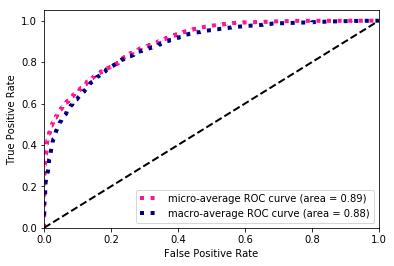

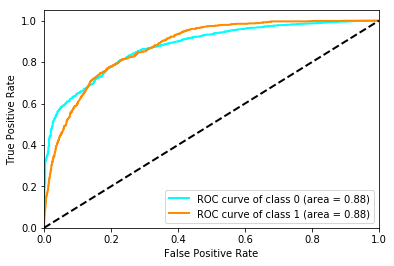

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.853954,0.614363,0.734158,0.788141,0.802648
precision,0.931732,0.503401,0.717567,0.788141,0.840010
recall,0.788160,0.788072,0.788116,0.788141,0.788141
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.876501,0.876501,0.876641,0.894383,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 235)
(21102, 2)
(4385, 235)
(4385, 2)
(21102, 8, 15)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_30 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

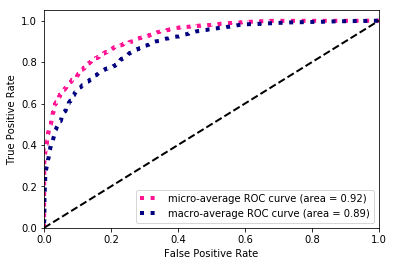

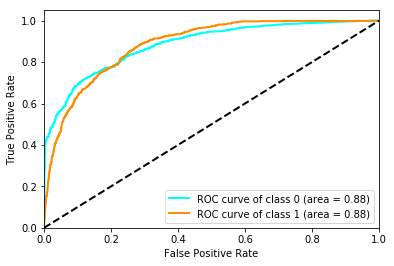

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.889877,0.632724,0.761300,0.830559,0.834810
precision,0.909421,0.590406,0.749914,0.830559,0.841108
recall,0.871155,0.681576,0.776366,0.830559,0.830559
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.884889,0.884889,0.885030,0.921455,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 259)
(21102, 2)
(4385, 259)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_31 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

Epoch 33/60
 - 3s - loss: 0.3721 - f1_score: 0.5078 - val_loss: 0.3655 - val_f1_score: 0.3586
Epoch 34/60
 - 4s - loss: 0.3721 - f1_score: 0.5236 - val_loss: 0.3265 - val_f1_score: 0.1484
Epoch 35/60
 - 4s - loss: 0.3731 - f1_score: 0.5160 - val_loss: 0.3459 - val_f1_score: 0.0794
Epoch 36/60
 - 4s - loss: 0.3726 - f1_score: 0.5111 - val_loss: 0.3091 - val_f1_score: 0.0859
Epoch 37/60
 - 3s - loss: 0.3710 - f1_score: 0.5282 - val_loss: 0.3093 - val_f1_score: 0.1189
Epoch 38/60
 - 3s - loss: 0.3692 - f1_score: 0.5315 - val_loss: 0.3379 - val_f1_score: 0.1721
Epoch 39/60
 - 3s - loss: 0.3669 - f1_score: 0.5321 - val_loss: 0.3293 - val_f1_score: 0.0300
Epoch 40/60
 - 3s - loss: 0.3708 - f1_score: 0.5244 - val_loss: 0.3319 - val_f1_score: 0.3594
Epoch 41/60
 - 3s - loss: 0.3683 - f1_score: 0.5270 - val_loss: 0.3498 - val_f1_score: 0.3420


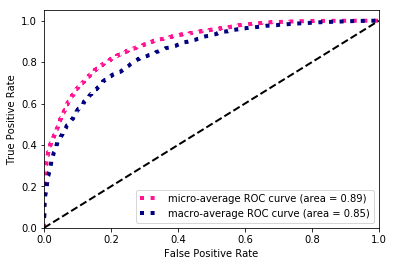

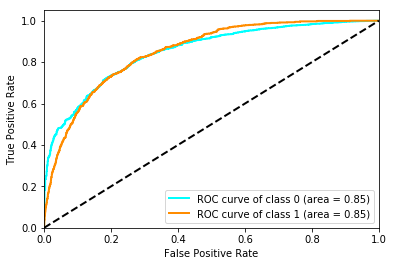

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.872525,0.595623,0.734074,0.806157,0.813230
precision,0.902855,0.538263,0.720559,0.806157,0.824782
recall,0.844167,0.666667,0.755417,0.806157,0.806157
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.851052,0.851052,0.851318,0.892262,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 259)
(21102, 2)
(4385, 259)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_32 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

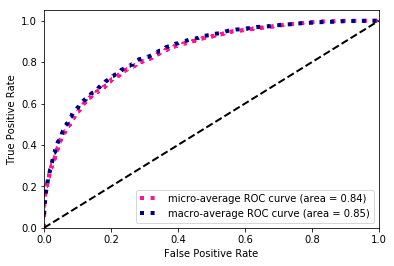

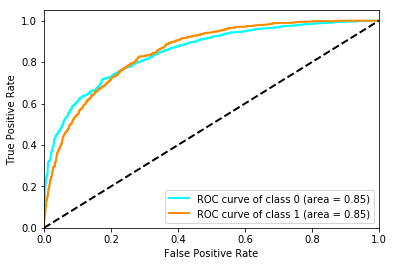

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.830882,0.579157,0.705020,0.758723,0.776978
precision,0.924911,0.462222,0.693567,0.758723,0.825831
recall,0.754208,0.775293,0.764750,0.758723,0.758723
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.851616,0.851616,0.851874,0.844343,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 259)
(21102, 2)
(4385, 259)
(4385, 2)
(21102, 8, 18)
(21102, 14)
(21102, 100)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_33 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

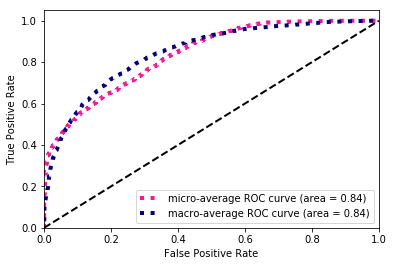

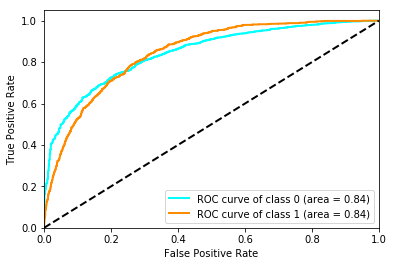

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.797200,0.560491,0.678846,0.722463,0.746512
precision,0.936204,0.424044,0.680124,0.722463,0.826530
recall,0.694138,0.826411,0.760275,0.722463,0.722463
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.844688,0.844688,0.844959,0.835565,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_34 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_103 (LS

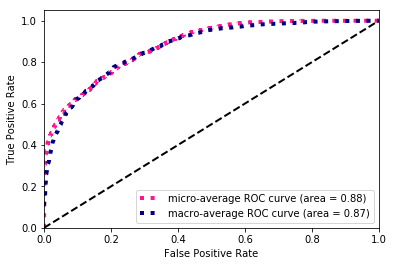

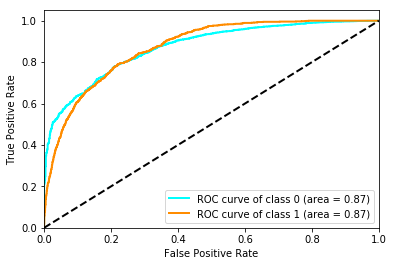

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.845410,0.604141,0.724776,0.777651,0.793745
precision,0.931842,0.488189,0.710015,0.777651,0.836839
recall,0.773651,0.792332,0.782991,0.777651,0.777651
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.872104,0.872104,0.872352,0.880952,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_35 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_105 (LS

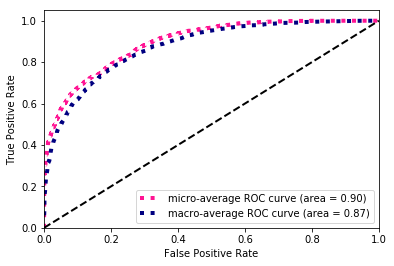

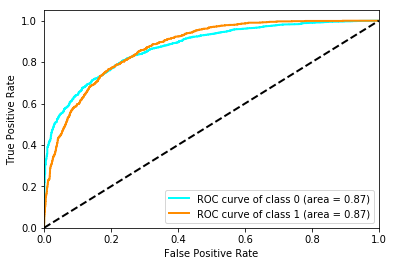

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.859988,0.615713,0.737850,0.794755,0.807679
precision,0.926895,0.513899,0.720397,0.794755,0.838456
recall,0.802089,0.767838,0.784964,0.794755,0.794755
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.874054,0.874054,0.874307,0.895021,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(21102, 251)
(21102, 2)
(4385, 251)
(4385, 2)
(21102, 8, 17)
(21102,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_36 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_107 (LS

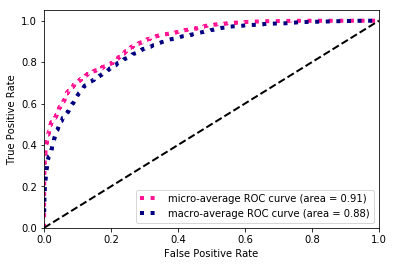

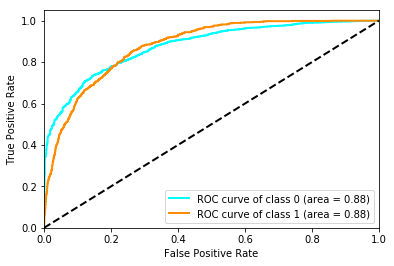

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.861658,0.614255,0.737956,0.796351,0.808679
precision,0.924227,0.516715,0.720471,0.796351,0.836963
recall,0.807023,0.757188,0.782106,0.796351,0.796351
support,3446.000000,939.000000,4385.000000,4385.000000,4385.000000
auc,0.877943,0.877943,0.878204,0.905599,NaN


In [23]:
Charlotte = compare_models(city = 'Charlotte',classname='RNN_embed')

In [24]:
Charlotte.to_hdf('Charlotte.h5',key='RNN_embed')
Charlotte

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.884852,0.879643,0.872104,0.863144,0.833536,0.855685
1_f1-score,0.630031,0.624077,0.628025,0.620455,0.578424,0.611370
weighted avg_f1-score,0.830285,0.824916,0.819837,0.811175,0.778907,0.803368
micro avg_f1-score,0.824933,0.817712,0.809730,0.799392,0.762448,0.789586
macro avg_f1-score,0.757442,0.751860,0.750064,0.741800,0.705980,0.733527
0_precision,0.911919,0.913645,0.923865,0.927054,0.921323,0.927655
1_precision,0.586077,0.560044,0.541149,0.528293,0.474843,0.506268
weighted avg_precision,0.842144,0.837926,0.841910,0.841663,0.825714,0.837419
micro avg_precision,0.824933,0.817712,0.809730,0.799392,0.762448,0.789586
macro avg_precision,0.748998,0.736845,0.732507,0.727673,0.698083,0.716961


# Dallas

******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 214)
(26555, 2)
(5345, 214)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_397 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_398 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_145 (Bat (None, 256)               1024      
_________________________________________________________________
activation_145 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_73 (Dropout)         (None, 256)         

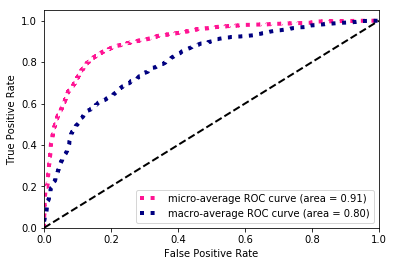

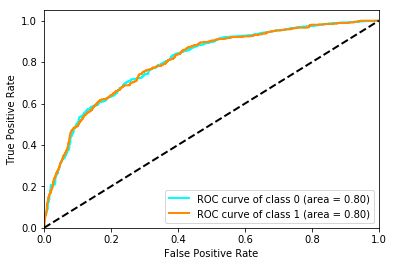

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.904934,0.438993,0.671963,0.837418,0.850712
precision,0.936170,0.366775,0.651472,0.837418,0.869909
recall,0.875715,0.546624,0.711169,0.837418,0.837418
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.804469,0.804469,0.804825,0.905186,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 214)
(26555, 2)
(5345, 214)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_401 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_402 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_147 (Bat (None, 256)               1024      
_________________________________________________________________
activation_147 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_74 (Dropout)         (None, 256)         

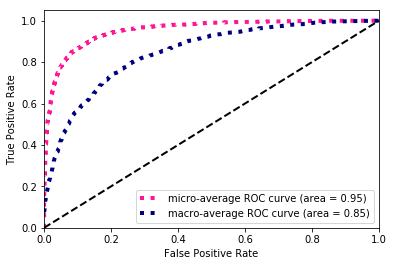

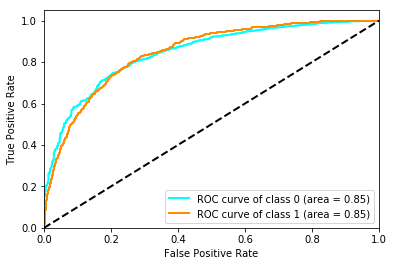

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.934935,0.441256,0.688095,0.883442,0.877485
precision,0.922506,0.498986,0.710746,0.883442,0.873221
recall,0.947703,0.395498,0.671601,0.883442,0.883442
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.846186,0.846185,0.846527,0.952982,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 214)
(26555, 2)
(5345, 214)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 214)               0         
_________________________________________________________________
dense_405 (Dense)            (None, 512)               110080    
_________________________________________________________________
dense_406 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_149 (Bat (None, 256)               1024      
_________________________________________________________________
activation_149 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_75 (Dropout)         (None, 256)         

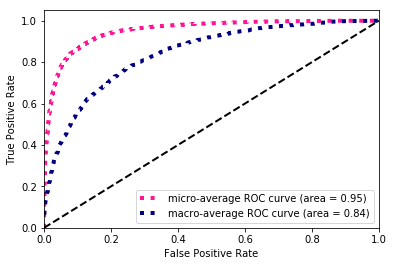

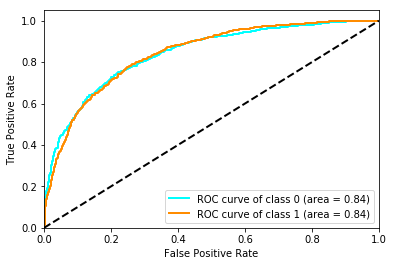

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.934377,0.430769,0.682573,0.882320,0.875772
precision,0.921020,0.492754,0.706887,0.882320,0.871183
recall,0.948126,0.382637,0.665381,0.882320,0.882320
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.841308,0.841308,0.841653,0.951693,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 300)
(26555, 2)
(5345, 300)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_409 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_410 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_151 (Bat (None, 256)               1024      
_________________________________________________________________
activation_151 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_76 (Dropout)         (None, 256)         

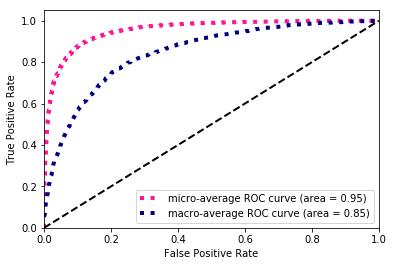

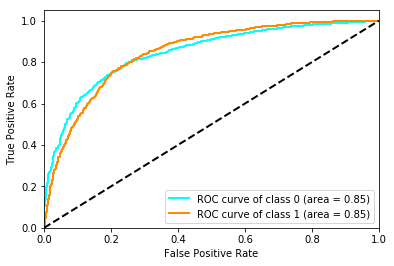

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.939524,0.368308,0.653916,0.889616,0.873052
precision,0.910590,0.551282,0.730936,0.889616,0.868777
recall,0.970358,0.276527,0.623443,0.889616,0.889616
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.845192,0.845192,0.845533,0.954493,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 300)
(26555, 2)
(5345, 300)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_413 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_414 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_153 (Bat (None, 256)               1024      
_________________________________________________________________
activation_153 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_77 (Dropout)         (None, 256)         

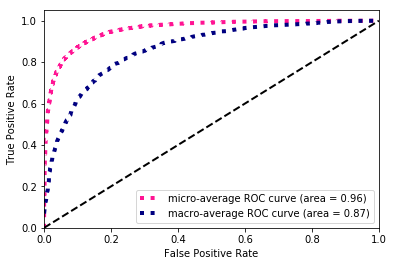

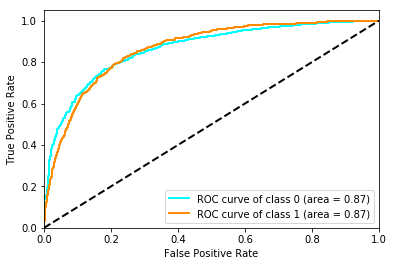

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.936545,0.468421,0.702483,0.886623,0.882069
precision,0.926455,0.515444,0.720950,0.886623,0.878626
recall,0.946856,0.429260,0.688058,0.886623,0.886623
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.865583,0.865583,0.865902,0.957058,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 300)
(26555, 2)
(5345, 300)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 300)               0         
_________________________________________________________________
dense_417 (Dense)            (None, 512)               154112    
_________________________________________________________________
dense_418 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_155 (Bat (None, 256)               1024      
_________________________________________________________________
activation_155 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_78 (Dropout)         (None, 256)         

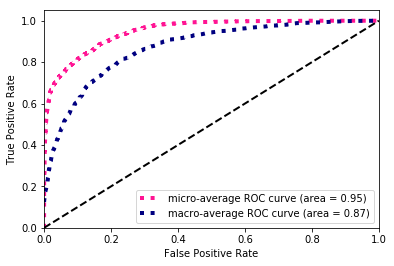

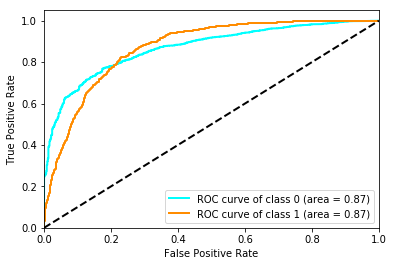

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.916576,0.482480,0.699528,0.856314,0.866060
precision,0.941111,0.415313,0.678212,0.856314,0.879924
recall,0.893288,0.575563,0.734425,0.856314,0.856314
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.869430,0.869430,0.869746,0.947893,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_421 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_422 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_157 (Bat (None, 256)               1024      
_________________________________________________________________
activation_157 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_79 (Dropout)         (None, 256)         

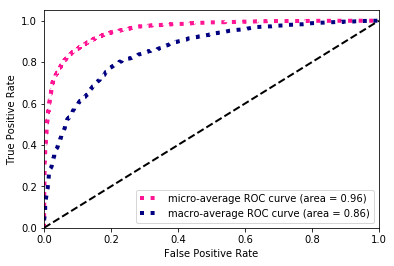

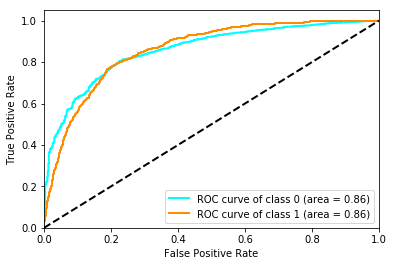

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933850,0.443662,0.688756,0.881759,0.876806
precision,0.923411,0.490272,0.706842,0.881759,0.873007
recall,0.944527,0.405145,0.674836,0.881759,0.881759
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.858967,0.858968,0.859304,0.955885,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_425 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_426 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_159 (Bat (None, 256)               1024      
_________________________________________________________________
activation_159 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_80 (Dropout)         (None, 256)         

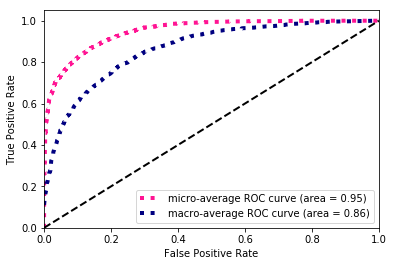

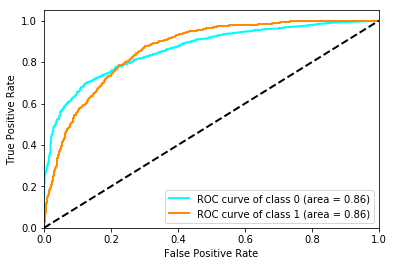

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921302,0.483734,0.702518,0.863424,0.870382
precision,0.938502,0.431818,0.685160,0.863424,0.879539
recall,0.904722,0.549839,0.727280,0.863424,0.863424
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.862442,0.862442,0.862763,0.947947,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 250)               0         
_________________________________________________________________
dense_429 (Dense)            (None, 512)               128512    
_________________________________________________________________
dense_430 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_161 (Bat (None, 256)               1024      
_________________________________________________________________
activation_161 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_81 (Dropout)         (None, 256)         

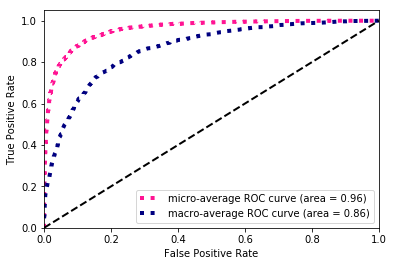

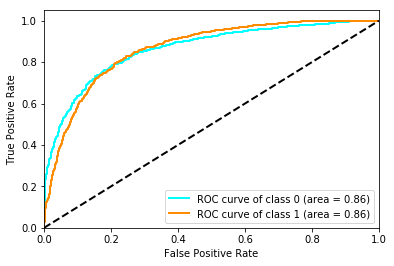

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938254,0.394338,0.666296,0.887933,0.874958
precision,0.914223,0.531335,0.722779,0.887933,0.869666
recall,0.963582,0.313505,0.638544,0.887933,0.887933
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.864195,0.864195,0.864522,0.958109,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_433 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_434 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_163 (Bat (None, 256)               1024      
_________________________________________________________________
activation_163 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_82 (Dropout)         (None, 256)         

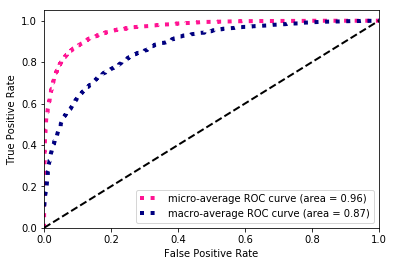

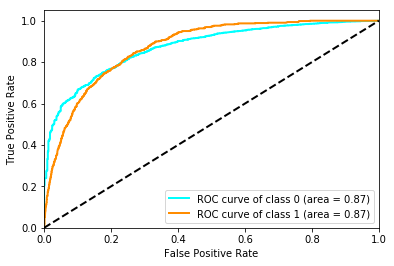

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938184,0.459435,0.698809,0.889055,0.882472
precision,0.924025,0.530526,0.727275,0.889055,0.878233
recall,0.952784,0.405145,0.678964,0.889055,0.889055
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.872736,0.872736,0.872901,0.959840,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_437 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_438 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_165 (Bat (None, 256)               1024      
_________________________________________________________________
activation_165 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_83 (Dropout)         (None, 256)         

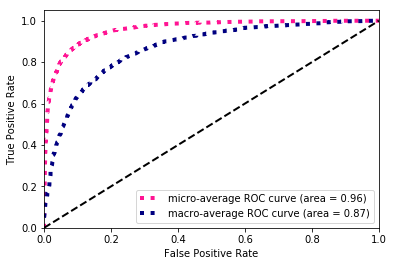

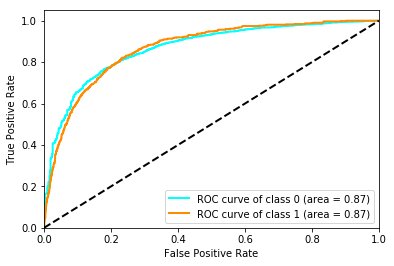

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.939867,0.463822,0.701844,0.891862,0.884469
precision,0.923911,0.548246,0.736078,0.891862,0.880194
recall,0.956384,0.401929,0.679156,0.891862,0.891862
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.867540,0.867540,0.867715,0.958856,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 234)               0         
_________________________________________________________________
dense_441 (Dense)            (None, 512)               120320    
_________________________________________________________________
dense_442 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_167 (Bat (None, 256)               1024      
_________________________________________________________________
activation_167 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_84 (Dropout)         (None, 256)         

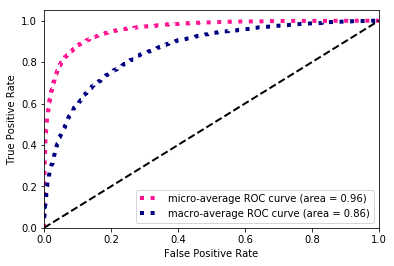

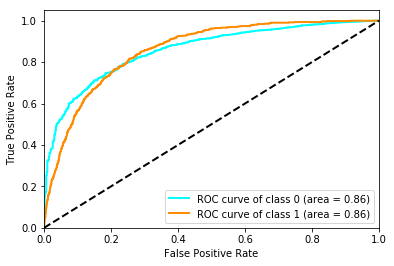

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.940235,0.278729,0.609482,0.889616,0.863255
precision,0.901340,0.581633,0.741486,0.889616,0.864136
recall,0.982638,0.183280,0.582959,0.889616,0.889616
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.858613,0.858613,0.858781,0.957805,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_445 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_446 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_169 (Bat (None, 256)               1024      
_________________________________________________________________
activation_169 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_85 (Dropout)         (None, 256)         

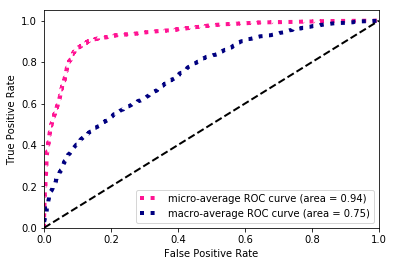

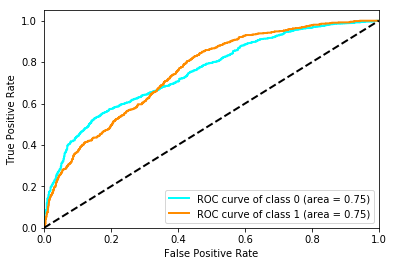

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938041,0.018898,0.478469,0.883442,0.831080
precision,0.884471,0.461538,0.673005,0.883442,0.835254
recall,0.998518,0.009646,0.504082,0.883442,0.883442
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.751849,0.751850,0.752233,0.935429,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_449 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_450 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_171 (Bat (None, 256)               1024      
_________________________________________________________________
activation_171 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_86 (Dropout)         (None, 256)         

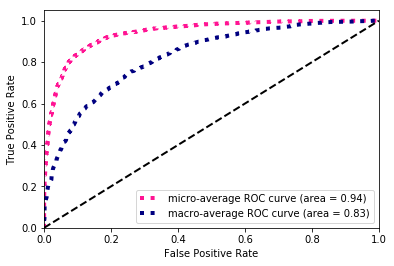

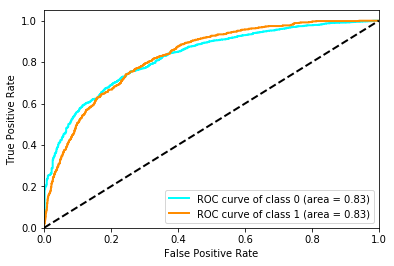

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.927265,0.411565,0.669415,0.870533,0.867253
precision,0.920685,0.436823,0.678754,0.870533,0.864377
recall,0.933940,0.389068,0.661504,0.870533,0.870533
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.827153,0.827153,0.827515,0.941553,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 258)               0         
_________________________________________________________________
dense_453 (Dense)            (None, 512)               132608    
_________________________________________________________________
dense_454 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_173 (Bat (None, 256)               1024      
_________________________________________________________________
activation_173 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_87 (Dropout)         (None, 256)         

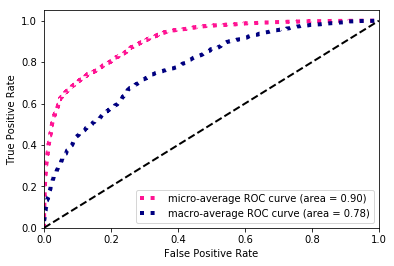

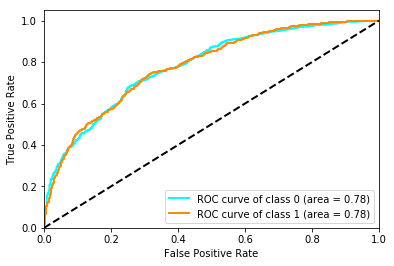

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.881953,0.383944,0.632949,0.801871,0.823999
precision,0.931262,0.300820,0.616041,0.801871,0.857897
recall,0.837603,0.530547,0.684075,0.801871,0.801871
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.781678,0.781678,0.782065,0.904975,NaN


******************** DNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 136)
(26555, 2)
(5345, 136)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_457 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_458 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_175 (Bat (None, 256)               1024      
_________________________________________________________________
activation_175 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_88 (Dropout)         (None, 256)         

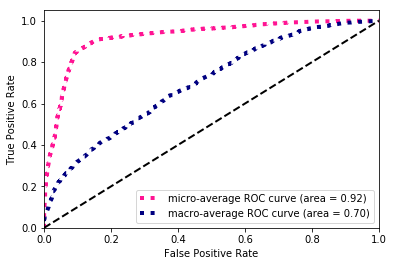

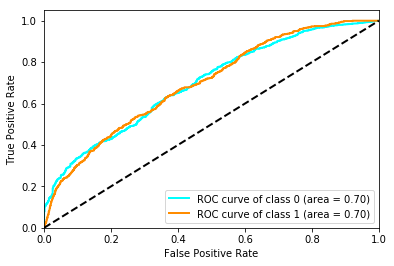

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932669,0.228438,0.580554,0.876146,0.850717
precision,0.897436,0.415254,0.656345,0.876146,0.841324
recall,0.970781,0.157556,0.564169,0.876146,0.876146
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.697199,0.697199,0.697429,0.923621,NaN


******************** DNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 136)
(26555, 2)
(5345, 136)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_461 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_462 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_177 (Bat (None, 256)               1024      
_________________________________________________________________
activation_177 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_89 (Dropout)         (None, 256)         

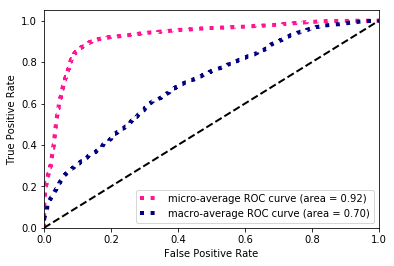

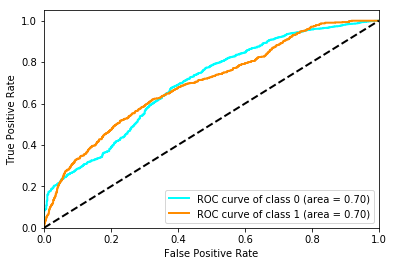

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.935558,0.137281,0.536420,0.880075,0.842663
precision,0.890697,0.421488,0.656092,0.880075,0.836095
recall,0.985179,0.081994,0.533586,0.880075,0.880075
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.698516,0.698516,0.698744,0.924271,NaN


******************** DNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 136)
(26555, 2)
(5345, 136)
(5345, 2)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 136)               0         
_________________________________________________________________
dense_465 (Dense)            (None, 512)               70144     
_________________________________________________________________
dense_466 (Dense)            (None, 256)               131328    
_________________________________________________________________
batch_normalization_179 (Bat (None, 256)               1024      
_________________________________________________________________
activation_179 (Activation)  (None, 256)               0         
_________________________________________________________________
dropout_90 (Dropout)         (None, 256)         

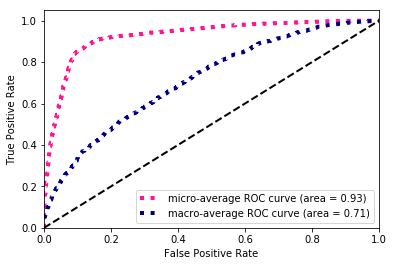

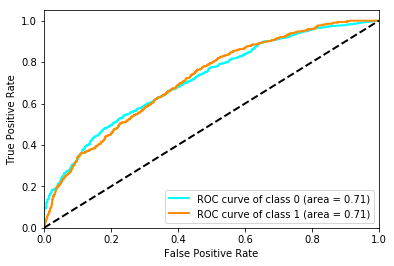

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933144,0.224057,0.578600,0.876894,0.850627
precision,0.897050,0.420354,0.658702,0.876894,0.841577
recall,0.972263,0.152733,0.562498,0.876894,0.876894
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.714641,0.714641,0.714875,0.927133,NaN


In [25]:
Dallas = compare_models(city='Dallas',classname='DNN')

In [26]:
Dallas.to_hdf('Dallas.h5',key='DNN')
Dallas

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.924748,0.930882,0.931135,0.939429,0.915753,0.933790
1_f1-score,0.437006,0.439736,0.440578,0.400662,0.271469,0.196592
weighted avg_f1-score,0.867990,0.873727,0.874049,0.876732,0.840777,0.848002
micro avg_f1-score,0.867727,0.877518,0.877705,0.890178,0.851949,0.877705
macro avg_f1-score,0.680877,0.685309,0.685857,0.670045,0.593611,0.565191
0_precision,0.926566,0.926052,0.925379,0.916425,0.912139,0.895061
1_precision,0.452838,0.494013,0.484475,0.553468,0.399727,0.419032
weighted avg_precision,0.871438,0.875776,0.874071,0.874188,0.852510,0.839665
micro avg_precision,0.867727,0.877518,0.877705,0.890178,0.851949,0.877705
macro avg_precision,0.689702,0.710033,0.704927,0.734947,0.655933,0.657046


******************** RNN_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_2 (LSTM)  

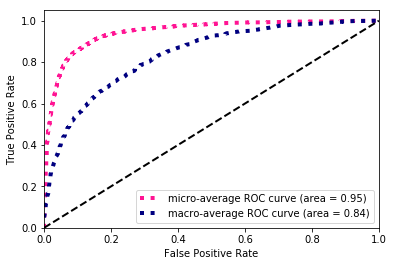

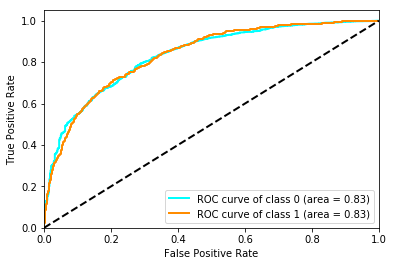

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932031,0.447481,0.689756,0.878952,0.875643
precision,0.924937,0.477231,0.701084,0.878952,0.872838
recall,0.939234,0.421222,0.680228,0.878952,0.878952
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.834678,0.834678,0.835040,0.945501,NaN


******************** RNN_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)  

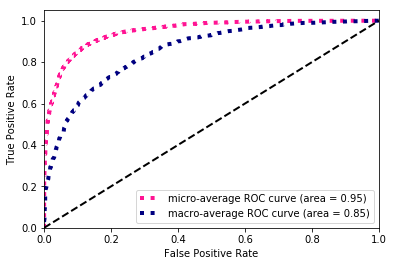

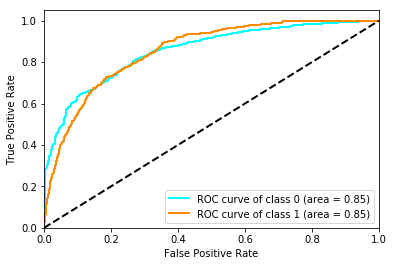

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.929923,0.460537,0.695230,0.875959,0.875300
precision,0.928451,0.466227,0.697339,0.875959,0.874662
recall,0.931400,0.454984,0.693192,0.875959,0.875959
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.854512,0.854512,0.854849,0.948488,NaN


******************** RNN_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 14)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)  

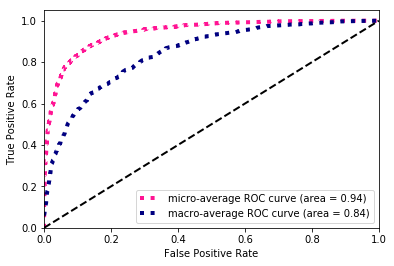

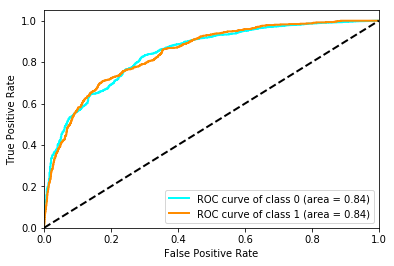

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.925958,0.485119,0.705538,0.870533,0.874657
precision,0.935972,0.451524,0.693748,0.870533,0.879597
recall,0.916155,0.524116,0.720135,0.870533,0.870533
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.844189,0.844189,0.844535,0.943159,NaN


******************** RNN_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_8 (LS

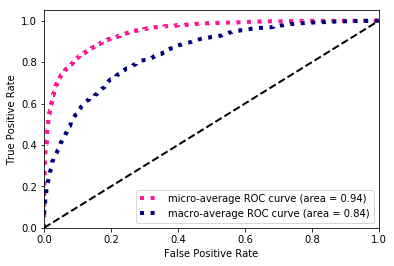

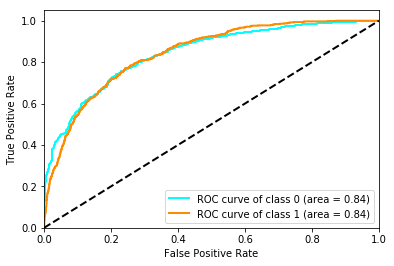

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921604,0.475917,0.698761,0.863611,0.869740
precision,0.936407,0.430429,0.683418,0.863611,0.877526
recall,0.907262,0.532154,0.719708,0.863611,0.863611
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.842026,0.842026,0.842365,0.943252,NaN


******************** RNN_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_9 (LSTM)                   (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_10 (L

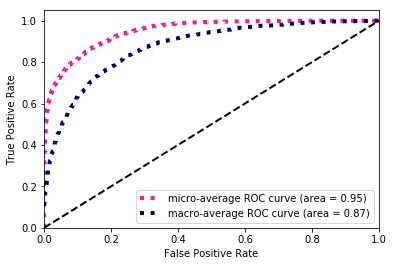

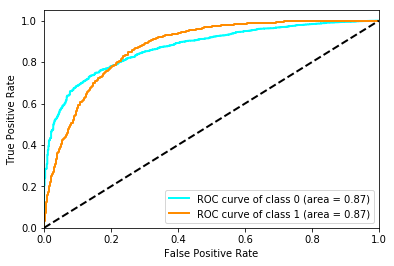

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921297,0.494444,0.707871,0.863798,0.871624
precision,0.941241,0.435208,0.688225,0.863798,0.882354
recall,0.902181,0.572347,0.737264,0.863798,0.863798
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.873060,0.873060,0.873339,0.948292,NaN


******************** RNN_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 314)
(26555, 2)
(5345, 314)
(5345, 2)
(26555, 8, 25)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 8, 128)       78848       main_input[0][0]                 
__________________________________________________________________________________________________
nlp_input (InputLayer)          (None, 100)          0                                            
__________________________________________________________________________________________________
lstm_12 (L

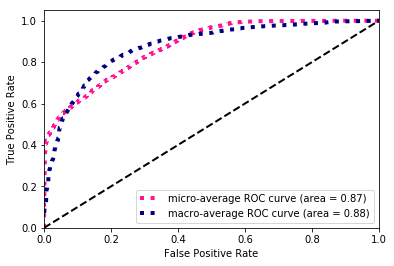

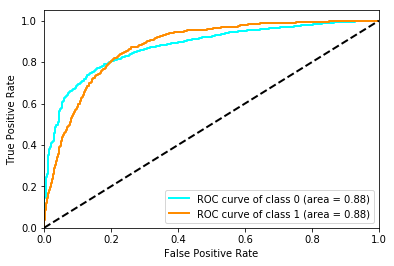

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.846596,0.454390,0.650493,0.760524,0.800955
precision,0.975421,0.309165,0.642293,0.760524,0.897889
recall,0.747830,0.856913,0.802371,0.760524,0.760524
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.875581,0.875581,0.875863,0.874473,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_13 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

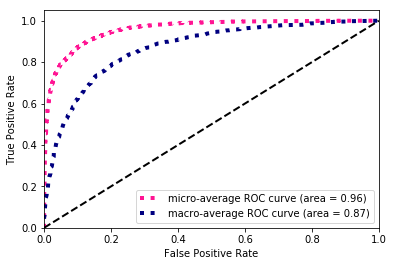

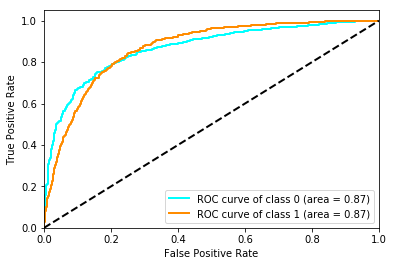

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937207,0.445262,0.691235,0.887184,0.879959
precision,0.922131,0.520430,0.721281,0.887184,0.875385
recall,0.952784,0.389068,0.670926,0.887184,0.887184
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.867446,0.867446,0.867798,0.957714,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_15 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

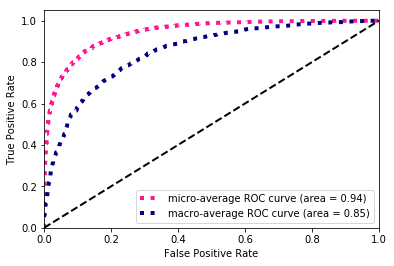

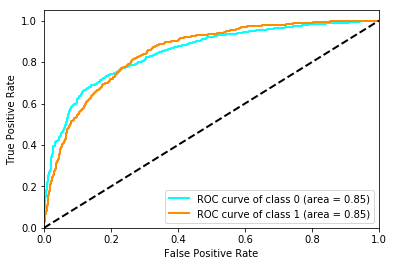

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.921389,0.474479,0.697934,0.863237,0.869382
precision,0.936189,0.429129,0.682659,0.863237,0.877182
recall,0.907051,0.530547,0.718799,0.863237,0.863237
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.849349,0.849349,0.849678,0.941828,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
lstm_17 (LSTM)                  (None, 8, 128)       74752       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

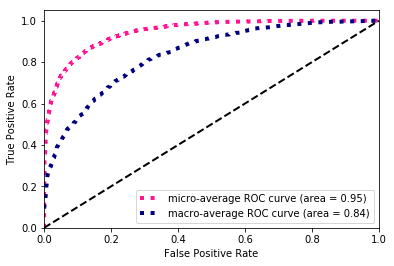

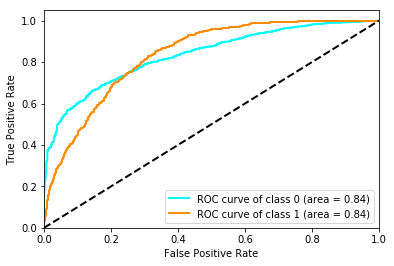

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.923726,0.402973,0.663349,0.864733,0.863126
precision,0.920521,0.414261,0.667391,0.864733,0.861608
recall,0.926953,0.392283,0.659618,0.864733,0.864733
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.835086,0.835086,0.835424,0.945047,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

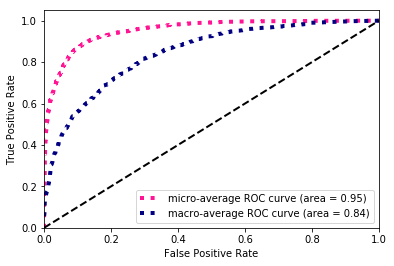

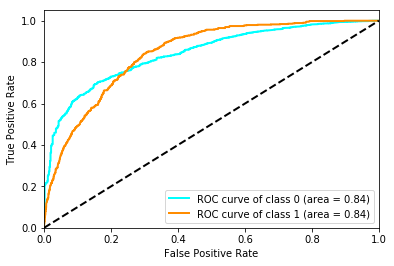

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937076,0.365145,0.651111,0.885500,0.870520
precision,0.910853,0.514620,0.712737,0.885500,0.864744
recall,0.964853,0.282958,0.623906,0.885500,0.885500
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.843107,0.843107,0.843300,0.952828,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_21 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

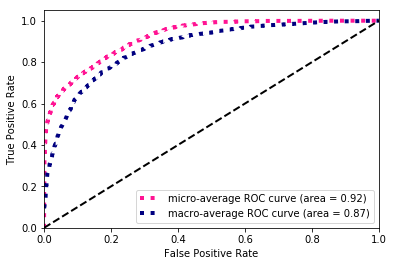

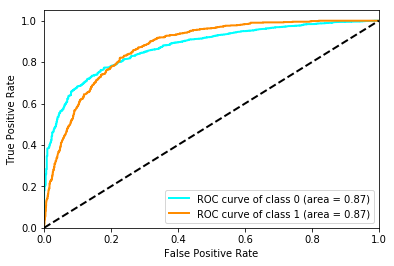

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.890176,0.487003,0.688589,0.819083,0.843259
precision,0.960069,0.363420,0.661745,0.819083,0.890636
recall,0.829769,0.737942,0.783856,0.819083,0.819083
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.872344,0.872344,0.872509,0.921100,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 234)
(26555, 2)
(5345, 234)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
lstm_23 (LSTM)                  (None, 8, 128)       73728       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

Epoch 42/60
 - 4s - loss: 0.2618 - f1_score: 0.3371 - val_loss: 0.0872 - val_f1_score: 0.0000e+00
Epoch 43/60
 - 4s - loss: 0.2617 - f1_score: 0.3364 - val_loss: 0.1396 - val_f1_score: 0.0777
Epoch 44/60
 - 4s - loss: 0.2607 - f1_score: 0.3549 - val_loss: 0.1412 - val_f1_score: 0.0000e+00
Epoch 45/60
 - 4s - loss: 0.2599 - f1_score: 0.3530 - val_loss: 0.0977 - val_f1_score: 0.0000e+00
Epoch 46/60
 - 4s - loss: 0.2598 - f1_score: 0.3358 - val_loss: 0.0865 - val_f1_score: 0.0000e+00
Epoch 47/60
 - 4s - loss: 0.2602 - f1_score: 0.3563 - val_loss: 0.0703 - val_f1_score: 0.0000e+00
Epoch 48/60
 - 4s - loss: 0.2591 - f1_score: 0.3450 - val_loss: 0.1023 - val_f1_score: 0.0000e+00


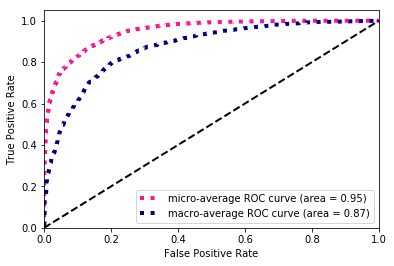

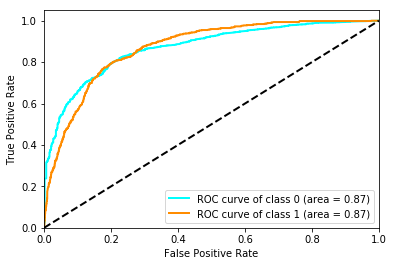

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.924810,0.487198,0.706004,0.868849,0.873885
precision,0.937174,0.446980,0.692077,0.868849,0.880130
recall,0.912767,0.535370,0.724069,0.868849,0.868849
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.870290,0.870290,0.870448,0.948827,NaN


******************** RNN ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_25 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

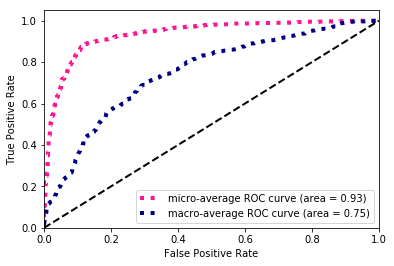

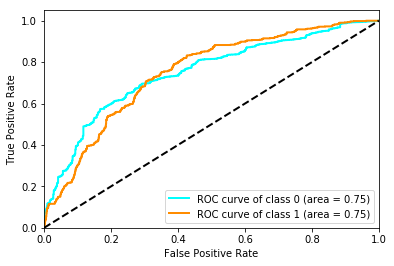

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937563,0.184211,0.560887,0.884004,0.849895
precision,0.893989,0.507246,0.700618,0.884004,0.848983
recall,0.985602,0.112540,0.549071,0.884004,0.884004
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.748933,0.748933,0.749343,0.934498,NaN


******************** RNN ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_27 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


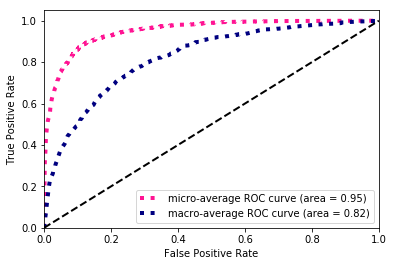

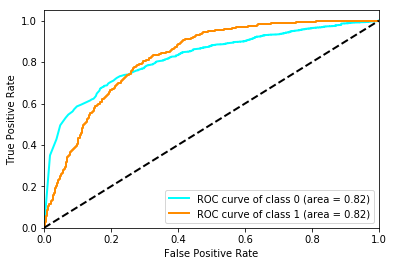

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938220,0.000000,0.469110,0.883630,0.829039
precision,0.883630,0.000000,0.441815,0.883630,0.780801
recall,1.000000,0.000000,0.500000,0.883630,0.883630
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.822086,0.823414,0.823009,0.950005,NaN


******************** RNN ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 258)
(26555, 2)
(5345, 258)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
lstm_29 (LSTM)                  (None, 8, 128)       75264       main_input[0][0]                 
__________________________________________________________________________________________________
geohash_input (InputLayer)      (None, 14)           0                                            
__________________________________________________________________________________________________
nlp_input

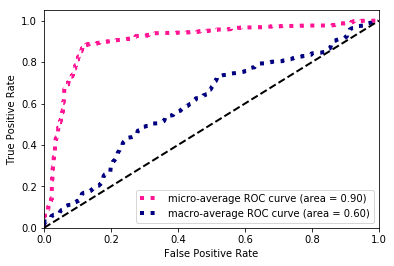

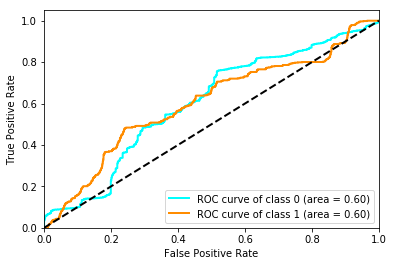

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938220,0.000000,0.469110,0.883630,0.829039
precision,0.883630,0.000000,0.441815,0.883630,0.780801
recall,1.000000,0.000000,0.500000,0.883630,0.883630
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.601768,0.601768,0.602243,0.904559,NaN


******************** RNN_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_31 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_32 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_85 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_86 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_31 (Bat

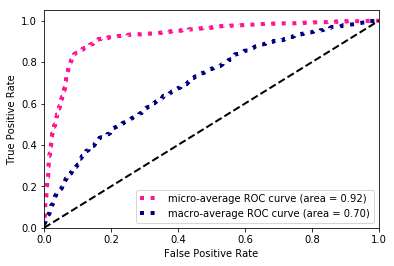

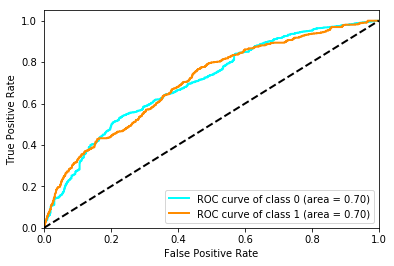

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.930608,0.249724,0.590166,0.872965,0.851373
precision,0.899447,0.399293,0.649370,0.872965,0.841244
recall,0.964006,0.181672,0.572839,0.872965,0.872965
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.701430,0.701430,0.701670,0.924132,NaN


******************** RNN_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_33 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_34 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_89 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_90 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_33 (Bat

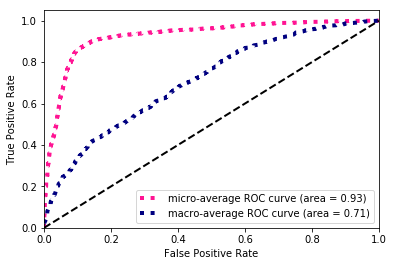

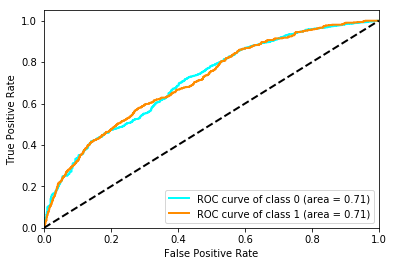

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.935068,0.165803,0.550435,0.879514,0.845548
precision,0.892589,0.426667,0.659628,0.879514,0.838369
recall,0.981791,0.102894,0.542343,0.879514,0.879514
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.709528,0.709528,0.709753,0.926501,NaN


******************** RNN_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 250)
(26555, 2)
(5345, 250)
(5345, 2)
(26555, 8, 17)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
main_input (InputLayer)      (None, 8, 17)             0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 8, 128)            74752     
_________________________________________________________________
lstm_36 (LSTM)               (None, 128)               131584    
_________________________________________________________________
dense_93 (Dense)             (None, 512)               66048     
_________________________________________________________________
dense_94 (Dense)             (None, 256)               131328    
_________________________________________________________________
batch_normalization_35 (Bat

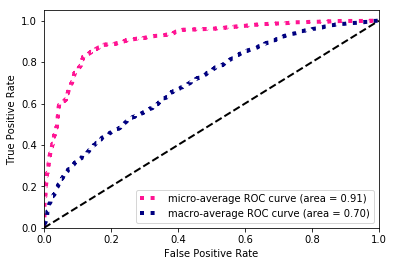

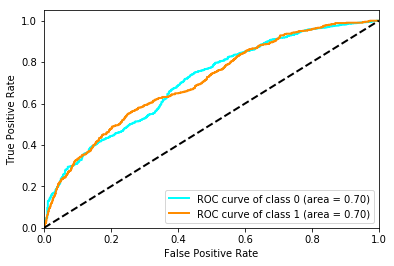

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.919476,0.282004,0.600740,0.855192,0.845293
precision,0.903866,0.333333,0.618600,0.855192,0.837473
recall,0.935634,0.244373,0.590004,0.855192,0.855192
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.703850,0.703849,0.704085,0.911205,NaN


In [17]:
Dallas = compare_models(city='Dallas',classname='RNN')

In [18]:
Dallas.to_hdf('Dallas.h5',key='RNN')
Dallas

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.929304,0.896499,0.927441,0.917354,0.938001,0.928384
1_f1-score,0.464379,0.474917,0.440905,0.446449,0.061404,0.232510
weighted avg_f1-score,0.875200,0.847440,0.870822,0.862554,0.835991,0.847405
micro avg_f1-score,0.875148,0.829311,0.871718,0.857811,0.883754,0.869224
macro avg_f1-score,0.696841,0.685708,0.684173,0.681901,0.499702,0.580447
0_precision,0.929787,0.951023,0.926280,0.936032,0.887083,0.898634
1_precision,0.464994,0.391601,0.454607,0.441673,0.169082,0.386431
weighted avg_precision,0.875699,0.885923,0.871392,0.878503,0.803529,0.839029
micro avg_precision,0.875148,0.829311,0.871718,0.857811,0.883754,0.869224
macro avg_precision,0.697390,0.671312,0.690444,0.688853,0.528082,0.642532


******************** RNN_embed_wo_NLP ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 14)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


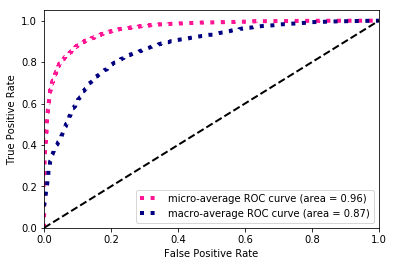

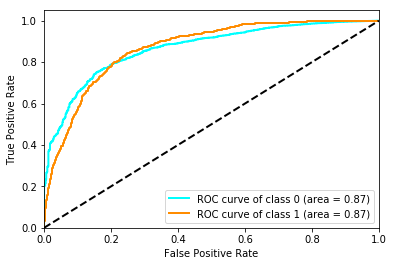

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938974,0.422701,0.680837,0.889616,0.878895
precision,0.917897,0.540000,0.728948,0.889616,0.873921
recall,0.961042,0.347267,0.654154,0.889616,0.889616
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.867275,0.867275,0.867580,0.959126,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 14)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


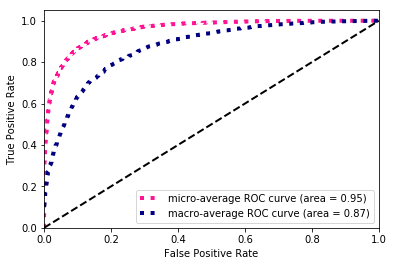

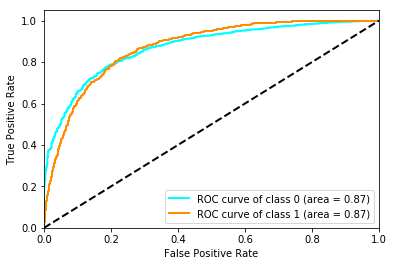

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933629,0.488599,0.711114,0.882507,0.881841
precision,0.932053,0.495050,0.713551,0.882507,0.881199
recall,0.935211,0.482315,0.708763,0.882507,0.882507
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.871029,0.871029,0.871325,0.954831,NaN


******************** RNN_embed_wo_NLP ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 14)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________


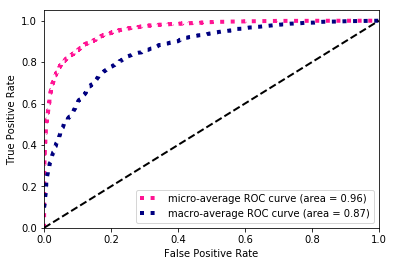

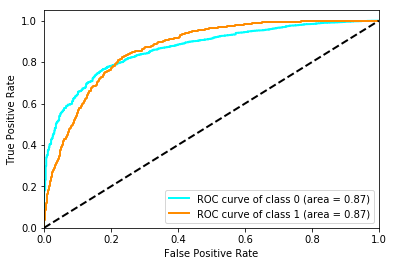

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933305,0.440737,0.687021,0.880823,0.875985
precision,0.923157,0.485493,0.704325,0.880823,0.872226
recall,0.943680,0.403537,0.673608,0.880823,0.880823
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.866288,0.866288,0.866605,0.956454,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

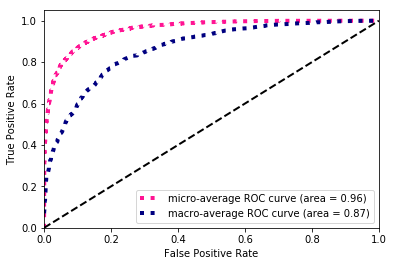

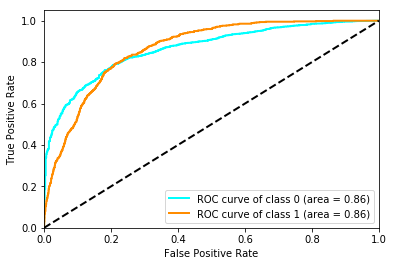

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.936756,0.406220,0.671488,0.885688,0.875017
precision,0.916363,0.513514,0.714938,0.885688,0.869483
recall,0.958077,0.336013,0.647045,0.885688,0.885688
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.864858,0.864858,0.865165,0.957277,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

Epoch 38/60
 - 4s - loss: 0.2616 - f1_score: 0.3487 - val_loss: 0.0974 - val_f1_score: 0.0000e+00
Epoch 39/60
 - 4s - loss: 0.2600 - f1_score: 0.3551 - val_loss: 0.1337 - val_f1_score: 0.0000e+00
Epoch 40/60
 - 4s - loss: 0.2607 - f1_score: 0.3567 - val_loss: 0.0801 - val_f1_score: 0.0000e+00
Epoch 41/60
 - 4s - loss: 0.2606 - f1_score: 0.3552 - val_loss: 0.1017 - val_f1_score: 0.0000e+00
Epoch 42/60
 - 4s - loss: 0.2607 - f1_score: 0.3544 - val_loss: 0.1583 - val_f1_score: 0.0995


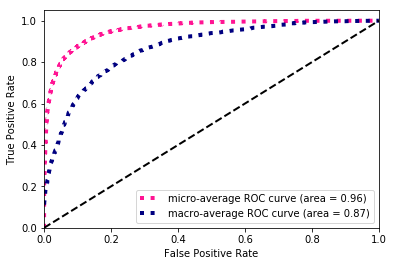

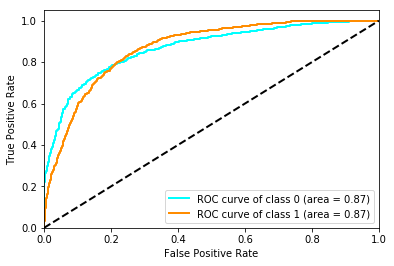

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.937797,0.405138,0.671468,0.887371,0.875811
precision,0.915843,0.525641,0.720742,0.887371,0.870435
recall,0.960830,0.329582,0.645206,0.887371,0.887371
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.868046,0.868046,0.868346,0.958928,NaN


******************** RNN_embed_wo_geohash ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 315)
(26555, 2)
(5345, 315)
(5345, 2)
(26555, 8, 25)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 25)        0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
______________________________________________________________________________________________

Epoch 37/60
 - 4s - loss: 0.2628 - f1_score: 0.3554 - val_loss: 0.1102 - val_f1_score: 0.0000e+00


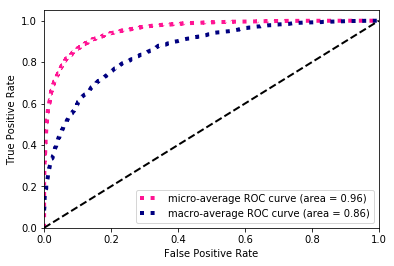

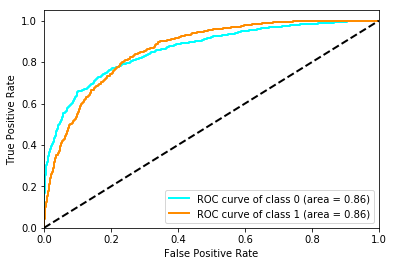

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.934981,0.454785,0.694883,0.883817,0.879100
precision,0.924814,0.500967,0.712890,0.883817,0.875490
recall,0.945374,0.416399,0.680886,0.883817,0.883817
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.861710,0.861710,0.862026,0.955315,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

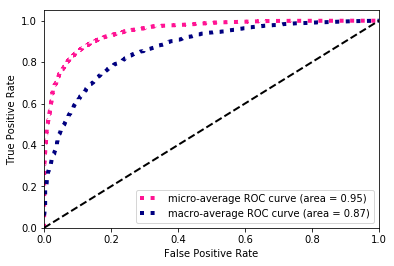

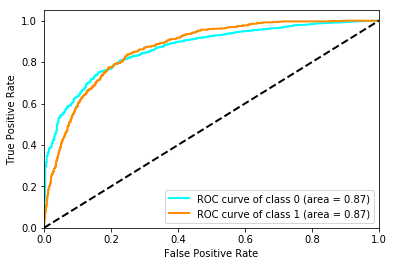

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.930844,0.483360,0.707102,0.878017,0.878770
precision,0.932625,0.476562,0.704594,0.878017,0.879553
recall,0.929071,0.490354,0.709712,0.878017,0.878017
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.867507,0.867507,0.867821,0.950071,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

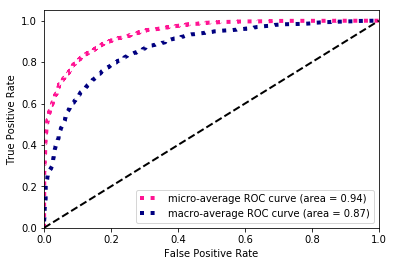

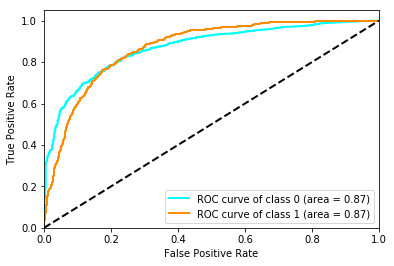

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.914868,0.502879,0.708874,0.854630,0.866925
precision,0.948002,0.417641,0.682821,0.854630,0.886283
recall,0.883972,0.631833,0.757902,0.854630,0.854630
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.871146,0.871146,0.871458,0.939119,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_9 (Embedding)         (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

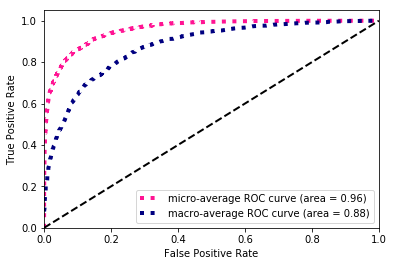

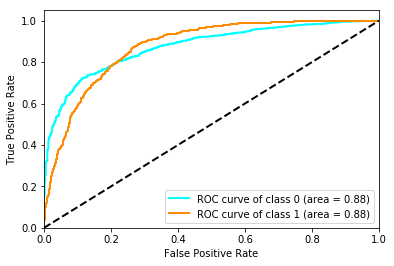

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932449,0.458685,0.695567,0.879888,0.877317
precision,0.926794,0.482270,0.704532,0.879888,0.875064
recall,0.938175,0.437299,0.687737,0.879888,0.879888
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.875399,0.875399,0.875701,0.957199,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 235)
(26555, 2)
(5345, 235)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_10 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

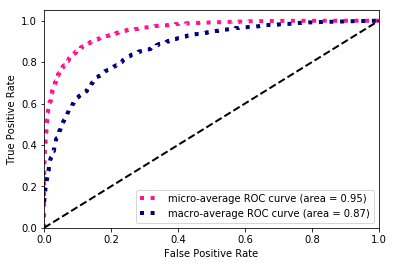

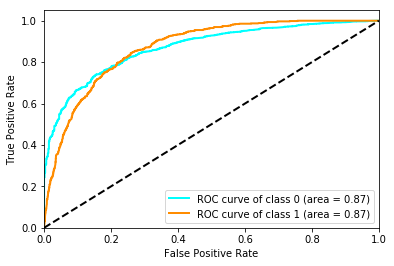

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.931524,0.485669,0.708597,0.879139,0.879640
precision,0.932711,0.481073,0.706892,0.879139,0.880153
recall,0.930341,0.490354,0.710347,0.879139,0.879139
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.871078,0.871078,0.871225,0.952610,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 235)
(26555, 2)
(5345, 235)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_11 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

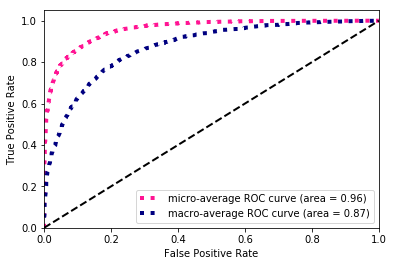

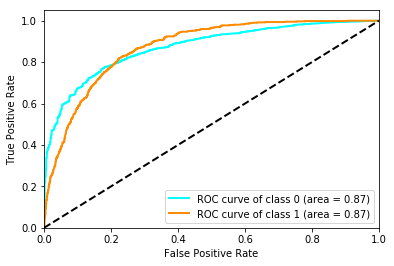

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.932410,0.445783,0.689096,0.879514,0.875781
precision,0.924454,0.479630,0.702042,0.879514,0.872689
recall,0.940504,0.416399,0.678451,0.879514,0.879514
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.871876,0.871876,0.872028,0.957746,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 235)
(26555, 2)
(5345, 235)
(5345, 2)
(26555, 8, 15)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 15)        0                                            
__________________________________________________________________________________________________
embedding_12 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

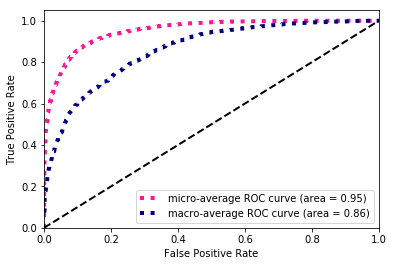

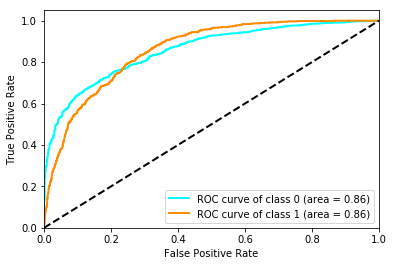

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.931926,0.469136,0.700531,0.879326,0.878071
precision,0.929082,0.480607,0.704845,0.879326,0.876893
recall,0.934787,0.458199,0.696493,0.879326,0.879326
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.858115,0.858115,0.858271,0.951554,NaN


******************** RNN_embed ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 259)
(26555, 2)
(5345, 259)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

/users/PAS0536/osu9965/.local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


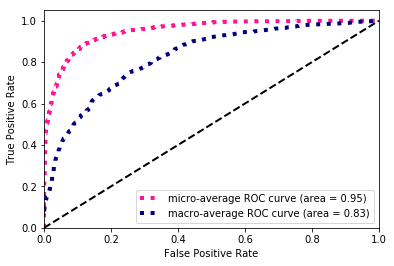

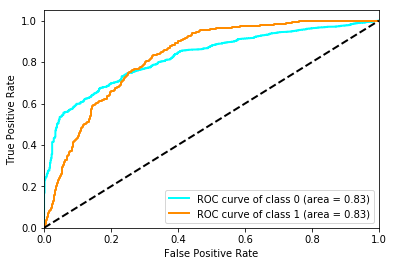

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938220,0.000000,0.469110,0.88363,0.829039
precision,0.883630,0.000000,0.441815,0.88363,0.780801
recall,1.000000,0.000000,0.500000,0.88363,0.883630
support,4723.000000,622.000000,5345.000000,5345.00000,5345.000000
auc,0.825835,0.825835,0.826162,0.95064,NaN


******************** RNN_embed ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 259)
(26555, 2)
(5345, 259)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_14 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

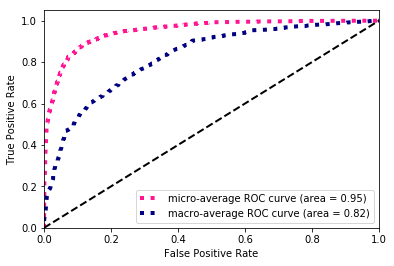

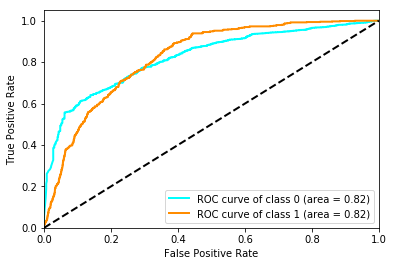

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.938220,0.000000,0.469110,0.883630,0.829039
precision,0.883630,0.000000,0.441815,0.883630,0.780801
recall,1.000000,0.000000,0.500000,0.883630,0.883630
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.823609,0.823662,0.823943,0.950187,NaN


******************** RNN_embed ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 259)
(26555, 2)
(5345, 259)
(5345, 2)
(26555, 8, 18)
(26555, 14)
(26555, 100)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 18)        0                                            
__________________________________________________________________________________________________
embedding_15 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
_____________________________________________________________________________________________

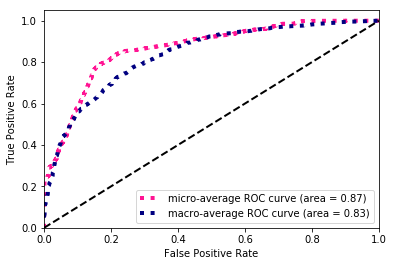

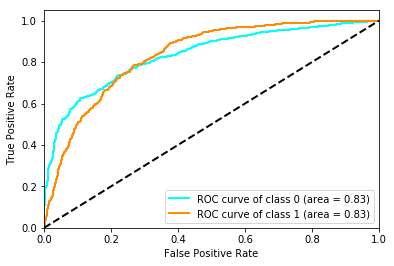

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.884568,0.427217,0.655892,0.807858,0.831346
precision,0.942741,0.327071,0.634906,0.807858,0.871095
recall,0.833157,0.615756,0.724456,0.807858,0.807858
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.834301,0.834301,0.834619,0.865099,NaN


******************** RNN_embed_wo_geo ********************
**********  round  0
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_16 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_31 (LST

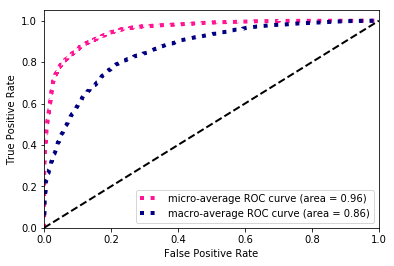

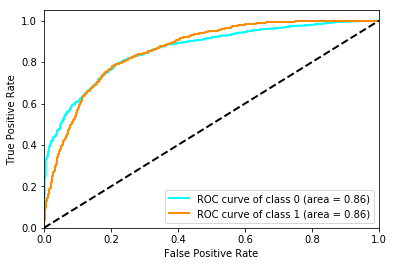

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.933557,0.439541,0.686549,0.881197,0.876068
precision,0.922838,0.487280,0.705059,0.881197,0.872152
recall,0.944527,0.400322,0.672424,0.881197,0.881197
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.861077,0.861077,0.861394,0.955491,NaN


******************** RNN_embed_wo_geo ********************
**********  round  1
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_17 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_33 (LST

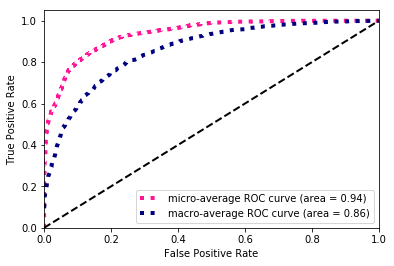

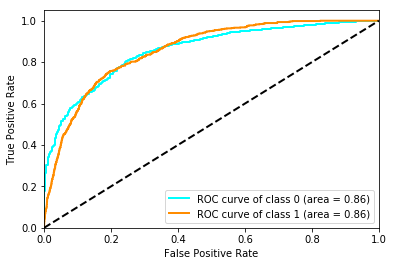

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.915154,0.497409,0.706282,0.854818,0.866541
precision,0.946190,0.416486,0.681338,0.854818,0.884548
recall,0.886089,0.617363,0.751726,0.854818,0.854818
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.856967,0.856967,0.857301,0.935413,NaN


******************** RNN_embed_wo_geo ********************
**********  round  2
load and test: shapes for train and test, X/Y
(26555, 251)
(26555, 2)
(5345, 251)
(5345, 2)
(26555, 8, 17)
(26555,)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
geo_code (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
main_input (InputLayer)         (None, 8, 17)        0                                            
__________________________________________________________________________________________________
embedding_18 (Embedding)        (None, 1, 128)       119680      geo_code[0][0]                   
__________________________________________________________________________________________________
lstm_35 (LST

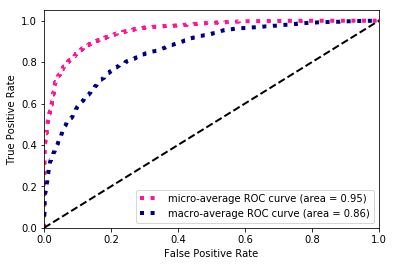

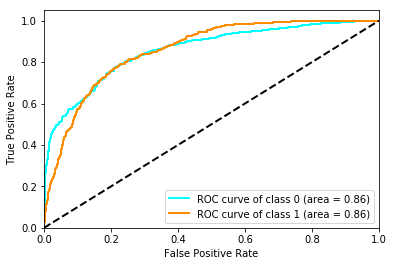

,0,1,macro avg,micro avg,weighted avg
index,,,,,
f1-score,0.929903,0.468700,0.699301,0.876146,0.876232
precision,0.930100,0.467949,0.699024,0.876146,0.876319
recall,0.929706,0.469453,0.699580,0.876146,0.876146
support,4723.000000,622.000000,5345.000000,5345.000000,5345.000000
auc,0.858263,0.858263,0.858576,0.949422,NaN


In [17]:
Dallas = compare_models(city = 'Dallas',classname='RNN_embed')

In [18]:
Dallas.to_hdf('Dallas.h5',key='RNN_embed')
Dallas

,NL,geohash,traffic,weather,time,geo
0_f1-score,0.935303,0.936511,0.926054,0.931953,0.920336,0.926204
1_f1-score,0.450679,0.422048,0.481641,0.466863,0.142406,0.468550
weighted avg_f1-score,0.878907,0.876643,0.874337,0.877831,0.829808,0.872947
micro avg_f1-score,0.884316,0.885625,0.870845,0.879326,0.858372,0.870720
macro avg_f1-score,0.692991,0.679279,0.703848,0.699408,0.531371,0.697377
0_precision,0.924369,0.919006,0.935807,0.928749,0.903333,0.933043
1_precision,0.506848,0.513374,0.458824,0.480436,0.109024,0.457238
weighted avg_precision,0.875782,0.871803,0.880300,0.876579,0.810899,0.877673
micro avg_precision,0.884316,0.885625,0.870845,0.879326,0.858372,0.870720
macro avg_precision,0.715608,0.716190,0.697316,0.704593,0.506178,0.695140
